## ENSO influence on Antarctic coastal ocean

In [51]:
# Load modules
%pylab inline
from netCDF4 import Dataset # to work with NetCDF files
import numpy as np
import matplotlib.pyplot as plt # to generate plots
from mpl_toolkits.basemap import Basemap # plot on map projections
from os.path import expanduser
home = expanduser("~") # Get users home directory
import os # operating system interface
import scipy as sp
import xarray as xr
from xarray.ufuncs import square, sqrt
import scipy.interpolate
import scipy.ndimage
import scipy.io



Populating the interactive namespace from numpy and matplotlib


/g/data3/hh5/public/apps/miniconda3/envs/analysis27-18.01/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['square', 'sqrt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [2]:
#extract the MOM model grid info - 50 and 75 vertical levels
hgrid_file ='/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080/mom025_ocean_grid.nc'
vgrid_file ='/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080/ocean.ncra501-520.nc'

# Extract the variables
nc = Dataset(hgrid_file, mode='r') # file handle, open in read only mode
geolon_t = nc.variables['geolon_t'][:]
geolat_t = nc.variables['geolat_t'][:]
area_t = nc.variables['area_t'][:]
dxt = nc.variables['dxt'][:]
dyt = nc.variables['dyt'][:]
kmu = nc.variables['kmu'][:]
kmt = nc.variables['kmt'][:]
ht = nc.variables['ht'][:]
fcor = nc.variables['f_coriolis'][:]
nc.close() # close the file
print geolon_t.shape

fh=fcor/ht
print fh.shape

nc = Dataset(vgrid_file, mode='r') # file handle, open in read only mode
sw_ocean = nc.variables['sw_ocean'][:]
st_ocean = nc.variables['st_ocean'][:]
yt_ocean = nc.variables['yt_ocean'][:]
yu_ocean = nc.variables['yu_ocean'][:]
xt_ocean = nc.variables['xt_ocean'][:]
potrho = nc.variables['potrho'][:]
nc.close() # close the file
print st_ocean.shape
print potrho.shape
print yt_ocean.shape

nc = Dataset('/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080/output200/ocean.nc', mode='r') # file handle, open in read only mode
dzt = nc.variables['dzt'][0,:,:,:]
nc.close() # close the file

print dzt.shape
#dzt=np.squeeze(dzt)
#print dzt.shape


(1080, 1440)
(1080, 1440)
(50,)
(80,)
(1080,)
(50, 1080, 1440)


In [3]:
#A = xr.DataArray(np.arange(100))
#A.cumsum(axis=0)
print (xr.__version__)

#my xarray version is old, no cumsum. Should be version 0.9.2 or newer?

0.10.2


The Bellingshausen Sea is an area along the west side of the Antarctic Peninsula between 57°18'W and 102°20'W, west of Alexander Island, east of Cape Flying Fish on Thurston Island, and south of Peter I Island (there the southern Vostokkysten).

WAP range
i=821 to 872

BS range
i=716 to i=820

AS range
i=613 to i=714

In [4]:
NYFCntrlDir = '/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080_cp/'
#this has 3 years of a wind perturbation - get a nice 3 year polynya.
NYFPertDir = '/g/data1/v45/pas561/mom/archive/gfdl_nyf_iafAntSOI/'


In [23]:
Ocean_File = os.path.join(NYFCntrlDir,'output*/ocean.nc')
print Ocean_File
cntrl=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print cntrl.temp.shape


Ocean_File = os.path.join(NYFPertDir,'output*/ocean.nc')
print Ocean_File
pert=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print pert.temp.shape

/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080_cp/output*/ocean.nc
(50, 50, 1080, 1440)
/g/data1/v45/pas561/mom/archive/gfdl_nyf_iafAntSOI/output*/ocean.nc
(50, 50, 1080, 1440)


In [63]:
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
#print clev
print yrs.shape

print st_ocean[16]
st=16

yr = nonzero(yrs == 1973)[0][0]
print yrs[yr]
print yr

clev3 = np.arange(0,1500,1000)
print clev3
print yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4')

(50,)
201.262954712
1973
5
[   0 1000]
1973-1974


201.262954712
1972
4
1982
14
1997
29
2015
47


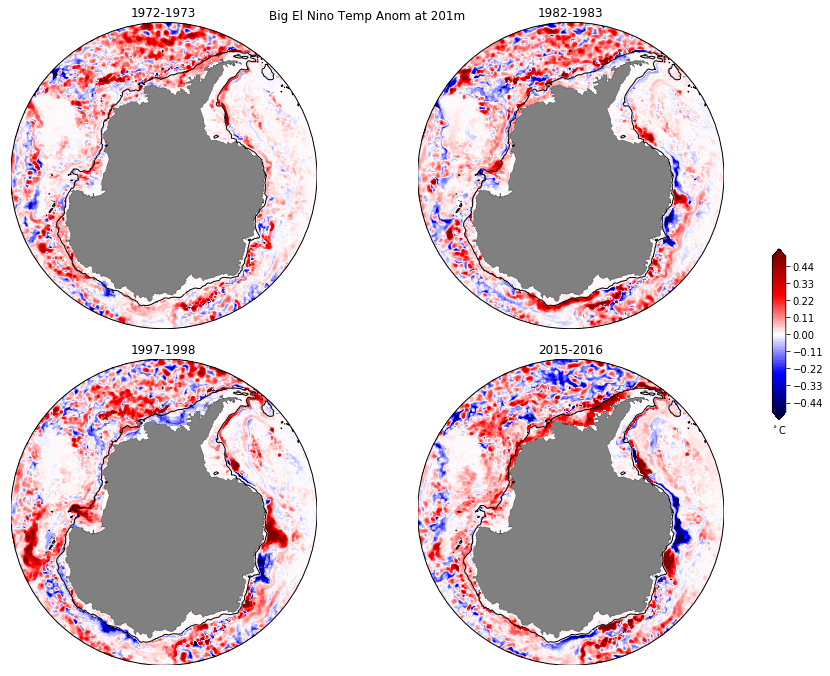

In [64]:
#plot temp anom
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Big El Nino Temp Anom at 201m')
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
print st_ocean[16]
st=16

yr = nonzero(yrs == 1972)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1982)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1997)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2015)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_EN_anom.png')
plt.savefig(of,dpi=220)



201.262954712
1972
4
1982
14
1997
29
2015
47


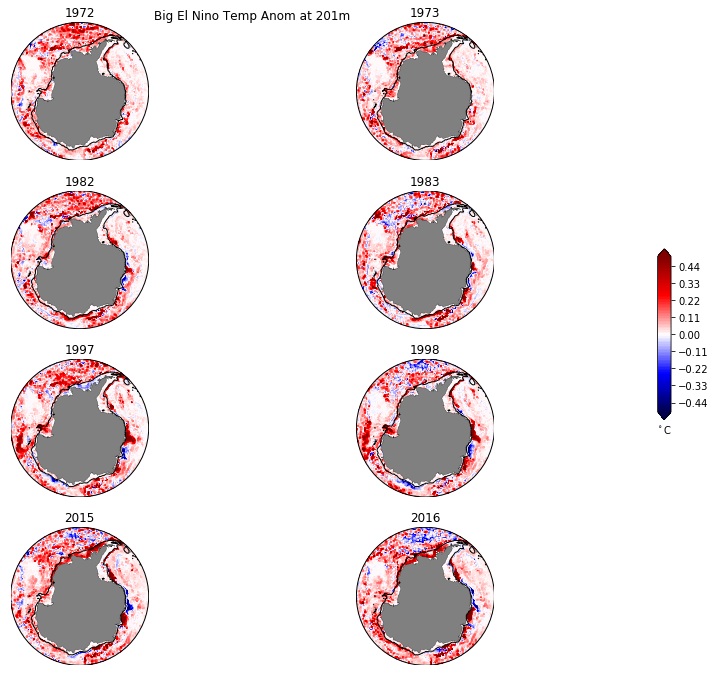

In [65]:
#plot temp anom
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Big El Nino Temp Anom at 201m')
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
print st_ocean[16]
st=16

yr = nonzero(yrs == 1972)[0][0]
print yrs[yr]
print yr

plt.subplot(4,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr,st,0:250,:].load()-cntrl.temp[yr,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4'))

plt.subplot(4,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr+1,st,0:250,:].load()-cntrl.temp[yr+1,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr+1].astype('S4'))


yr = nonzero(yrs == 1982)[0][0]
print yrs[yr]
print yr

plt.subplot(4,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr,st,0:250,:].load()-cntrl.temp[yr,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4'))

plt.subplot(4,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr+1,st,0:250,:].load()-cntrl.temp[yr+1,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1997)[0][0]
print yrs[yr]
print yr

plt.subplot(4,2,5)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr,st,0:250,:].load()-cntrl.temp[yr,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4'))

plt.subplot(4,2,6)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr+1,st,0:250,:].load()-cntrl.temp[yr+1,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2015)[0][0]
print yrs[yr]
print yr

plt.subplot(4,2,7)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr,st,0:250,:].load()-cntrl.temp[yr,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4'))

plt.subplot(4,2,8)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr+1,st,0:250,:].load()-cntrl.temp[yr+1,st,0:250,:].load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr+1].astype('S4'))


ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_EN_anom2.png')
plt.savefig(of,dpi=220)



201.262954712
1988
20
1999
31
2007
39
2010
42


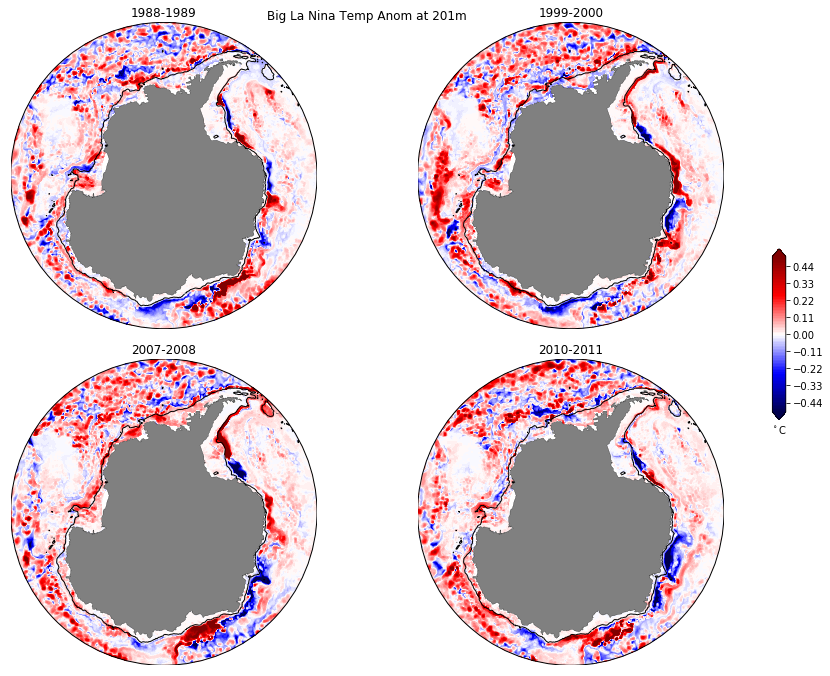

In [143]:
#plot temp anom
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Big La Nina Temp Anom at 201m')
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
print st_ocean[16]
st=16

yr = nonzero(yrs == 1988)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1999)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2007)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2010)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,pert.temp[yr:yr+1,st,0:250,:].mean('time').load()-cntrl.temp[yr:yr+1,st,0:250,:].mean('time').load(), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_LN_anom.png')
plt.savefig(of,dpi=220)



In [5]:
#now do time-series in each region.
#only for ht<1000m
of = os.path.join(NYFPertDir,'temp.cat01to25.diff.nc')
nc = Dataset(of, mode='r') # file handle, open in read only mode
tanom = nc.variables['temp'][:,:,0:250,:]
nc.close() # close the file

print tanom.shape


(50, 50, 250, 1440)


In [6]:
#Nan all values where ht>1000
#print ht.shape
#msk=ht[0:250,:].copy()
#print msk.shape
#msk[np.where(ht[0:250,:]>0)]=1
#msk[np.where(ht[0:250,:]>1000)]=NaN

print ht.shape
msk=np.ones((tanom.shape[2],tanom.shape[3]))
msk[np.where(ht[0:250,:]>1000)]=NaN
#print msk[:,1000]


tanom=tanom*msk

(1080, 1440)


(50, 50, 250, 1440)
201.262954712
1972
4


/g/data3/hh5/public/apps/miniconda3/envs/analysis27-18.01/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:1711: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:
/g/data3/hh5/public/apps/miniconda3/envs/analysis27-18.01/lib/python2.7/site-packages/numpy/ma/core.py:852: RuntimeWarning: invalid value encountered in greater_equal
  return umath.absolute(a) * self.tolerance >= umath.absolute(b)


1982
14
1997
29
2015
47


/g/data3/hh5/public/apps/miniconda3/envs/analysis27-18.01/lib/python2.7/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


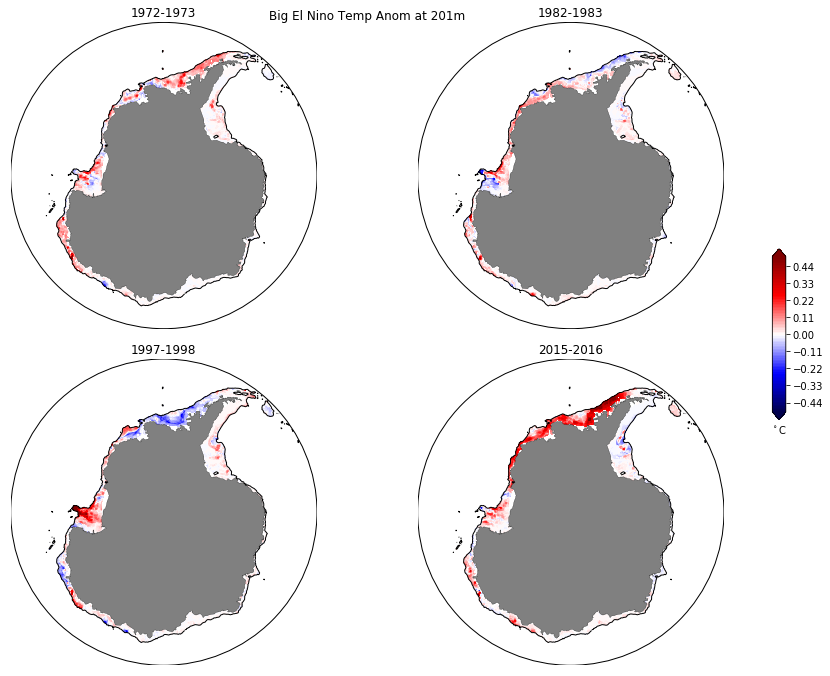

In [7]:
print tanom.shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Big El Nino Temp Anom at 201m')
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
print st_ocean[16]
st=16

yr = nonzero(yrs == 1972)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1982)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1997)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2015)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_EN_anom.png')
plt.savefig(of,dpi=220)


(50, 50, 250, 1440)
201.262954712
1988
20
1999
31
2007
39
2010
42


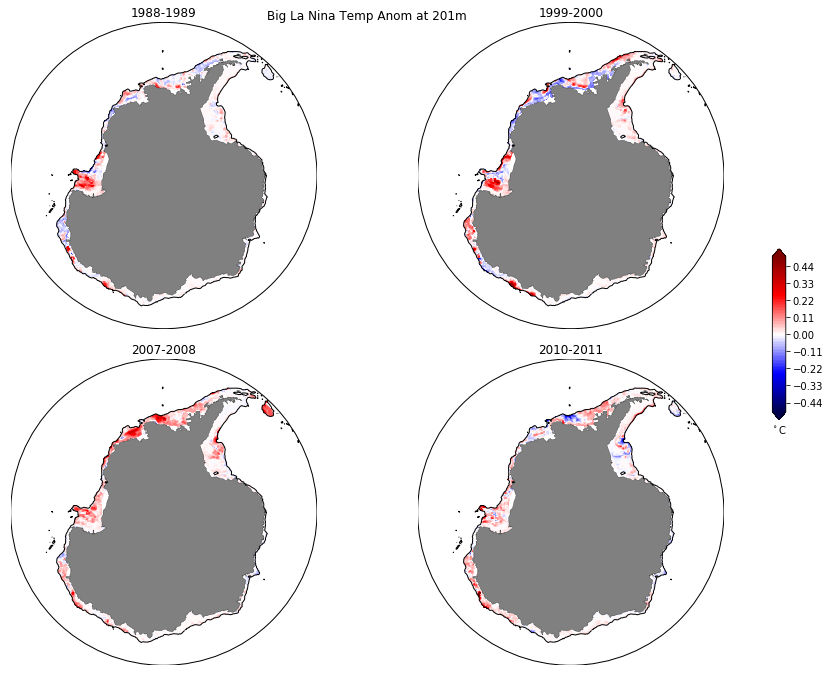

In [8]:
#plot temp anom
print tanom.shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Big La Nina Temp Anom at 201m')
clev = np.arange(-.5,0.51,.01)
yrs=np.arange(1968,2018,1)
print st_ocean[16]
st=16

yr = nonzero(yrs == 1988)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 1999)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2007)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

yr = nonzero(yrs == 2010)[0][0]
print yrs[yr]
print yr

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tanom[yr:yr+1,st,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title(yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_LN_anom.png')
plt.savefig(of,dpi=220)


In [9]:
print ht[0:50,1000]
print tanom[0,st,0:50,1000]
msk=np.ones((tanom.shape[2],tanom.shape[3]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print msk[0:50,1000]

[-- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
 -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- 40.46738815307617
 40.46738815307617 81.59939575195312 151.8946533203125 223.08717346191406
 284.163818359375 342.7684326171875 381.96636962890625 397.6492614746094
 399.9978942871094]
[-- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
 -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
 -0.003059983253479004 -0.004214644432067871 -0.004436969757080078
 -0.0030657052993774414 -0.0012923479080200195 0.0012711286544799805]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


In [10]:
#WAP range
#i=821 to 872
#BS range
#i=716 to i=820
#AS range
#i=613 to i=714

msk=np.ones((tanom.shape[2],tanom.shape[3]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print np.nansum(area_t)
print st_ocean[st]

i1=821
i2=872
wap_tanom=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    wap_tanom[yr]=np.nansum(tanom[yr,st,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    wap_tanom[yr]=wap_tanom[yr]/tarea

print tarea
print wap_tanom

i1=716
i2=820
bs_tanom=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    bs_tanom[yr]=np.nansum(tanom[yr,st,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    bs_tanom[yr]=bs_tanom[yr]/tarea

print tarea
print bs_tanom

i1=613
i2=714
as_tanom=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    as_tanom[yr]=np.nansum(tanom[yr,st,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    as_tanom[yr]=as_tanom[yr]/tarea

print tarea
print as_tanom


5.07057e+14
201.262954712
366844120624.0
[[ 0.00049581]
 [ 0.01221222]
 [ 0.01681424]
 [ 0.01043347]
 [ 0.03290613]
 [ 0.04858142]
 [ 0.03378742]
 [ 0.01166806]
 [ 0.04104921]
 [ 0.03350903]
 [ 0.01892071]
 [ 0.02720849]
 [ 0.02075799]
 [-0.02752967]
 [-0.03383325]
 [-0.04054926]
 [-0.04606169]
 [-0.0215513 ]
 [-0.00686459]
 [-0.00074882]
 [-0.00636379]
 [-0.04678395]
 [-0.02604654]
 [-0.03598056]
 [-0.02858772]
 [-0.03205601]
 [-0.03070527]
 [-0.05080428]
 [-0.02838381]
 [-0.02270447]
 [ 0.00497184]
 [ 0.00494858]
 [-0.00841002]
 [-0.01513756]
 [ 0.03837097]
 [ 0.08485742]
 [ 0.06427075]
 [ 0.02840802]
 [ 0.00530028]
 [-0.00013648]
 [ 0.01114147]
 [ 0.00298064]
 [ 0.01416184]
 [ 0.0076045 ]
 [ 0.05400993]
 [ 0.10069452]
 [ 0.12271349]
 [ 0.08611021]
 [ 0.01843474]
 [-0.00453058]]
293159054104.0
[[-0.00422728]
 [ 0.01781237]
 [ 0.03542832]
 [ 0.00980686]
 [ 0.02510496]
 [ 0.06840703]
 [ 0.04409143]
 [ 0.01439274]
 [-0.00139109]
 [ 0.03291459]
 [ 0.0319871 ]
 [ 0.00912255]
 [ 0.01344684

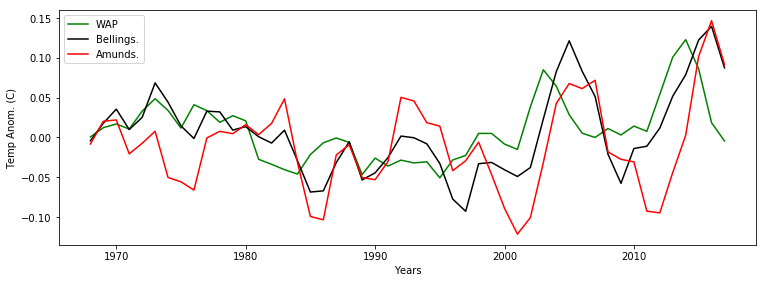

In [11]:
plt.subplot(211)
plt.plot(yrs,wap_tanom,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,bs_tanom,linestyle='-',color='k',label='Bellings.',linewidth=1.5)
plt.plot(yrs,as_tanom,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp Anom. (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')
plt.legend(fontsize=10)


In [12]:
#now do time-series in each region.
#only for ht<1000m
of = os.path.join(NYFPertDir,'temp.cat01to25.nc')
nc = Dataset(of, mode='r') # file handle, open in read only mode
tpert = nc.variables['temp'][:,st,0:250,:]
nc.close() # close the file

print tpert.shape
print ht.shape
msk=np.ones((tpert.shape[1],tpert.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=NaN
#print msk[:,1000]

tpert=tpert*msk

#now do time-series in each region.
#only for ht<1000m
of = os.path.join(NYFCntrlDir,'temp.cat01to25.nc')
nc = Dataset(of, mode='r') # file handle, open in read only mode
tcntrl = nc.variables['temp'][:,st,0:250,:]
nc.close() # close the file

print tcntrl.shape
print ht.shape
msk=np.ones((tcntrl.shape[1],tcntrl.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=NaN
#print msk[:,1000]

tcntrl=tcntrl*msk

(50, 250, 1440)
(1080, 1440)
(50, 250, 1440)
(1080, 1440)


(50, 250, 1440)
2015
47


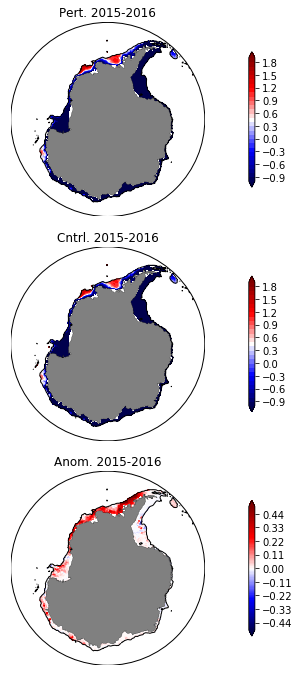

In [13]:
print tpert.shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
yrs=np.arange(1968,2018,1)

yr = nonzero(yrs == 2015)[0][0]
print yrs[yr]
print yr

clev = np.arange(-1,2,.1)

plt.subplot(3,1,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tpert[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Pert. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

plt.subplot(3,1,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tcntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Cntrl. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

clev = np.arange(-.5,0.51,.01)
plt.subplot(3,1,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tpert[yr:yr+1,:,:].mean(axis=0)-tcntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Anom. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

#ax3 = plt.axes([0.95,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

In [14]:
msk=np.ones((tpert.shape[1],tpert.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print np.nansum(area_t)
print st_ocean[st]

i1=821
i2=872
wap_tpert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    wap_tpert[yr]=np.nansum(tpert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    wap_tpert[yr]=wap_tpert[yr]/tarea

print tarea
print wap_tpert

i1=716
i2=820
bs_tpert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    bs_tpert[yr]=np.nansum(tpert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    bs_tpert[yr]=bs_tpert[yr]/tarea

print tarea
print bs_tpert

i1=613
i2=714
as_tpert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    as_tpert[yr]=np.nansum(tpert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    as_tpert[yr]=as_tpert[yr]/tarea

print tarea
print as_tpert


5.07057e+14
201.262954712
366844120624.0
[[ 0.47945948]
 [ 0.49074357]
 [ 0.50212971]
 [ 0.50010428]
 [ 0.50621624]
 [ 0.51982931]
 [ 0.50981624]
 [ 0.49669915]
 [ 0.5191069 ]
 [ 0.53077636]
 [ 0.51302943]
 [ 0.50805734]
 [ 0.49916822]
 [ 0.47747744]
 [ 0.47504527]
 [ 0.46576541]
 [ 0.44469093]
 [ 0.45770362]
 [ 0.46673564]
 [ 0.470632  ]
 [ 0.47942677]
 [ 0.46748351]
 [ 0.47491412]
 [ 0.46876292]
 [ 0.4688026 ]
 [ 0.48024811]
 [ 0.47680166]
 [ 0.47628973]
 [ 0.48368882]
 [ 0.49326314]
 [ 0.5116663 ]
 [ 0.49284104]
 [ 0.48524488]
 [ 0.49108394]
 [ 0.52639027]
 [ 0.55611919]
 [ 0.53607667]
 [ 0.51500775]
 [ 0.49521481]
 [ 0.48521374]
 [ 0.47216582]
 [ 0.45894693]
 [ 0.47753216]
 [ 0.47155247]
 [ 0.51594818]
 [ 0.54743408]
 [ 0.60238138]
 [ 0.58276372]
 [ 0.53437234]
 [ 0.50168964]]
293159054104.0
[[ 0.04730306]
 [ 0.0751291 ]
 [ 0.10587521]
 [ 0.10683791]
 [ 0.13132536]
 [ 0.17035064]
 [ 0.14205279]
 [ 0.10087908]
 [ 0.08533414]
 [ 0.1266505 ]
 [ 0.13643733]
 [ 0.12468783]
 [ 0.12822217

In [15]:

msk=np.ones((tcntrl.shape[1],tcntrl.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print np.nansum(area_t)
print st_ocean[st]

i1=821
i2=872
wap_tcntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    wap_tcntrl[yr]=np.nansum(tcntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    wap_tcntrl[yr]=wap_tcntrl[yr]/tarea

print tarea
print wap_tcntrl

i1=716
i2=820
bs_tcntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    bs_tcntrl[yr]=np.nansum(tcntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    bs_tcntrl[yr]=bs_tcntrl[yr]/tarea

print tarea
print bs_tcntrl

i1=613
i2=714
as_tcntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    as_tcntrl[yr]=np.nansum(tcntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    as_tcntrl[yr]=as_tcntrl[yr]/tarea

print tarea
print as_tcntrl


5.07057e+14
201.262954712
366844120624.0
[[ 0.47896366]
 [ 0.47853136]
 [ 0.48531547]
 [ 0.4896708 ]
 [ 0.47331011]
 [ 0.47124789]
 [ 0.47602882]
 [ 0.48503109]
 [ 0.47805769]
 [ 0.49726733]
 [ 0.49410872]
 [ 0.48084885]
 [ 0.47841023]
 [ 0.50500711]
 [ 0.50887853]
 [ 0.50631467]
 [ 0.49075263]
 [ 0.47925492]
 [ 0.47360023]
 [ 0.47138082]
 [ 0.48579056]
 [ 0.51426747]
 [ 0.50096065]
 [ 0.50474348]
 [ 0.49739032]
 [ 0.51230412]
 [ 0.50750693]
 [ 0.52709401]
 [ 0.51207264]
 [ 0.51596761]
 [ 0.50669446]
 [ 0.48789246]
 [ 0.49365489]
 [ 0.5062215 ]
 [ 0.4880193 ]
 [ 0.47126177]
 [ 0.47180592]
 [ 0.48659973]
 [ 0.48991453]
 [ 0.48535022]
 [ 0.46102435]
 [ 0.45596629]
 [ 0.46337031]
 [ 0.46394797]
 [ 0.46193825]
 [ 0.44673956]
 [ 0.47966789]
 [ 0.4966535 ]
 [ 0.5159376 ]
 [ 0.50622022]]
293159054104.0
[[ 0.05153034]
 [ 0.05731674]
 [ 0.0704469 ]
 [ 0.09703106]
 [ 0.1062204 ]
 [ 0.1019436 ]
 [ 0.09796136]
 [ 0.08648634]
 [ 0.08672523]
 [ 0.0937359 ]
 [ 0.10445023]
 [ 0.11556529]
 [ 0.11477533

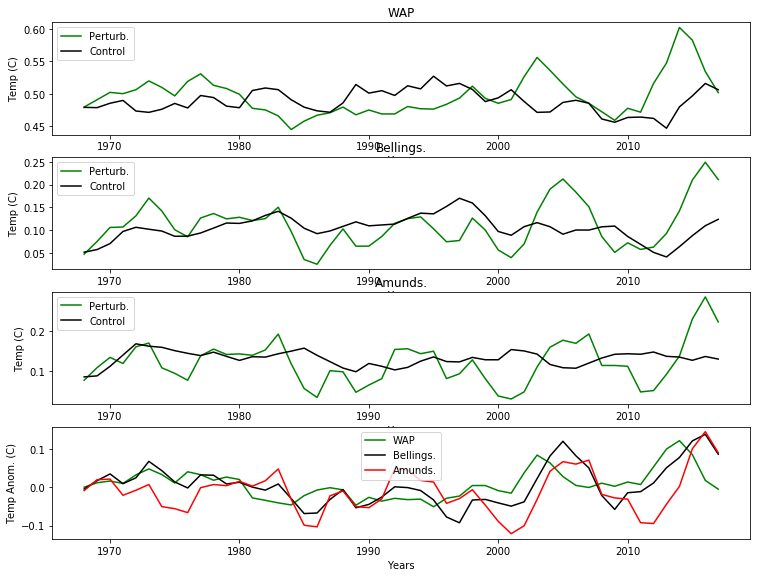

In [16]:
plt.subplot(411)
plt.plot(yrs,wap_tpert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,wap_tcntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('WAP')
plt.legend(fontsize=10)

plt.subplot(412)
plt.plot(yrs,bs_tpert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,bs_tcntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Bellings.')
plt.legend(fontsize=10)

plt.subplot(413)
plt.plot(yrs,as_tpert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,as_tcntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Amunds.')
plt.legend(fontsize=10)

plt.subplot(414)
plt.plot(yrs,wap_tpert-wap_tcntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='k',label='Bellings.',linewidth=1.5)
plt.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp Anom. (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')
plt.legend(fontsize=10)

of = os.path.join(NYFPertDir,'temp_ENSO_ts_anom.png')
plt.savefig(of,dpi=220)

In [26]:
#Do tau_x and ssh time-series in each region.
#only for ht<1000m
of = os.path.join(NYFPertDir,'tx_ssh.cat01to25.nc')
nc = Dataset(of, mode='r') # file handle, open in read only mode
tx_pert = nc.variables['tau_x'][:,0:250,:]
ssh_pert = nc.variables['sea_level'][:,0:250,:]
nc.close() # close the file

print tx_pert.shape
print ht.shape
msk=np.ones((tx_pert.shape[1],tx_pert.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=NaN
#print msk[:,1000]

tx_pert=tx_pert*msk
ssh_pert=ssh_pert*msk

print NYFCntrlDir

of = os.path.join(NYFCntrlDir,'tx_ssh.cat01to25.nc')
nc = Dataset(of, mode='r') # file handle, open in read only mode
ssh_cntrl = nc.variables['sea_level'][:,0:250,:]
tx_cntrl = nc.variables['tau_x'][:,0:250,:]
nc.close() # close the file

print tx_cntrl.shape
print ht.shape
msk=np.ones((tx_cntrl.shape[1],tx_cntrl.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=NaN
#print msk[:,1000]

tx_cntrl=tx_cntrl*msk
ssh_cntrl=ssh_cntrl*msk

(50, 250, 1440)
(1080, 1440)
/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080_cp/
(50, 250, 1440)
(1080, 1440)


(50, 250, 1440)
1997
29


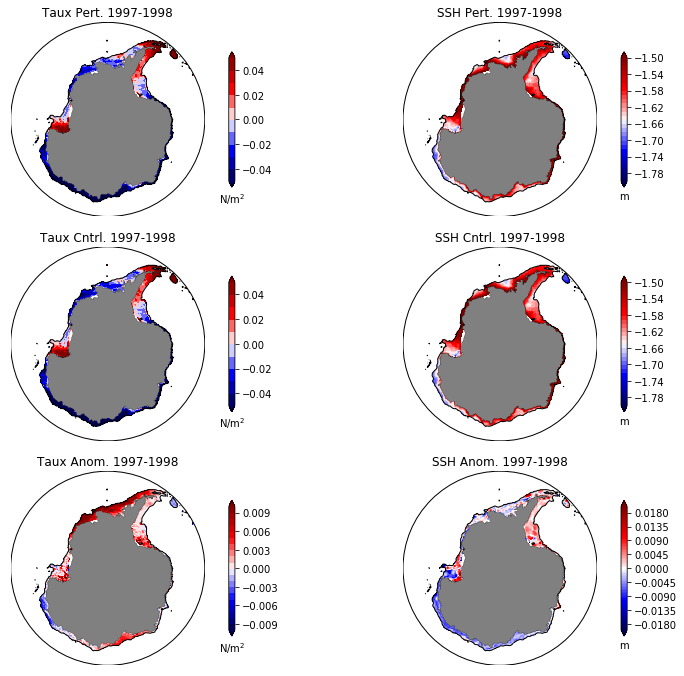

In [46]:
print tx_pert.shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
yrs=np.arange(1968,2018,1)

yr = nonzero(yrs == 1997)[0][0]
print yrs[yr]
print yr

clev = np.arange(-.05,.051,.01)

plt.subplot(3,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_pert[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Pert. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

plt.subplot(3,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Cntrl. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

clev = np.arange(-.01,0.011,.001)
plt.subplot(3,2,5)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_pert[yr:yr+1,:,:].mean(axis=0)-tx_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Anom. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


clev = np.arange(-1.8,-1.5,.01)

plt.subplot(3,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_pert[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Pert. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

plt.subplot(3,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Cntrl. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

clev = np.arange(-0.02,0.0205,.0005)
plt.subplot(3,2,6)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_pert[yr:yr+1,:,:].mean(axis=0)-ssh_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Anom. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

#ax3 = plt.axes([0.95,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

(50, 250, 1440)
2015
47


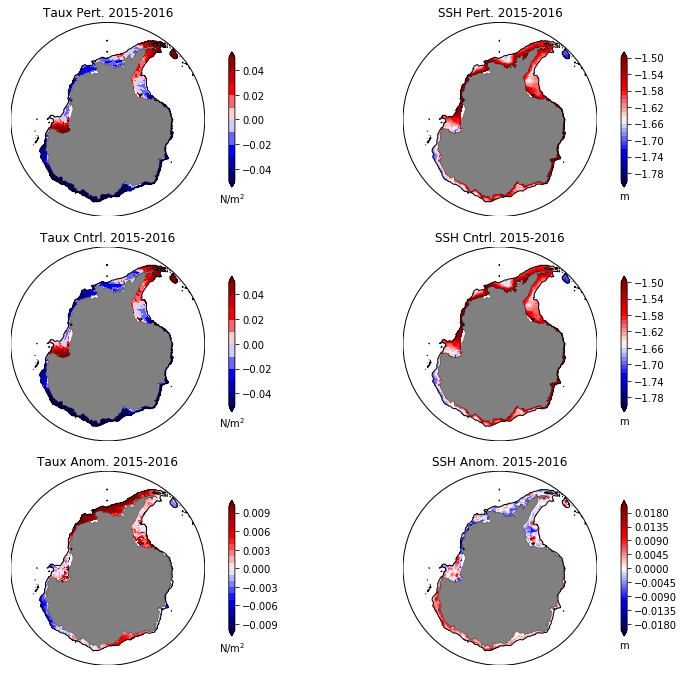

In [47]:
print tx_pert.shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
yrs=np.arange(1968,2018,1)

yr = nonzero(yrs == 2015)[0][0]
print yrs[yr]
print yr

clev = np.arange(-.05,.051,.01)

plt.subplot(3,2,1)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_pert[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Pert. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

plt.subplot(3,2,3)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Cntrl. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

clev = np.arange(-.01,0.011,.001)
plt.subplot(3,2,5)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,tx_pert[yr:yr+1,:,:].mean(axis=0)-tx_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('N/m$^2$')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('Taux Anom. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))


clev = np.arange(-1.8,-1.5,.01)

plt.subplot(3,2,2)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_pert[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Pert. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

plt.subplot(3,2,4)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Cntrl. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

clev = np.arange(-0.02,0.0205,.0005)
plt.subplot(3,2,6)
map = Basemap(projection='spstere',boundinglat=-60,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
X, Y = map(geolon_t[0:250,:],geolat_t[0:250,:]) 
p1=map.contourf(X,Y,ssh_pert[yr:yr+1,:,:].mean(axis=0)-ssh_cntrl[yr:yr+1,:,:].mean(axis=0), cmap=plt.cm.seismic, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
clev3 = 1000
map.contour(X,Y,ht[0:250,:],levels=clev3,colors='k',linewidths=1)
plt.title('SSH Anom. '+yrs[yr].astype('S4')+'-'+yrs[yr+1].astype('S4'))

#ax3 = plt.axes([0.95,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$^\circ$C')

plt.tight_layout()

In [41]:
msk=np.ones((tx_pert.shape[1],tx_pert.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print np.nansum(area_t)
print st_ocean[st]

i1=821
i2=872
wap_tx_pert=np.zeros((50,1))
wap_ssh_pert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    wap_tx_pert[yr]=np.nansum(tx_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    wap_ssh_pert[yr]=np.nansum(ssh_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    wap_tx_pert[yr]=wap_tx_pert[yr]/tarea
    wap_ssh_pert[yr]=wap_ssh_pert[yr]/tarea

print tarea
#print wap_tx_pert

i1=716
i2=820
bs_tx_pert=np.zeros((50,1))
bs_ssh_pert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    bs_tx_pert[yr]=np.nansum(tx_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    bs_ssh_pert[yr]=np.nansum(ssh_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    bs_tx_pert[yr]=bs_tx_pert[yr]/tarea
    bs_ssh_pert[yr]=bs_ssh_pert[yr]/tarea

print tarea
#print bs_tx_pert

i1=613
i2=714
as_tx_pert=np.zeros((50,1))
as_ssh_pert=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    as_tx_pert[yr]=np.nansum(tx_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    as_ssh_pert[yr]=np.nansum(ssh_pert[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    as_tx_pert[yr]=as_tx_pert[yr]/tarea
    as_ssh_pert[yr]=as_ssh_pert[yr]/tarea

print tarea
#print as_tx_pert


5.07057e+14
201.262954712
366844120624.0
293159054104.0
176677553624.0


In [42]:

msk=np.ones((tx_cntrl.shape[1],tx_cntrl.shape[2]))
msk[np.where(ht[0:250,:]>1000)]=0
msk[np.where(ht[0:250,:]<0)]=0

print np.nansum(area_t)
print st_ocean[st]

i1=821
i2=872
wap_tx_cntrl=np.zeros((50,1))
wap_ssh_cntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    wap_tx_cntrl[yr]=np.nansum(tx_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    wap_ssh_cntrl[yr]=np.nansum(ssh_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    wap_tx_cntrl[yr]=wap_tx_cntrl[yr]/tarea
    wap_ssh_cntrl[yr]=wap_ssh_cntrl[yr]/tarea

print tarea
#print wap_tx_cntrl

i1=716
i2=820
bs_tx_cntrl=np.zeros((50,1))
bs_ssh_cntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    bs_tx_cntrl[yr]=np.nansum(tx_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    bs_ssh_cntrl[yr]=np.nansum(ssh_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    bs_tx_cntrl[yr]=bs_tx_cntrl[yr]/tarea
    bs_ssh_cntrl[yr]=bs_ssh_cntrl[yr]/tarea

print tarea
#print bs_tx_cntrl

i1=613
i2=714
as_tx_cntrl=np.zeros((50,1))
as_ssh_cntrl=np.zeros((50,1))
for yr in range(0,50):
    #print yrs[yr]
    as_tx_cntrl[yr]=np.nansum(tx_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    as_ssh_cntrl[yr]=np.nansum(ssh_cntrl[yr,:,i1:i2]*area_t[0:250,i1:i2]*msk[:,i1:i2])
    tarea=np.sum(area_t[0:250,i1:i2]*msk[:,i1:i2])
    #print tarea
    as_tx_cntrl[yr]=as_tx_cntrl[yr]/tarea
    as_ssh_cntrl[yr]=as_ssh_cntrl[yr]/tarea

print tarea
#print as_tx_cntrl


5.07057e+14
201.262954712
366844120624.0
293159054104.0
176677553624.0


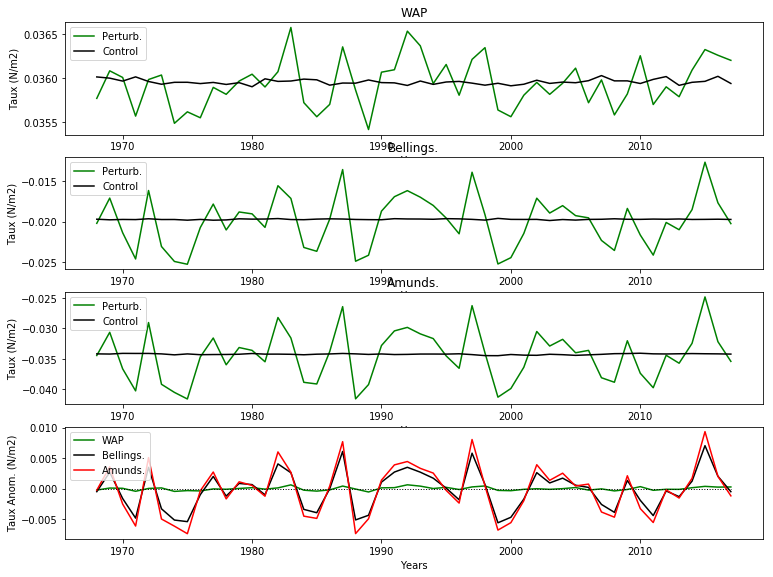

In [48]:
plt.subplot(411)
plt.plot(yrs,wap_tx_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,wap_tx_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Taux (N/m2)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('WAP')
plt.legend(fontsize=10)

plt.subplot(412)
plt.plot(yrs,bs_tx_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,bs_tx_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Taux (N/m2)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Bellings.')
plt.legend(fontsize=10)

plt.subplot(413)
plt.plot(yrs,as_tx_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,as_tx_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Taux (N/m2)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Amunds.')
plt.legend(fontsize=10)

plt.subplot(414)
plt.plot(yrs,wap_tx_pert-wap_tx_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,bs_tx_pert-bs_tx_cntrl,linestyle='-',color='k',label='Bellings.',linewidth=1.5)
plt.plot(yrs,as_tx_pert-as_tx_cntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
plt.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
plt.ylabel('Taux Anom. (N/m2)')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')
plt.legend(fontsize=10)

of = os.path.join(NYFPertDir,'taux_ENSO_ts_anom.png')
plt.savefig(of,dpi=220)

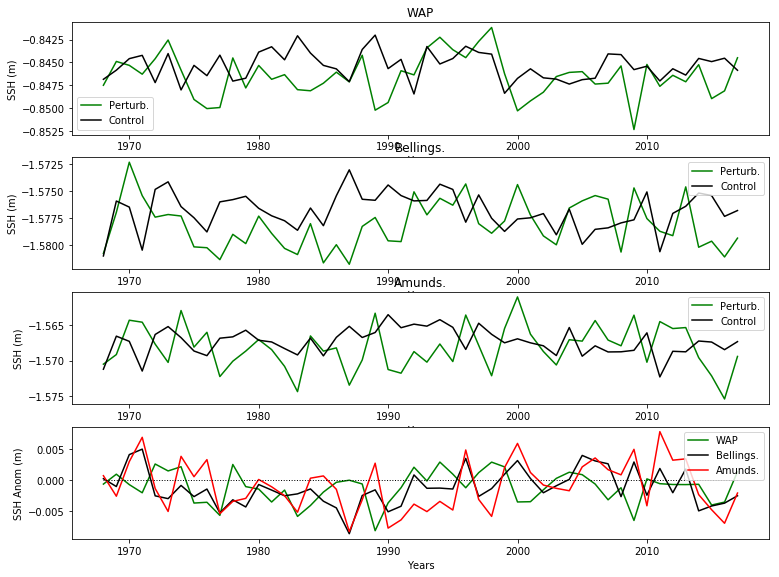

In [49]:
#do ssh 
plt.subplot(411)
plt.plot(yrs,wap_ssh_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,wap_ssh_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('SSH (m)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('WAP')
plt.legend(fontsize=10)

plt.subplot(412)
plt.plot(yrs,bs_ssh_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,bs_ssh_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('SSH (m)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Bellings.')
plt.legend(fontsize=10)

plt.subplot(413)
plt.plot(yrs,as_ssh_pert,linestyle='-',color='g',label='Perturb.',linewidth=1.5)
plt.plot(yrs,as_ssh_cntrl,linestyle='-',color='k',label='Control',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('SSH (m)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Amunds.')
plt.legend(fontsize=10)

plt.subplot(414)
plt.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
plt.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='-',color='k',label='Bellings.',linewidth=1.5)
plt.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
plt.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
plt.ylabel('SSH Anom (m)')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')
plt.legend(fontsize=10)

of = os.path.join(NYFPertDir,'ssh_ENSO_ts_anom.png')
plt.savefig(of,dpi=220)

In [103]:
def align_yaxis_np(ax1, ax2):
    """Align zeros of the two axes, zooming them out by same ratio"""
    axes = np.array([ax1, ax2])
    extrema = np.array([ax.get_ylim() for ax in axes])
    tops = extrema[:,1] / (extrema[:,1] - extrema[:,0])
    # Ensure that plots (intervals) are ordered bottom to top:
    if tops[0] > tops[1]:
        axes, extrema, tops = [a[::-1] for a in (axes, extrema, tops)]

    # How much would the plot overflow if we kept current zoom levels?
    tot_span = tops[1] + 1 - tops[0]

    extrema[0,1] = extrema[0,0] + tot_span * (extrema[0,1] - extrema[0,0])
    extrema[1,0] = extrema[1,1] + tot_span * (extrema[1,0] - extrema[1,1])
    [axes[i].set_ylim(*extrema[i]) for i in range(2)]

(1788, 1)
1175
(1980, 1)
1367


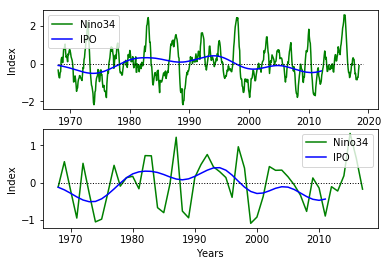

In [78]:
#n34yr = year
#n34mn = month
#n34yrd = year + month/12
#it's 1870-2018
hadsst = sp.io.loadmat('/g/data1a/v45/pas561/mom/archive/gfdl_nyf_iafAntSOI/HadISST_Nino3p4.mat')#,'bat_lat')
hadsst_n34yr=hadsst['n34yr']
hadsst_n34yrd=hadsst['n34yrd']
hadsst_n34=hadsst['n34']
print hadsst_n34yrd.shape
hadsst_yri = nonzero(hadsst_n34yrd == 1968)[0][0]
print hadsst_yri

#print ERSST_ipo[ERSST_yri:ERSST_yri+12]
hadsst_n34_ann=np.zeros((50,1))
i=hadsst_yri
for t in range(50):
        #print hadsst_yri
        hadsst_n34_ann[t]=np.mean(hadsst_n34[i:i+12])
        i=i+12


#ipo = time series
#ipoyr = year
#ipomn = month
#ipoyrd = year + month/12 (edited)
ERSST= sp.io.loadmat('/g/data1a/v45/pas561/mom/archive/gfdl_nyf_iafAntSOI/TPI_ERSSTV5_IPOindex.mat')
ERSST_ipo=ERSST['ipo']
ERSST_ipoyrd=ERSST['ipoyrd']
ERSST_ipoyr=ERSST['ipoyr']
print ERSST_ipo.shape
ERSST_yri = nonzero(ERSST_ipoyrd == 1968)[0][0]
print ERSST_yri

#print ERSST_ipo[ERSST_yri:ERSST_yri+12]
ERSST_ipo_ann=np.zeros((50,1))
i=ERSST_yri
for t in range(50):
        #print ERSST_yri
        ERSST_ipo_ann[t]=np.mean(ERSST_ipo[i:i+12])
        i=i+12

plt.subplot(211)
plt.plot(hadsst_n34yrd[hadsst_yri:],hadsst_n34[hadsst_yri:],linestyle='-',color='g',label='Nino34',linewidth=1.5)
plt.plot(ERSST_ipoyrd[ERSST_yri:],ERSST_ipo[ERSST_yri:],linestyle='-',color='b',label='IPO',linewidth=1.5)
plt.plot(ERSST_ipoyrd[ERSST_yri:],np.zeros((ERSST_ipoyrd[ERSST_yri:].shape)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
plt.ylabel('Index')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('Nino34')
plt.legend(fontsize=10)

plt.subplot(212)
plt.plot(yrs,hadsst_n34_ann,linestyle='-',color='g',label='Nino34',linewidth=1.5)
plt.plot(yrs,ERSST_ipo_ann,linestyle='-',color='b',label='IPO',linewidth=1.5)
plt.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
plt.ylabel('Index')
plt.xlabel('Years')
#plt.xlim([-75,85])
#plt.title('Nino34')
plt.legend(fontsize=10)


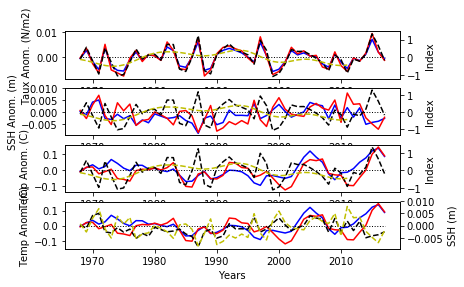

In [105]:
fig=figure()
ax1=plt.subplot(411)
#ax1.plot(yrs,wap_tx_pert-wap_tx_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_tx_pert-bs_tx_cntrl,linestyle='-',color='b',label='Bellings.',linewidth=1.5)
ax1.plot(yrs,as_tx_pert-as_tx_cntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Taux Anom. (N/m2)')
ax1.set_xlabel('Years')
#ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,hadsst_n34_ann,linestyle='--',color='k',label='Nino34',linewidth=1.5)
ax2.plot(yrs,ERSST_ipo_ann,linestyle='--',color='y',label='IPO',linewidth=1.5)
ax2.set_ylabel('Index')
ax2.set_xlabel('Years')
align_yaxis_np(ax1,ax2)
#ax2.legend(fontsize=10)
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')

ax1=plt.subplot(412)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='-',color='b',label='Bellings.',linewidth=1.5)
ax1.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('SSH Anom. (m)')
ax1.set_xlabel('Years')
#ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,hadsst_n34_ann,linestyle='--',color='k',label='Nino34',linewidth=1.5)
ax2.plot(yrs,ERSST_ipo_ann,linestyle='--',color='y',label='IPO',linewidth=1.5)
ax2.set_ylabel('Index')
ax2.set_xlabel('Years')
align_yaxis_np(ax1,ax2)
#ax2.legend(fontsize=10)
#plt.xlim([-75,85])
#plt.title('AMOC Rho Space')

ax1=plt.subplot(413)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='b',label='Bellings.',linewidth=1.5)
ax1.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Temp Anom. (C)')
ax1.set_xlabel('Years')
#ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,hadsst_n34_ann,linestyle='--',color='k',label='Nino34',linewidth=1.5)
ax2.plot(yrs,ERSST_ipo_ann,linestyle='--',color='y',label='IPO',linewidth=1.5)
ax2.set_ylabel('Index')
ax2.set_xlabel('Years')
#ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

ax1=plt.subplot(414)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='b',label='Bellings.',linewidth=1.5)
ax1.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Temp Anom. (C)')
ax1.set_xlabel('Years')
#ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='--',color='k',label='Bellings.',linewidth=1.5)
ax2.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='--',color='y',label='Amunds.',linewidth=1.5)
ax2.set_ylabel('SSH (m)')
ax2.set_xlabel('Years')
#ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

#fig.tight_layout()

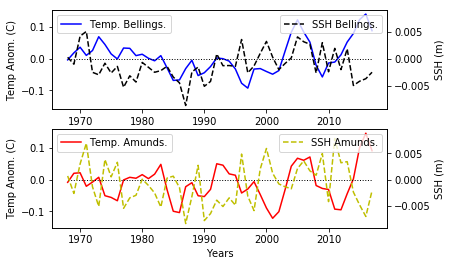

In [106]:
ax1=plt.subplot(211)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='b',label='Temp. Bellings.',linewidth=1.5)
#ax1.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Temp. Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Temp Anom. (C)')
ax1.set_xlabel('Years')
ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='--',color='k',label='SSH Bellings.',linewidth=1.5)
#ax2.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='--',color='y',label='SSH Amunds.',linewidth=1.5)
ax2.set_ylabel('SSH (m)')
ax2.set_xlabel('Years')
ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

ax1=plt.subplot(212)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
#ax1.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='b',label='Temp. Bellings.',linewidth=1.5)
ax1.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Temp. Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Temp Anom. (C)')
ax1.set_xlabel('Years')
ax1.legend(fontsize=10)

ax2=ax1.twinx()
#ax2.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='--',color='k',label='SSH Bellings.',linewidth=1.5)
ax2.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='--',color='y',label='SSH Amunds.',linewidth=1.5)
ax2.set_ylabel('SSH (m)')
ax2.set_xlabel('Years')
ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

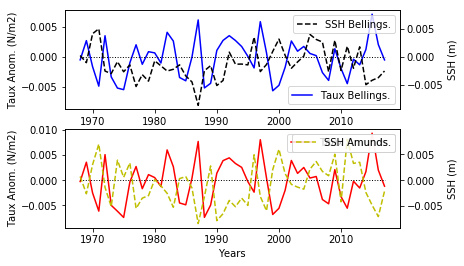

In [107]:
ax1=plt.subplot(211)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
ax1.plot(yrs,bs_tx_pert-bs_tx_cntrl,linestyle='-',color='b',label='Taux Bellings.',linewidth=1.5)
#ax1.plot(yrs,as_tpert-as_tcntrl,linestyle='-',color='r',label='Temp. Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Taux Anom. (N/m2)')
ax1.set_xlabel('Years')
ax1.legend(fontsize=10)

ax2=ax1.twinx()
ax2.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='--',color='k',label='SSH Bellings.',linewidth=1.5)
#ax2.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='--',color='y',label='SSH Amunds.',linewidth=1.5)
ax2.set_ylabel('SSH (m)')
ax2.set_xlabel('Years')
ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

ax1=plt.subplot(212)
#ax1.plot(yrs,wap_ssh_pert-wap_ssh_cntrl,linestyle='-',color='g',label='WAP',linewidth=1.5)
#ax1.plot(yrs,bs_tpert-bs_tcntrl,linestyle='-',color='b',label='Temp. Bellings.',linewidth=1.5)
ax1.plot(yrs,as_tx_pert-as_tx_cntrl,linestyle='-',color='r',label='Taux Amunds.',linewidth=1.5)
ax1.plot(yrs,np.zeros((50,1)),linestyle=':',color='k',linewidth=1)
#plt.ylim((1037.5,1035))
ax1.set_ylabel('Taux Anom. (N/m2)')
ax1.set_xlabel('Years')
ax1.legend(fontsize=10)

ax2=ax1.twinx()
#ax2.plot(yrs,bs_ssh_pert-bs_ssh_cntrl,linestyle='--',color='k',label='SSH Bellings.',linewidth=1.5)
ax2.plot(yrs,as_ssh_pert-as_ssh_cntrl,linestyle='--',color='y',label='SSH Amunds.',linewidth=1.5)
ax2.set_ylabel('SSH (m)')
ax2.set_xlabel('Years')
ax2.legend(fontsize=10)
align_yaxis_np(ax1,ax2)

In [17]:

print pert.tau_x[0].shape

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('Wind Stress')

clev = np.arange(-.2,.2,.01)

plt.subplot(1,2,1)
map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,cntrl.tau_x[0:12,:,:].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.7)
#cb.ax.set_xlabel('N/m2')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('Control Zonal Wind Stress')

#clev = np.arange(-.1,.1,.01)

plt.subplot(1,2,2)
map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,pert.tau_x[0:12,:,:].mean('Time').load()-cntrl.tau_x[0:12,:,:].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('N/m2')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('Anomaly')

ax3 = plt.axes([0.92,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('N/m2')

#of = os.path.join(NYFPertDir,'tau_x.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'tau_x.png')
plt.savefig(of,dpi=220)


NameError: name 'pert' is not defined

In [ ]:
clev = np.arange(-.2,.2,.01)
clev3 = np.arange(0,5000,1000)

plt.subplot(321)
plt.gca().patch.set_color('.25')
p1=plt.contourf(xt_ocean,yt_ocean,cntrl.tau_x[0:12,:,:].mean('Time').load(),cmap=plt.cm.PiYG,levels=clev,extend='both')
#cb=plt.colorbar(orientation='vertical',shrink = 0.7)
#cb.ax.set_xlabel('N/m^2')
clev3 = np.arange(0,5000,1000)
plt.contour(xt_ocean,yt_ocean,ht,levels=clev3,colors='k',linewidths=0.25)
plt.gca().yaxis.set_major_formatter(x_formatter)
plt.ylim((-75,-55))
plt.xlabel('Longitude ($^\circ$)')
plt.ylabel('Latitude ($^\circ$)')
plt.xlim([-75,40])
plt.title('Control Zonal Wind Stress')


yrs=np.arange(1973,2016,1)

ii=0
for yr in range(0,5):
    
    #print yr*12, yr*12+12
        
    plt.subplot(3,2,yr+2)
    plt.gca().patch.set_color('.25')
    p1=plt.contourf(xt_ocean,yt_ocean,pert.tau_x[yr*12:yr*12+12,:,:].mean('Time').load()-cntrl.tau_x[yr*12:yr*12+12,:,:].mean('Time').load(),cmap=plt.cm.PiYG,levels=clev,extend='both')
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('N/m^2')
    clev3 = np.arange(0,5000,1000)
    plt.contour(xt_ocean,yt_ocean,ht,levels=clev3,colors='k',linewidths=0.25)
    plt.gca().yaxis.set_major_formatter(x_formatter)
    plt.ylim((-75,-55))
    plt.xlabel('Longitude ($^\circ$)')
    plt.ylabel('Latitude ($^\circ$)')
    plt.xlim([-75,40])
    plt.title(yrs[yr].astype('S4'))
    
    #ii+=12
    
ax3 = plt.axes([0.92,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('N/m^2')

#of = os.path.join(NYFPertDir,'wpm2_cn.pdf')
#print of
#plt.savefig(of)
#of = os.path.join(NYFPertDir,'wpm2_cn.png')
#plt.savefig(of,dpi=220)


In [ ]:
#plot wind stress curl ... Ekman pumping anomalies.
#(d(Tau_y/f) /dx - d(Tau_x/f) / dy) /rho_0

#drhodx=np.gradient(rho[0,:,:,:],dxt,axis=2)
#print drhodx.shape

print cntrl.tau_x.shape
cntrl_Txf=cntrl.tau_x[0:12,:,:].mean('Time').load()/fcor
cntrl_Tyf=cntrl.tau_y[0:12,:,:].mean('Time').load()/fcor
print cntrl_Txf.shape

cntrl_dTyfdx=np.gradient(cntrl_Tyf,dxt,axis=1)
print cntrl_dTyfdx.shape
cntrl_dTxfdy=np.gradient(cntrl_Txf,dyt,axis=0)
print cntrl_dTxfdy.shape

rho0=1035.0
cntrl_we=(cntrl_dTyfdx-cntrl_dTxfdy)/rho0


print pert.tau_x.shape
pert_Txf=pert.tau_x[0:12,:,:].mean('Time').load()/fcor
pert_Tyf=pert.tau_y[0:12,:,:].mean('Time').load()/fcor
print pert_Tyf.shape

pert_dTyfdx=np.gradient(pert_Tyf,dxt,axis=1)
print pert_dTyfdx.shape
pert_dTxfdy=np.gradient(pert_Txf,dyt,axis=0)
print pert_dTxfdy.shape

rho0=1035.0
pert_we=(pert_dTyfdx-pert_dTxfdy)/rho0



In [ ]:
m=np.nanmax(cntrl_we[0:300,:])
print m
m=np.nanmin(cntrl_we[0:300,:])
print m

m=np.nanmax(pert_we[0:300,:])
print m
m=np.nanmin(pert_we[0:300,:])
print m

#convert from m/s to m/day
s_day=60*60*24
print s_day
cntrl_we=cntrl_we*s_day
pert_we=pert_we*s_day

m=np.nanmax(cntrl_we[0:300,:])
print m
m=np.nanmin(cntrl_we[0:300,:])
print m

m=np.nanmax(pert_we[0:300,:])
print m
m=np.nanmin(pert_we[0:300,:])
print m


In [15]:
print cntrl_we.shape

(1080, 1440)


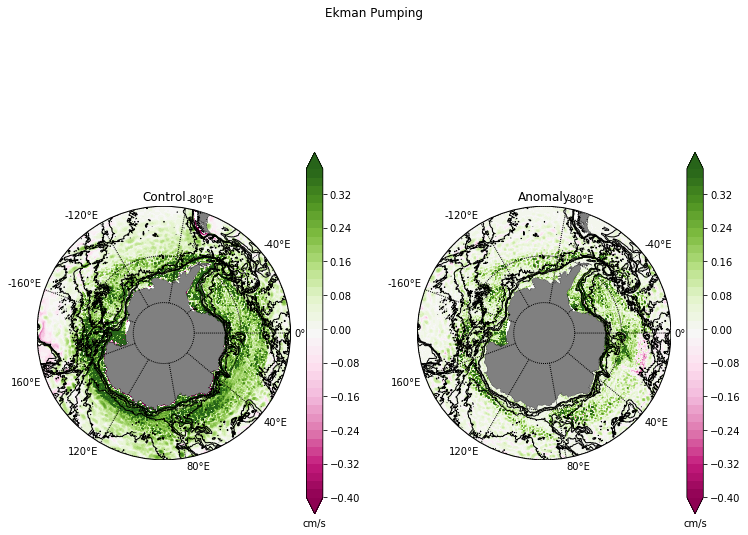

In [16]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Ekman Pumping')
clev = np.arange(-.4,.4,.02)

plt.subplot(1,2,1)
map = Basemap(projection='spstere',boundinglat=-50,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,cntrl_we, cmap=plt.cm.PiYG, levels=clev,extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('cm/s')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('Control')


plt.subplot(1,2,2)
map = Basemap(projection='spstere',boundinglat=-50,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,pert_we-cntrl_we, cmap=plt.cm.PiYG, levels=clev,extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('cm/s')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('Anomaly')


#of = os.path.join(NYFPertDir,'we.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'we.png')
plt.savefig(of,dpi=220)


In [17]:
#plot stamps of sea ice concentration.
Ocean_File = os.path.join(NYFCntrlDir,'output19*/ice__*.nc')
cntrl_i=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print cntrl_i.CN.shape
#nyf_cn=ff.CN.sum('ct').load()
#print nyf_cn.shape

Ocean_File = os.path.join(NYFPertDir,'output*/ice__*.nc')
pert_i=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print pert_i.CN.shape
#pert_cn=ff.CN.sum('ct').load()
#print pert_cn.shape

#print nyf_cn.shape
#print pert_cn.shape
#cn = np.concatenate((nyf_cn[0:12,:],pert_cn),axis=0)
#print cn.shape


(348, 5, 1080, 1440)
(528, 5, 1080, 1440)


['June', 'July', 'Aug.', 'Sept.', 'Oct.', 'Nov.']


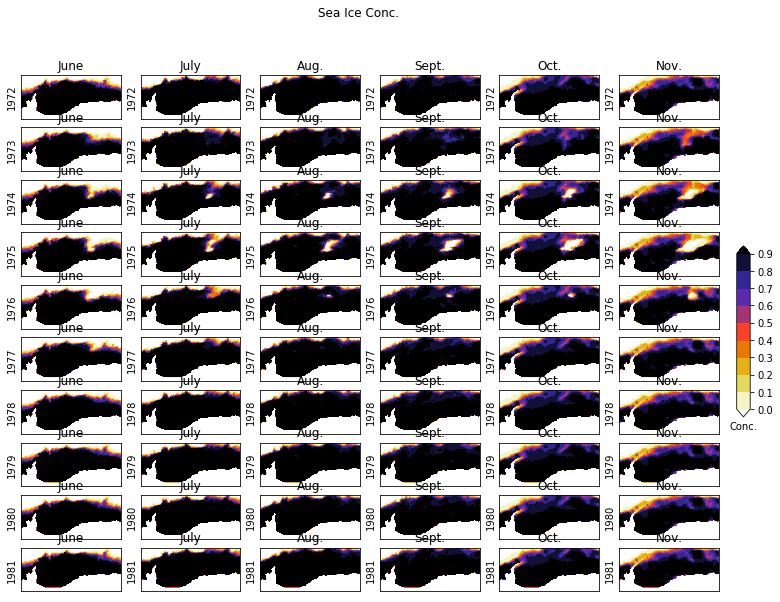

In [18]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Sea Ice Conc.')

tits=['June','July','Aug.','Sept.','Oct.', 'Nov.']
yrs=np.arange(1972,2016,1)
print tits


ii=0
for yr in range(0,10):
    #print yr
    for i in range(5,11): 
        
        #print yr*12+i
    
        clev = np.arange(0,1,.1)
        plt.subplot(10,6,ii+1)
        plt.gca().patch.set_color('.25')
        
        if yr==0:
            p1=plt.contourf(xt_ocean,yt_ocean,cntrl_i.CN[yr*12+i,:,:].sum('ct').load(),cmap=plt.cm.CMRmap_r,levels=clev,extend='both')
        else:
            p1=plt.contourf(xt_ocean,yt_ocean,pert_i.CN[(yr-1)*12+i,:,:].sum('ct').load(),cmap=plt.cm.CMRmap_r,levels=clev,extend='both')
            
        #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
        #cb.ax.set_xlabel('Conc.')
        #clev3 = np.arange(0,5000,1000)
        #plt.contour(xt_ocean,yt_ocean,ht,levels=clev3,colors='k',linewidths=0.25)
        plt.gca().yaxis.set_major_formatter(x_formatter)
        plt.ylim((-80,-55))
        #plt.xlabel('Longitude ($^\circ$)')
        plt.ylabel(yrs[yr])
        plt.xlim([-80,40])
        plt.title(tits[i-5])     
        plt.gca().axes.get_xaxis().set_ticks([])
        plt.gca().axes.get_yaxis().set_ticks([])
        
        ii+=1

ax3 = plt.axes([0.92,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('Conc.')

#of = os.path.join(NYFPertDir,'cn.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'cn.png')
plt.savefig(of,dpi=220)


In [28]:

Ocean_File = os.path.join(NYFCntrlDir,'output*/ocean__*.nc')
print Ocean_File
cntrl=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print cntrl.mld.shape

Ocean_File = os.path.join(NYFPertDir,'output*/ocean__*.nc')
print Ocean_File
pert=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print pert.mld.shape

/g/data1/v45/pas561/mom/archive/wombat_jul15b_r0/output*/ocean__*.nc
(50, 1080, 1440)
/g/data1/v45/pas561/mom/archive/wombat_jul15b_r0_wp2/output*/ocean__*.nc
(44, 1080, 1440)


In [29]:
print cntrl.mld.shape
print pert.mld.shape
numyrs=pert.mld.shape[0]
print numyrs

(50, 1080, 1440)
(44, 1080, 1440)
44


In [31]:
print cntrl.ty_trans_rho.shape
print pert.ty_trans_rho.shape

(50, 80, 1080, 1440)
(44, 80, 1080, 1440)


528
0 0 12
1 12 24
2 24 36
3 36 48
4 48 60
5 60 72
6 72 84
7 84 96
8 96 108
9 108 120
10 120 132
11 132 144
12 144 156
13 156 168
14 168 180


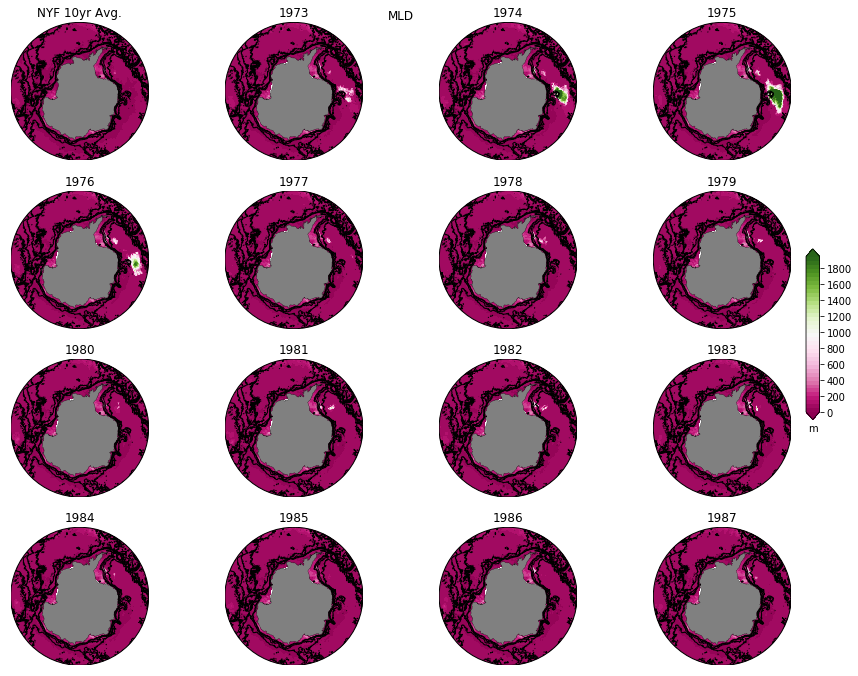

In [24]:
#plot MLD
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('MLD')
clev = np.arange(0,2000,50)
yrs=np.arange(1972,2018,1)

plt.subplot(4,4,1)
map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
#map.drawparallels(np.arange(-80.,81.,15.))
#map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,cntrl.mld[0:120].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.7)
#cb.ax.set_xlabel('N/m2')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('NYF 10yr Avg.')

print numyrs
ii=0
for yr in range(0,15):
    print yr, yr*12, yr*12+12

    plt.subplot(4,4,yr+2)
    map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
    map.drawcoastlines(linewidth=0.25)
    map.fillcontinents(color='gray',lake_color='gray')
    # draw parallels and meridians.
    #map.drawparallels(np.arange(-80.,81.,15.))
    #map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
    X, Y = map(geolon_t,geolat_t) 
    p1=map.contourf(X,Y,pert.mld[yr*12:yr*12+12,:,:].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
    #cb=plt.colorbar(orientation='vertical',shrink = 0.5)
    #cb.ax.set_xlabel('N/m2')
    clev3 = np.arange(0,5000,1000)
    map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
    plt.title(yrs[yr+1])

ax3 = plt.axes([0.95,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('m')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'mld.png')
plt.savefig(of,dpi=220)


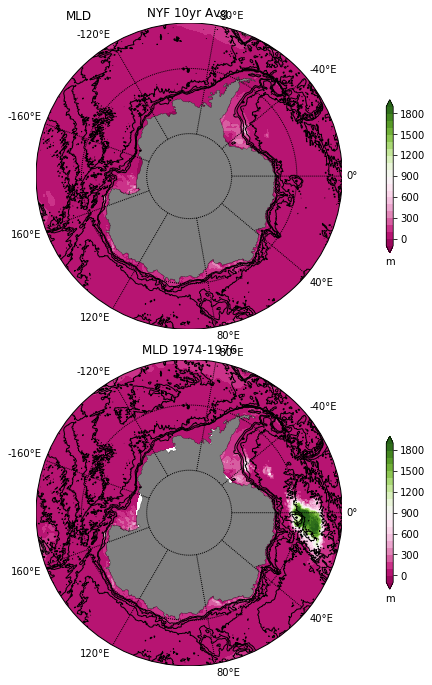

In [25]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('MLD')

clev = np.arange(-100,2000,100)
plt.subplot(2,1,1)
map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,cntrl.mld[0:120].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('m')
clev3 = np.arange(0,5000,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('NYF 10yr Avg.')

plt.subplot(2,1,2)
map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,pert.mld[12:36].mean('Time').load(), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('m')
clev3 = np.arange(1000,5001,1000)
map.contour(X,Y,ht,levels=clev3,colors='k',linewidths=1)
plt.title('MLD 1974-1976')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'mld_1975anom.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'mld_1974-76.png')
plt.savefig(of,dpi=220)

## Calc the GMOC from ty_trans_rho 

In [33]:
#print pert.ty_trans.shape

#pert_gmoc=pert.ty_trans_rho[:,:,:,:].sum('grid_xt_ocean').cumsum('potrho').load()

#print pert_gmoc.shape

#of=os.path.join(NYFPertDir,'gmoc_adv_rho.npy')
#a=np.save(of,pert_gmoc)

(44, 50, 1080, 1440)
(44, 80, 1080)


In [34]:
print cntrl.ty_trans_rho.shape
cntrl_gmoc=cntrl.ty_trans_rho[:,:,:,:].sum('grid_xt_ocean').cumsum('potrho').load()
print cntrl_gmoc.shape

of=os.path.join(NYFCntrlDir,'gmoc_adv_rho.npy')
a=np.save(of,cntrl_gmoc)


(50, 80, 1080, 1440)
(50, 80, 1080)


In [ ]:
#load gmoc in rho space
of=os.path.join(NYFPertDir,'gmoc_adv_rho.npy')
pert_gmoc=np.load(of)
print pert_gmoc.shape

#of=os.path.join(NYFCntrlDir,'cntrl_gmocs.npy')
of=os.path.join(NYFCntrlDir,'gmoc_adv_rho.npy')
cntrl_gmoc=np.load(of)
print cntrl_gmoc.shape

In [37]:
yrs=np.arange(1973,2016,1)
print yrs
print yrs.astype('S4')

[1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987
 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002
 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]
['1973' '1974' '1975' '1976' '1977' '1978' '1979' '1980' '1981' '1982'
 '1983' '1984' '1985' '1986' '1987' '1988' '1989' '1990' '1991' '1992'
 '1993' '1994' '1995' '1996' '1997' '1998' '1999' '2000' '2001' '2002'
 '2003' '2004' '2005' '2006' '2007' '2008' '2009' '2010' '2011' '2012'
 '2013' '2014' '2015']


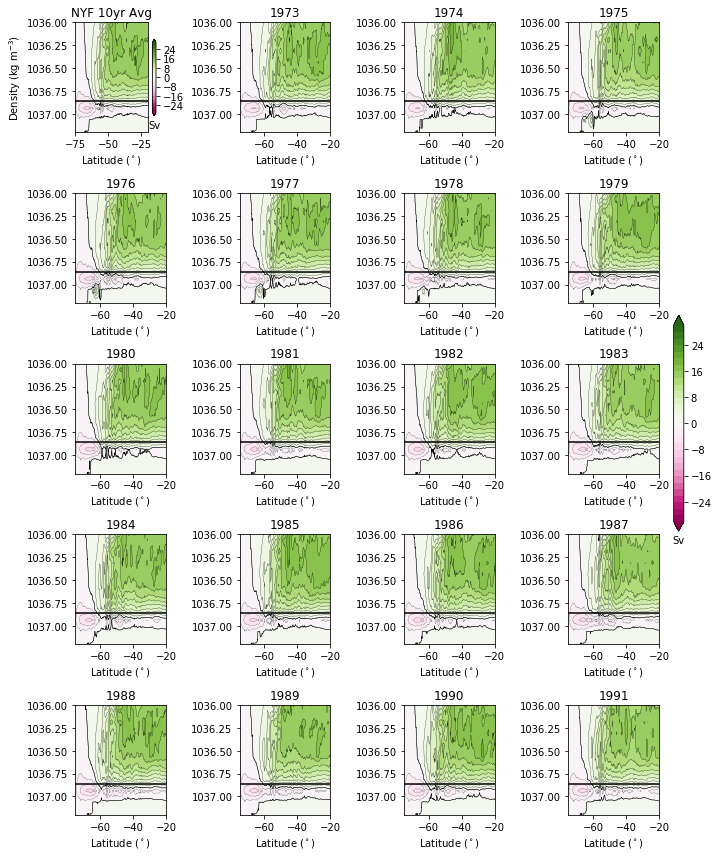

In [38]:
#plot gmoc adv in rho space
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('Advective GMOC')
clev = np.arange(-30,32,2)

t1=0
t2=9

plt.subplot(541)
plt.contourf(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
plt.ylim((1037.2,1036))
plt.ylabel('Density (kg m$^{-3}$)')
plt.xlabel('Latitude ($^\circ$)')
plt.xlim([-75,-20])
tit='NYF 10yr Avg'
plt.title(tit)
plt.plot([-75,-20], [1036.86,1036.86], 'k')


ii=0
for yr in range(0,19):
    
    #np.mean(pert_gmoc[t1:t2,:,:],axis=0)-np.mean(cntrl_gmoc[t1:t2,:,:],axis=0)
    plt.subplot(5,4,yr+2)
    p1=plt.contourf(yu_ocean,potrho,pert_gmoc[yr,:,:],cmap=plt.cm.PiYG,levels=clev,extend='both')
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('Sv')
    plt.contour(yu_ocean,potrho,pert_gmoc[yr,:,:],levels=clev,colors='k',linewidths=0.25)
    plt.contour(yu_ocean,potrho,pert_gmoc[yr,:,:],levels=[0.0,],colors='k',linewidths=0.5)
    plt.gca().invert_yaxis()
    plt.gca().yaxis.set_major_formatter(x_formatter)
    plt.ylim((1037.2,1036))
    #plt.ylabel('Density (kg m$^{-3}$)')
    plt.xlabel('Latitude ($^\circ$)')
    plt.xlim([-75,-20])
    tit=yrs[yr].astype('S4')
    plt.title(yrs[yr])
    plt.plot([-75,-20], [1036.86,1036.86], 'k')


ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('Sv')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'wpm2_cn.pdf')
#print of
#plt.savefig(of)
#of = os.path.join(NYFPertDir,'wpm2_cn.png')
#plt.savefig(of,dpi=220)
#of = os.path.join(NYFPertDir,'gmoc.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'gmoc_adv.png')
plt.savefig(of,dpi=220)

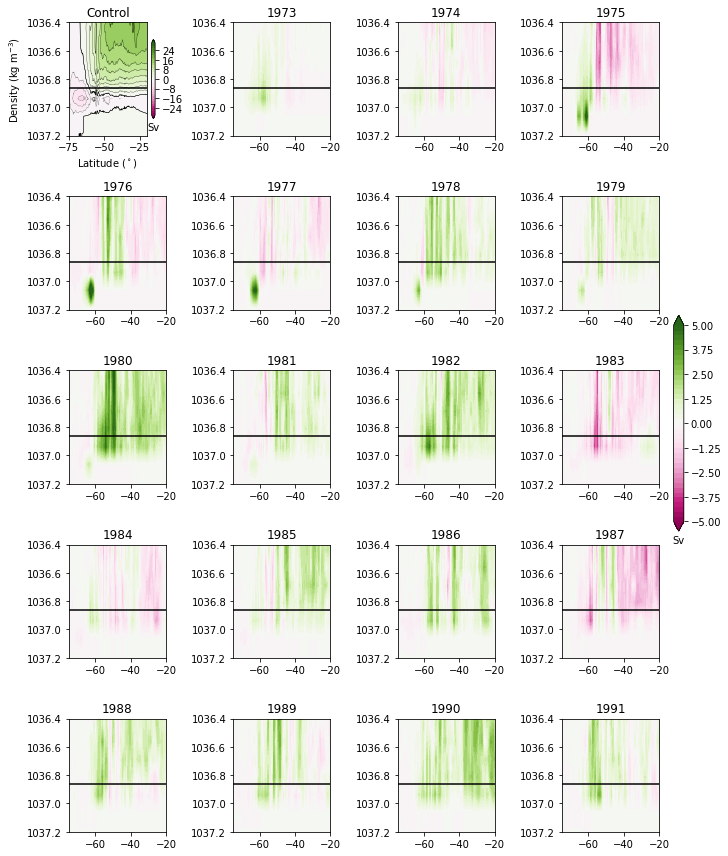

In [39]:
#plot gmoc anom in rho space
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('GMOC Adv Anomaly')

clev = np.arange(-30,32,2)

t1=0
t2=9

plt.subplot(541)
plt.contourf(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[t1:t2,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
plt.ylim((1037.2,1036.4))
plt.ylabel('Density (kg m$^{-3}$)')
plt.xlabel('Latitude ($^\circ$)')
plt.xlim([-75,-20])
tit='Control'
plt.title(tit)
plt.plot([-75,-20], [1036.86,1036.86], 'k')

yrs=np.arange(1973,2016,1)

ii=0

clev = np.arange(-5,5.25,0.25)


for yr in range(0,19):
    
    #np.mean(pert_gmoc[t1:t2,:,:],axis=0)-np.mean(cntrl_gmoc[t1:t2,:,:],axis=0)
    plt.subplot(5,4,yr+2)
    p1=plt.contourf(yu_ocean,potrho,pert_gmoc[yr,:,:]-cntrl_gmoc[yr+3,:,:],cmap=plt.cm.PiYG,levels=clev,extend='both')
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('Sv')
    #plt.contour(yu_ocean,potrho,pert_gmoc[yr,:,:]-cntrl_gmoc[yr,:,:],levels=clev,colors='k',linewidths=0.25)
    #plt.contour(yu_ocean,potrho,pert_gmoc[yr,:,:]-cntrl_gmoc[yr,:,:],levels=[0.0,],colors='k',linewidths=0.5)
    plt.gca().invert_yaxis()
    plt.gca().yaxis.set_major_formatter(x_formatter)
    plt.ylim((1037.2,1036.4))
    #plt.ylabel('Density (kg m$^{-3}$)')
    #plt.xlabel('Latitude ($^\circ$)')
    plt.xlim([-75,-20])
    tit='Anom. ' + yrs[yr].astype('S4')
    plt.title(yrs[yr].astype('S4'))
    plt.plot([-75,-20], [1036.86,1036.86], 'k')

    
ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('Sv')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'wpm2_cn.pdf')
#print of
#plt.savefig(of)
#of = os.path.join(NYFPertDir,'wpm2_cn.png')
#plt.savefig(of,dpi=220)
#of = os.path.join(NYFPertDir,'gmoc_anom.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'gmoc_adv_anom.png')
plt.savefig(of,dpi=220)

In [ ]:
#plot time series of AABW or full transports 
T=np.arange(50)
print T.shape


z1=np.argwhere(potrho<1036.86)
z1=z1[-1]

ts=pert_gmoc.shape
ts=ts[0]
yrs=np.arange(1973,2018,1)
print ts,yrs[ts]

# do lower cell average between lats 60-65S
j1=np.argwhere(yt_ocean<-69.9)
j2=np.argwhere(yt_ocean<-60)
j1=j1[-1]
j2=j2[-1]

lc_cntrl60_psj = cntrl_gmoc[0:ts,z1:,j1:j2]
lc_cntrl60_psj_bar = np.mean(lc_cntrl60_psj,2)
lc_cntrl60_psj_ts = np.min(lc_cntrl60_psj_bar,1)
print lc_cntrl60_psj_ts.shape

lc_pert60_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert60_psj_bar = np.mean(lc_pert60_psj,2)
lc_pert60_psj_ts = np.min(lc_pert60_psj_bar,1)
print lc_pert60_psj_ts.shape

lc_anom60_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]
lc_max_anom60_psj_ts = np.max(lc_anom60_psj,1)
lc_max_anom60_psj_ts = np.max(lc_max_anom60_psj_ts,1)
lc_max_anom60_psj_ts=np.insert(lc_max_anom60_psj_ts,0,0)
lc_max60_ts = lc_max_anom60_psj_ts + lc_cntrl60_psj_ts[0]

lc_min_anom60_psj_ts = np.min(lc_anom60_psj,1)
lc_min_anom60_psj_ts = np.min(lc_min_anom60_psj_ts,1)
lc_min_anom60_psj_ts=np.insert(lc_min_anom60_psj_ts,0,0)
lc_min60_ts = lc_min_anom60_psj_ts + lc_cntrl60_psj_ts[0]

#print lc_max_ts
#print lc_min_ts

# do lower cell average between lats 40-45S
j1=np.argwhere(yt_ocean<-49.9)
j2=np.argwhere(yt_ocean<-40)
j1=j1[-1]
j2=j2[-1]

lc_cntrl40_psj = cntrl_gmoc[0:ts,z1:,j1:j2]
lc_cntrl40_psj_bar = np.mean(lc_cntrl40_psj,2)
lc_cntrl40_psj_ts = np.min(lc_cntrl40_psj_bar,1)

lc_pert40_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert40_psj_bar = np.mean(lc_pert40_psj,2)
lc_pert40_psj_ts = np.min(lc_pert40_psj_bar,1)

lc_anom40_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]

lc_max_anom40_psj_ts = np.max(lc_anom40_psj,1)
lc_max_anom40_psj_ts = np.max(lc_max_anom40_psj_ts,1)
lc_max_anom40_psj_ts=np.insert(lc_max_anom40_psj_ts,0,0)
lc_max40_ts = lc_max_anom40_psj_ts + lc_cntrl40_psj_ts[0]

lc_min_anom40_psj_ts = np.min(lc_anom40_psj,1)
lc_min_anom40_psj_ts = np.min(lc_min_anom40_psj_ts,1)
lc_min_anom40_psj_ts=np.insert(lc_min_anom40_psj_ts,0,0)
lc_min40_ts = lc_min_anom40_psj_ts + lc_cntrl40_psj_ts[0]

# do lower cell average between lats 20-25S
j1=np.argwhere(yt_ocean<-59.9)
j2=np.argwhere(yt_ocean<-50)
j1=j1[-1]
j2=j2[-1]

lc_cntrl50_psj = cntrl_gmoc[0:ts,z1:,j1:j2]
lc_cntrl50_psj_bar = np.mean(lc_cntrl50_psj,2)
lc_cntrl50_psj_ts = np.min(lc_cntrl50_psj_bar,1)

lc_pert50_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert50_psj_bar = np.mean(lc_pert50_psj,2)
lc_pert50_psj_ts = np.min(lc_pert50_psj_bar,1)

lc_anom50_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]


lc_max_anom50_psj_ts = np.max(lc_anom50_psj,1)
lc_max_anom50_psj_ts = np.max(lc_max_anom50_psj_ts,1)
lc_max_anom50_psj_ts=np.insert(lc_max_anom50_psj_ts,0,0)
lc_max50_ts = lc_max_anom50_psj_ts + lc_cntrl50_psj_ts[0]

lc_min_anom50_psj_ts = np.min(lc_anom50_psj,1)
lc_min_anom50_psj_ts = np.min(lc_min_anom50_psj_ts,1)
lc_min_anom50_psj_ts=np.insert(lc_min_anom50_psj_ts,0,0)
lc_min50_ts = lc_min_anom50_psj_ts + lc_cntrl50_psj_ts[0]

plt.subplot(211)
plt.plot(yrs[0:ts],lc_cntrl60_psj_ts,linestyle='-',color='k',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert60_psj_ts,linestyle='-',color='g',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_cntrl50_psj_ts,linestyle='--',color='k',label='50-60$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert50_psj_ts,linestyle='--',color='g',label='50-60$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_cntrl40_psj_ts,linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert40_psj_ts,linestyle=':',color='g',label='40-50$^\circ$S',linewidth=2)
#plt.plot(lc_max40_ts,linestyle=':',color='g',linewidth=1.5)
#plt.plot(lc_min40_ts,linestyle=':',color='b',linewidth=1.5)
#plt.plot(lc_cntrl40_psj_ts,linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit='GMOC Lower Cell Rho > ' +str(potrho[z1])
plt.title(tit)
plt.legend(fontsize=10)

print lc_max60_ts.shape,lc_min60_ts.shape
ts=lc_max60_ts.shape[0]
plt.subplot(212)
plt.plot(yrs[0:ts],lc_max60_ts,linestyle='-',color='g',label='max 60-70$^\circ$S',linewidth=1.5)
plt.plot(yrs[0:ts],lc_min60_ts,linestyle='-',color='b',label='min 60-70$^\circ$S',linewidth=1.5)
plt.plot(yrs[0:ts+2],lc_cntrl60_psj_ts,linestyle='-',color='k',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_max50_ts,linestyle='--',label='max 50-60$^\circ$S',color='g',linewidth=1.5)
plt.plot(yrs[0:ts],lc_min50_ts,linestyle='--',label='min 50-60$^\circ$S',color='b',linewidth=1.5)
plt.plot(yrs[0:ts+2],lc_cntrl50_psj_ts,linestyle='--',color='k',label='50-60$^\circ$S',linewidth=2)
#plt.plot(lc_max40_ts,linestyle=':',color='g',linewidth=1.5)
#plt.plot(lc_min40_ts,linestyle=':',color='b',linewidth=1.5)
#plt.plot(lc_cntrl40_psj_ts,linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit='GMOC Lower Cell Rho Min/Max Anom > ' +str(potrho[z1])
plt.title(tit)
plt.legend(fontsize=10)


plt.tight_layout()

#of = os.path.join(NYFPertDir,'gmoc_ts.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'gmoc_ts.png')
plt.savefig(of,dpi=220)

(50,)
44 2017
(44,)
(44,)
(42,) (42,)


In [ ]:
#plot time series of AABW for adv transports (no GM)
T=np.arange(50)
print T.shape


z1=np.argwhere(potrho<1036.86)
z1=z1[-1]

ts=pert_gmoc.shape
ts=ts[0]
print ts

# do lower cell average between lats 60-65S
j1=np.argwhere(yt_ocean<-69.9)
j2=np.argwhere(yt_ocean<-60)
j1=j1[-1]
j2=j2[-1]

lc_cntrl60_psj = cntrl_gmoc[3:ts+3,z1:,j1:j2]
lc_cntrl60_psj_bar = np.mean(lc_cntrl60_psj,2)
lc_cntrl60_psj_ts = np.min(lc_cntrl60_psj_bar,1)

lc_pert60_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert60_psj_bar = np.mean(lc_pert60_psj,2)
lc_pert60_psj_ts = np.min(lc_pert60_psj_bar,1)

lc_anom60_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]
lc_max_anom60_psj_ts = np.max(lc_anom60_psj,1)
lc_max_anom60_psj_ts = np.max(lc_max_anom60_psj_ts,1)
lc_max_anom60_psj_ts=np.insert(lc_max_anom60_psj_ts,0,0)
lc_max60_ts = lc_max_anom60_psj_ts + lc_cntrl60_psj_ts[0]

lc_min_anom60_psj_ts = np.min(lc_anom60_psj,1)
lc_min_anom60_psj_ts = np.min(lc_min_anom60_psj_ts,1)
lc_min_anom60_psj_ts=np.insert(lc_min_anom60_psj_ts,0,0)
lc_min60_ts = lc_min_anom60_psj_ts + lc_cntrl60_psj_ts[0]

#print lc_max_ts
#print lc_min_ts

# do lower cell average between lats 40-45S
j1=np.argwhere(yt_ocean<-49.9)
j2=np.argwhere(yt_ocean<-40)
j1=j1[-1]
j2=j2[-1]

lc_cntrl40_psj = cntrl_gmoc[3:ts+3,z1:,j1:j2]
lc_cntrl40_psj_bar = np.mean(lc_cntrl40_psj,2)
lc_cntrl40_psj_ts = np.min(lc_cntrl40_psj_bar,1)

lc_pert40_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert40_psj_bar = np.mean(lc_pert40_psj,2)
lc_pert40_psj_ts = np.min(lc_pert40_psj_bar,1)

lc_anom40_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]

lc_max_anom40_psj_ts = np.max(lc_anom40_psj,1)
lc_max_anom40_psj_ts = np.max(lc_max_anom40_psj_ts,1)
lc_max_anom40_psj_ts=np.insert(lc_max_anom40_psj_ts,0,0)
lc_max40_ts = lc_max_anom40_psj_ts + lc_cntrl40_psj_ts[0]

lc_min_anom40_psj_ts = np.min(lc_anom40_psj,1)
lc_min_anom40_psj_ts = np.min(lc_min_anom40_psj_ts,1)
lc_min_anom40_psj_ts=np.insert(lc_min_anom40_psj_ts,0,0)
lc_min40_ts = lc_min_anom40_psj_ts + lc_cntrl40_psj_ts[0]

# do lower cell average between lats 20-25S
j1=np.argwhere(yt_ocean<-59.9)
j2=np.argwhere(yt_ocean<-50)
j1=j1[-1]
j2=j2[-1]

lc_cntrl50_psj = cntrl_gmoc[3:ts+3,z1:,j1:j2]
lc_cntrl50_psj_bar = np.mean(lc_cntrl50_psj,2)
lc_cntrl50_psj_ts = np.min(lc_cntrl50_psj_bar,1)

lc_pert50_psj = pert_gmoc[:,z1:,j1:j2]
lc_pert50_psj_bar = np.mean(lc_pert50_psj,2)
lc_pert50_psj_ts = np.min(lc_pert50_psj_bar,1)

lc_anom50_psj = pert_gmoc[0:ts,z1:,j1:j2]-cntrl_gmoc[0:ts,z1:,j1:j2]

lc_max_anom50_psj_ts = np.max(lc_anom50_psj,1)
lc_max_anom50_psj_ts = np.max(lc_max_anom50_psj_ts,1)
lc_max_anom50_psj_ts=np.insert(lc_max_anom50_psj_ts,0,0)
lc_max50_ts = lc_max_anom50_psj_ts + lc_cntrl50_psj_ts[0]

lc_min_anom50_psj_ts = np.min(lc_anom50_psj,1)
lc_min_anom50_psj_ts = np.min(lc_min_anom50_psj_ts,1)
lc_min_anom50_psj_ts=np.insert(lc_min_anom50_psj_ts,0,0)
lc_min50_ts = lc_min_anom50_psj_ts + lc_cntrl50_psj_ts[0]

plt.subplot(211)
plt.plot(yrs[0:ts],lc_cntrl60_psj_ts[0:ts],linestyle='-',color='k',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert60_psj_ts[0:ts],linestyle='-',color='g',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_cntrl50_psj_ts[0:ts],linestyle='--',color='k',label='50-60$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert50_psj_ts[0:ts],linestyle='--',color='g',label='50-60$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_cntrl40_psj_ts[0:ts],linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_pert40_psj_ts[0:ts],linestyle=':',color='g',label='40-50$^\circ$S',linewidth=2)
#plt.plot(lc_max40_ts,linestyle=':',color='g',linewidth=1.5)
#plt.plot(lc_min40_ts,linestyle=':',color='b',linewidth=1.5)
#plt.plot(lc_cntrl40_psj_ts,linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit='GMOC Lower Cell Rho > ' +str(potrho[z1])
plt.title(tit)
plt.legend(fontsize=10)

plt.subplot(212)
plt.plot(yrs[0:ts],lc_max60_ts[0:ts],linestyle='-',color='g',label='max 60-70$^\circ$S',linewidth=1.5)
plt.plot(yrs[0:ts],lc_min60_ts[0:ts],linestyle='-',color='b',label='min 60-70$^\circ$S',linewidth=1.5)
plt.plot(yrs[0:ts],lc_cntrl60_psj_ts[0:ts],linestyle='-',color='k',label='60-70$^\circ$S',linewidth=2)
plt.plot(yrs[0:ts],lc_max50_ts[0:ts],linestyle='--',label='max 50-60$^\circ$S',color='g',linewidth=1.5)
plt.plot(yrs[0:ts],lc_min50_ts[0:ts],linestyle='--',label='min 50-60$^\circ$S',color='b',linewidth=1.5)
plt.plot(yrs[0:ts],lc_cntrl50_psj_ts[0:ts],linestyle='--',color='k',label='50-60$^\circ$S',linewidth=2)
#plt.plot(lc_max40_ts,linestyle=':',color='g',linewidth=1.5)
#plt.plot(lc_min40_ts,linestyle=':',color='b',linewidth=1.5)
#plt.plot(lc_cntrl40_psj_ts,linestyle=':',color='k',label='40-50$^\circ$S',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit='GMOC Lower Cell Rho Min/Max Anom > ' +str(potrho[z1])
plt.title(tit)
plt.legend(fontsize=10)


plt.tight_layout()

#of = os.path.join(NYFPertDir,'gmoc_ts.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'gmoc_ts_adv.png')
plt.savefig(of,dpi=220)

In [7]:
#calc tx transport, acc transport
cntrl_psi=cntrl.tx_trans[:,:,:,:].sum('st_ocean').cumsum('yt_ocean').load()
print cntrl_psi.shape

of=os.path.join(NYFCntrlDir,'psi.npy')
a=np.save(of,cntrl_psi)


(50, 1080, 1440)


In [8]:
#calc tx transport, acc transport
pert_psi=pert.tx_trans[:,:,:,:].sum('st_ocean').cumsum('yt_ocean').load()
print pert_psi.shape

of=os.path.join(NYFPertDir,'psi.npy')
a=np.save(of,pert_psi)



(44, 1080, 1440)


In [9]:
#load acc psi
of=os.path.join(NYFPertDir,'psi.npy')
pert_psi=np.load(of)
print pert_psi.shape

#of=os.path.join(NYFCntrlDir,'cntrl_gmocs.npy')
of=os.path.join(NYFCntrlDir,'psi.npy')
cntrl_psi=np.load(of)
print cntrl_psi.shape

(44, 1080, 1440)
(50, 1080, 1440)


[-160 -155 -150 -145 -140 -135 -130 -125 -120 -115 -110 -105 -100  -95  -90
  -85  -80  -75  -70  -65  -60  -55  -50  -45  -40  -35  -30  -25  -20  -15
  -10   -5    0    5   10   15   20   25   30   35   40   45   50   55   60
   65   70   75   80   85   90   95  100  105  110  115  120  125  130  135
  140  145  150  155]


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:1711: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:


[1000 2000 3000 4000 5000]


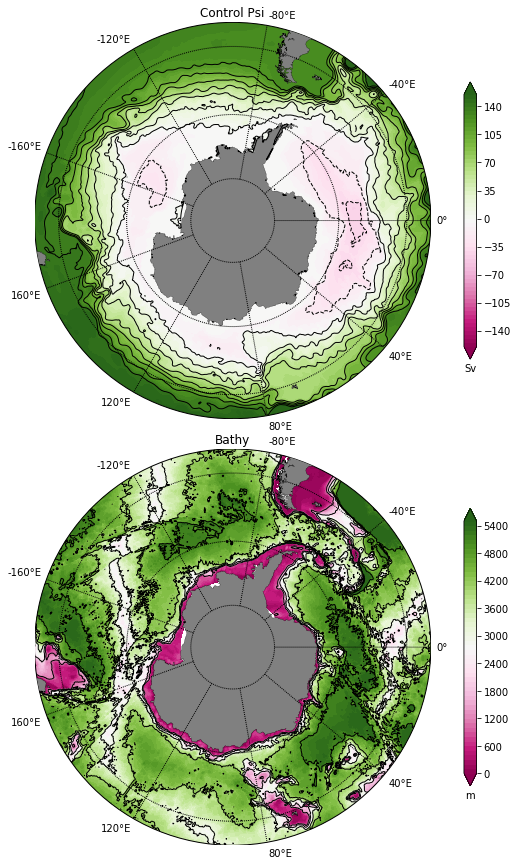

In [10]:
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plot ACC transport

clev = np.arange(-160,160,5)
print clev

clev2 = np.arange(-160,160,20)
#print clev2

plt.subplot(2,1,1)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,np.mean(cntrl_psi[0:9],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
#clev3 = np.arange(0,200,20)
#print clev3
map.contour(X,Y,np.mean(cntrl_psi[0:9],axis=0),levels=clev2,colors='k',linewidths=1)

#clev3 = np.arange(1000,5001,1000)
#print clev3
#map.contour(X,Y,ht[:,:],levels=clev3,colors='c',linewidths=1)    

plt.title('Control Psi')

plt.subplot(2,1,2)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
clev3 = np.arange(0,5600,100)
p1=map.contourf(X,Y,ht[:,:], cmap=plt.cm.PiYG, levels=clev3, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('m')
#clev3 = np.arange(0,200,20)
#print clev3

clev3 = np.arange(1000,5001,1000)
print clev3
map.contour(X,Y,ht[:,:],levels=clev3,colors='k',linewidths=1)    
plt.title('Bathy')

plt.tight_layout()


[-160 -155 -150 -145 -140 -135 -130 -125 -120 -115 -110 -105 -100  -95  -90
  -85  -80  -75  -70  -65  -60  -55  -50  -45  -40  -35  -30  -25  -20  -15
  -10   -5    0    5   10   15   20   25   30   35   40   45   50   55   60
   65   70   75   80   85   90   95  100  105  110  115  120  125  130  135
  140  145  150  155]


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


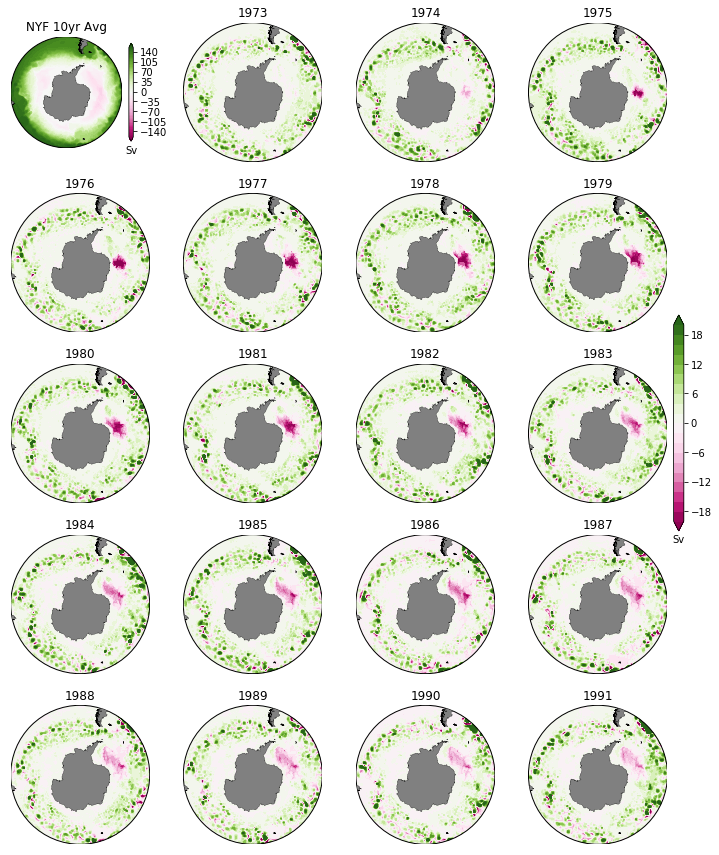

In [11]:
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('Psi Anom')
#plot ACC transport
yrs=np.arange(1973,2016,1)

ii=0
clev = np.arange(-160,160,5)
print clev

plt.subplot(5,4,1)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
#map.drawparallels(np.arange(-80.,81.,15.))
#map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,np.mean(cntrl_psi[0:10,:,:],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
#clev3 = np.arange(0,200,20)
#print clev3
#map.contour(X,Y,np.mean(cntrl_psi[0:5],axis=0),levels=clev,colors='k',linewidths=1)    
#tit=yrs[yr].astype('S4')
plt.title('NYF 10yr Avg')
    
clev = np.linspace(-20,20,21)

for yr in range(0,19):
    
    #np.mean(pert_gmoc[t1:t2,:,:],axis=0)-np.mean(cntrl_gmoc[t1:t2,:,:],axis=0)
    plt.subplot(5,4,yr+2)
    map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
    map.drawcoastlines(linewidth=0.25)
    map.fillcontinents(color='gray',lake_color='gray')
    # draw parallels and meridians.
    #map.drawparallels(np.arange(-80.,81.,15.))
    #map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
    X, Y = map(geolon_t,geolat_t) 
    p1=map.contourf(X,Y,pert_psi[yr,:,:]-cntrl_psi[yr,:,:], cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('Sv')
    #clev3 = np.arange(0,200,20)
    #print clev3
    #map.contour(X,Y,np.mean(cntrl_psi[0:5],axis=0),levels=clev,colors='k',linewidths=1)
    
    tit=yrs[yr].astype('S4')
    plt.title(tit)
    
    
ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('Sv')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'wpm2_cn.pdf')
#print of
#plt.savefig(of)
#of = os.path.join(NYFPertDir,'wpm2_cn.png')
#plt.savefig(of,dpi=220)
#of = os.path.join(NYFPertDir,'gmoc_anom.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'psi_anom.png')
plt.savefig(of,dpi=220)

[1000 2000 3000 4000 5000]


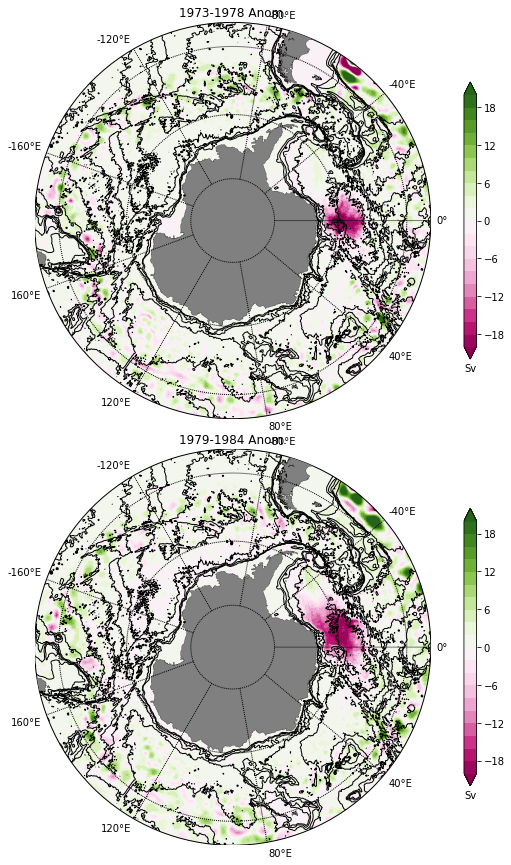

In [12]:
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

clev = np.linspace(-20,20,21)

plt.subplot(2,1,1)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,np.mean(pert_psi[1:5],axis=0)-np.mean(cntrl_psi[1+3:5+3],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#p1=map.contourf(X,Y,np.mean(pert_psi[0:5],axis=0)-np.mean(cntrl_psi[0:5],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
#clev3 = np.arange(0,200,20)
#print clev3
#map.contour(X,Y,np.mean(pert_psi[0:5],axis=0)-np.mean(cntrl_psi[0:5],axis=0),levels=clev,colors='k',linewidths=1)
clev3 = np.arange(1000,5001,1000)
map.contour(X,Y,ht[:,:],levels=clev3,colors='k',linewidths=1)    
plt.title('1973-1978 Anom.')

#ax3 = plt.axes([0.92,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#cb.ax.set_ylabel('Sv')

plt.subplot(2,1,2)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,np.mean(pert_psi[5:10],axis=0)-np.mean(cntrl_psi[5+3:10+3],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
#clev3 = np.arange(0,200,20)
#print clev3
#map.contour(X,Y,np.mean(pert_psi[4:7],axis=0)-np.mean(cntrl_psi[4:7],axis=0),levels=clev,colors='k',linewidths=1)
clev3 = np.arange(1000,5001,1000)
print clev3
map.contour(X,Y,ht[:,:],levels=clev3,colors='k',linewidths=1)    
plt.title('1979-1984 Anom.')

#ax3 = plt.axes([0.92,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#cb.ax.set_ylabel('Sv')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'psi.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'psi_anom.png')
plt.savefig(of,dpi=220)

[1000 2000 3000 4000 5000]


Text(0.5,1,u'PSI Pert Yr 1-10 Anom.')

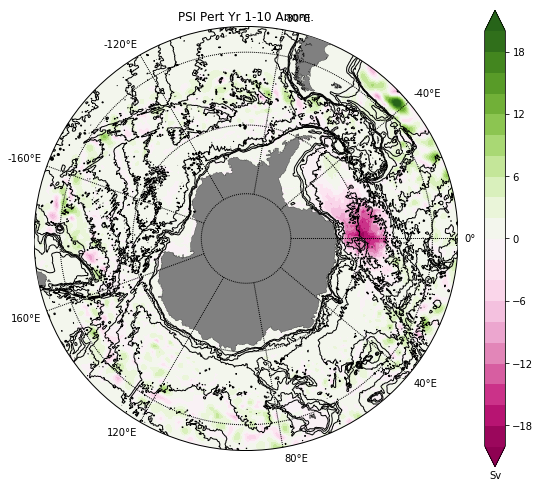

In [13]:
plt.subplot(1,1,1)
map = Basemap(projection='spstere',boundinglat=-45,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t,geolat_t) 
p1=map.contourf(X,Y,np.mean(pert_psi[0:10],axis=0)-np.mean(cntrl_psi[0+3:10+3],axis=0), cmap=plt.cm.PiYG, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
#clev3 = np.arange(0,200,20)
#print clev3
#map.contour(X,Y,np.mean(pert_psi[4:7],axis=0)-np.mean(cntrl_psi[4:7],axis=0),levels=clev,colors='k',linewidths=1)
clev3 = np.arange(1000,5001,1000)
print clev3
map.contour(X,Y,ht[:,:],levels=clev3,colors='k',linewidths=1)    
plt.title('PSI Pert Yr 1-10 Anom.')


In [14]:
# do psi max between lon 67-69S
i1=np.argwhere(xt_ocean<-69)
i2=np.argwhere(xt_ocean<-67)
i1=i1[-1]
i2=i2[-1]

j1=np.argwhere(yt_ocean<-54)
j1=j1[-1]

print j1, i1, i2

[239] [843] [851]


(50,)
44
44
[239] [843] [851]
[179] [879] [1179]


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:31: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:57: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:61: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


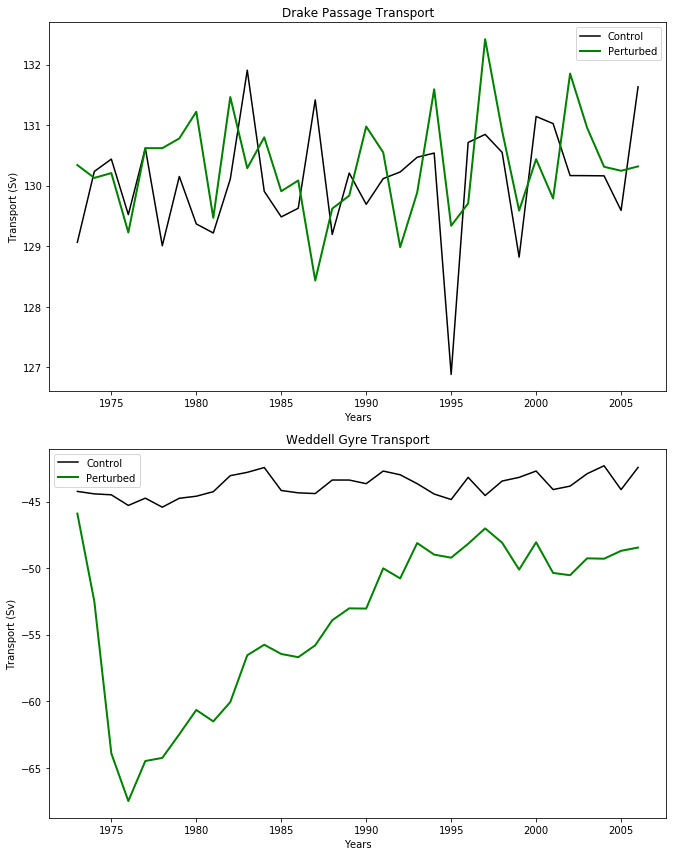

In [15]:
#plot Drake Passage time series

yrs=np.arange(1973,2016,1)
T=np.arange(50)
print T.shape


ts =pert.tx_trans.shape[0]
print ts
print pert_psi.shape[0]
ts=34
#print yrs[yr].astype('S4')
#tit=yrs[yr].astype('S4')
#plt.title(yrs[yr])plt.title(yrs[yr])

# do ACC psi max between lon 67-69S
i1=np.argwhere(xt_ocean<-69)
i2=np.argwhere(xt_ocean<-67)
i1=i1[-1]
i2=i2[-1]

j1=np.argwhere(yt_ocean<-54)
j1=j1[-1]

print j1, i1, i2

cntrl_dp = cntrl_psi[:,0:j1,i1:i2]
cntrl_dp_bar = np.mean(cntrl_dp,2)
cntrl_dp_ts = np.max(cntrl_dp_bar,1)

pert_dp = pert_psi[:,0:j1,i1:i2]
pert_dp_bar = np.mean(pert_dp,2)
pert_dp_ts = np.max(pert_dp_bar,1)

plt.subplot(211)
plt.plot(yrs[0:ts],cntrl_dp_ts[3:ts+3],linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs[0:ts],pert_dp_ts[0:ts],linestyle='-',color='g',label='Perturbed',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit=('Drake Passage Transport')
plt.title(tit)
plt.legend(fontsize=10)

# do Weddell Gyre psi min between lon 67-69S
i1=np.argwhere(xt_ocean<-60)
i2=np.argwhere(xt_ocean<15)
i1=i1[-1]
i2=i2[-1]

j1=np.argwhere(yt_ocean<-62)
j1=j1[-1]

print j1, i1, i2

cntrl_wg = cntrl_psi[:,0:j1,i1:i2]
#cntrl_wg_bar = np.mean(cntrl_wg,2)
cntrl_wg_ts = np.min(np.min(cntrl_wg,2),1)

pert_wg = pert_psi[:,0:j1,i1:i2]
#pert_wg_bar = np.mean(pert_wg,2)
pert_wg_ts = np.min(np.min(pert_wg,2),1)

plt.subplot(212)
plt.plot(yrs[0:ts],cntrl_wg_ts[3:ts+3],linestyle='-',color='k',label='Control',linewidth=1.5)
plt.plot(yrs[0:ts],pert_wg_ts[0:ts],linestyle='-',color='g',label='Perturbed',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit=('Weddell Gyre Transport')
plt.title(tit)
plt.legend(fontsize=10)

plt.tight_layout()

#of = os.path.join(NYFPertDir,'dp_ts.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'dp_ts.png')
plt.savefig(of,dpi=220)

In [6]:
#plot temp
print cntrl.temp.shape
print pert.temp.shape

(50, 50, 1080, 1440)
(44, 50, 1080, 1440)


[-2.  -1.9 -1.8 -1.7 -1.6 -1.5 -1.4 -1.3 -1.2 -1.1 -1.  -0.9 -0.8 -0.7 -0.6
 -0.5 -0.4 -0.3 -0.2 -0.1  0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9
  1.   1.1  1.2  1.3  1.4  1.5  1.6  1.7  1.8  1.9  2. ]
55.8532485962


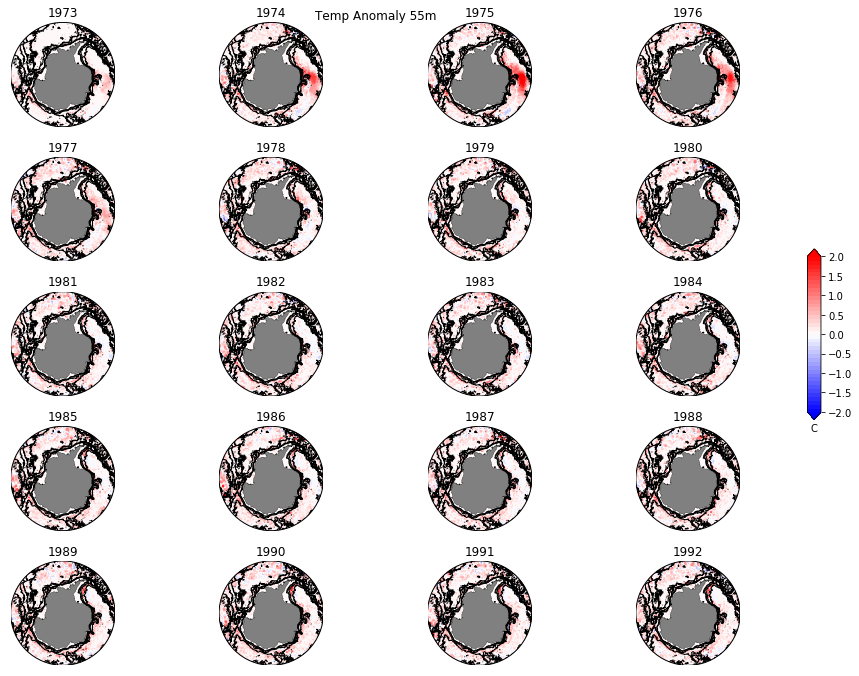

In [18]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Temp Anomaly 55m')
yrs=np.arange(1973,2016,1)

clev = np.linspace(-2,2,41)
print clev
st=5
print st_ocean[st]
ii=0
for yr in range(0,20):
    #print yr

    plt.subplot(5,4,yr+1)
    map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
    map.drawcoastlines(linewidth=0.25)
    map.fillcontinents(color='gray',lake_color='gray')
    # draw parallels and meridians.
    #map.drawparallels(np.arange(-80.,81.,15.))
    #map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
    X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
    
    p1=map.contourf(X,Y,pert.temp[yr,st,0:500,:].load()-cntrl.temp[yr+3,st,0:500,:].load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
    
    #cb=plt.colorbar(orientation='vertical',shrink = 0.5)
    #cb.ax.set_xlabel('N/m2')
    clev3 = np.arange(0,5000,1000)
    map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
    plt.title(yrs[yr].astype('S4'))

ax3 = plt.axes([0.98,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'temp_55m.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_55m.png')
plt.savefig(of,dpi=220)



[-0.5   -0.475 -0.45  -0.425 -0.4   -0.375 -0.35  -0.325 -0.3   -0.275
 -0.25  -0.225 -0.2   -0.175 -0.15  -0.125 -0.1   -0.075 -0.05  -0.025  0.
  0.025  0.05   0.075  0.1    0.125  0.15   0.175  0.2    0.225  0.25
  0.275  0.3    0.325  0.35   0.375  0.4    0.425  0.45   0.475  0.5  ]
1497.56188965


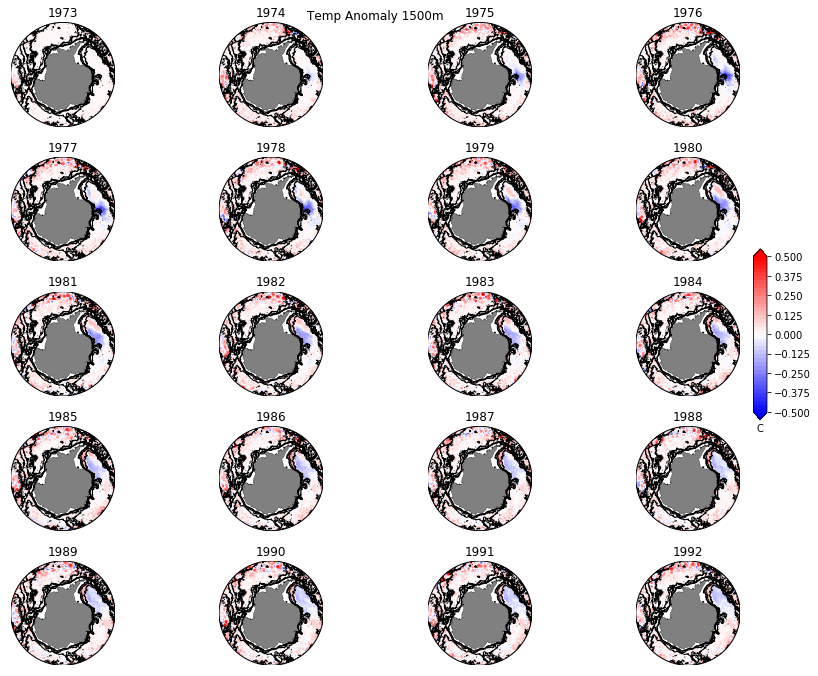

In [19]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Temp Anomaly 1500m')
yrs=np.arange(1973,2016,1)

clev = np.linspace(-.5,.5,41)
print clev
st=30
print st_ocean[st]
ii=0
for yr in range(0,20):
    #print yr

    plt.subplot(5,4,yr+1)
    map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
    map.drawcoastlines(linewidth=0.25)
    map.fillcontinents(color='gray',lake_color='gray')
    # draw parallels and meridians.
    #map.drawparallels(np.arange(-80.,81.,15.))
    #map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
    X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
    
    p1=map.contourf(X,Y,pert.temp[yr,st,0:500,:].load()-cntrl.temp[yr+3,st,0:500,:].load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
    
    #cb=plt.colorbar(orientation='vertical',shrink = 0.5)
    #cb.ax.set_xlabel('N/m2')
    clev3 = np.arange(0,5000,1000)
    map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
    plt.title(yrs[yr].astype('S4'))

plt.tight_layout()

ax3 = plt.axes([0.92,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

#of = os.path.join(NYFPertDir,'temp_1500m.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_1500m.png')
plt.savefig(of,dpi=220)



[ -3.00000000e-01  -2.90000000e-01  -2.80000000e-01  -2.70000000e-01
  -2.60000000e-01  -2.50000000e-01  -2.40000000e-01  -2.30000000e-01
  -2.20000000e-01  -2.10000000e-01  -2.00000000e-01  -1.90000000e-01
  -1.80000000e-01  -1.70000000e-01  -1.60000000e-01  -1.50000000e-01
  -1.40000000e-01  -1.30000000e-01  -1.20000000e-01  -1.10000000e-01
  -1.00000000e-01  -9.00000000e-02  -8.00000000e-02  -7.00000000e-02
  -6.00000000e-02  -5.00000000e-02  -4.00000000e-02  -3.00000000e-02
  -2.00000000e-02  -1.00000000e-02   2.77555756e-16   1.00000000e-02
   2.00000000e-02   3.00000000e-02   4.00000000e-02   5.00000000e-02
   6.00000000e-02   7.00000000e-02   8.00000000e-02   9.00000000e-02
   1.00000000e-01   1.10000000e-01   1.20000000e-01   1.30000000e-01
   1.40000000e-01   1.50000000e-01   1.60000000e-01   1.70000000e-01
   1.80000000e-01   1.90000000e-01   2.00000000e-01   2.10000000e-01
   2.20000000e-01   2.30000000e-01   2.40000000e-01   2.50000000e-01
   2.60000000e-01   2.70000000e-01

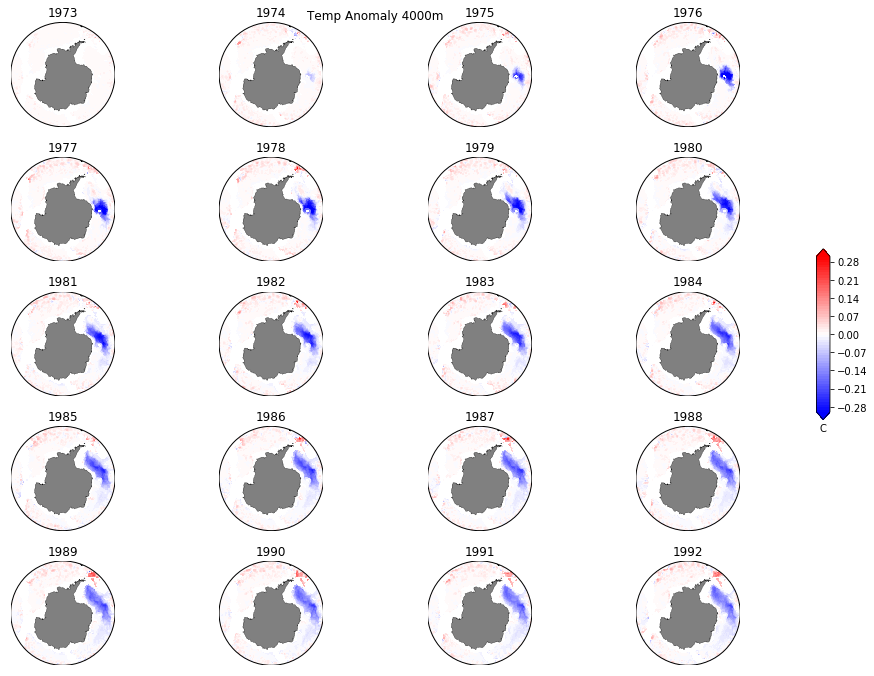

In [20]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Temp Anomaly 4000m')
yrs=np.arange(1973,2016,1)

clev = np.arange(-.3,.31,.01)
print clev
st=42
print st_ocean[st]
ii=0
for yr in range(0,20):
    #print yr

    plt.subplot(5,4,yr+1)
    map = Basemap(projection='spstere',boundinglat=-55,lon_0=90,resolution='l',round=True)
    map.drawcoastlines(linewidth=0.25)
    map.fillcontinents(color='gray',lake_color='gray')
    # draw parallels and meridians.
    #map.drawparallels(np.arange(-80.,81.,15.))
    #map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
    X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
    p1=map.contourf(X,Y,pert.temp[yr,st,0:500,:].load()-cntrl.temp[yr+3,st,0:500,:].load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
    #cb=plt.colorbar(orientation='vertical',shrink = 0.5)
    #cb.ax.set_xlabel('N/m2')
    #clev3 = np.arange(0,5000,1000)
    #map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
    plt.title(yrs[yr].astype('S4'))

ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'temp_4000m.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'temp_4000m.png')
plt.savefig(of,dpi=220)


In [21]:
print st_ocean[45]

4555.56591797


[ -2.00000000e-01  -1.90000000e-01  -1.80000000e-01  -1.70000000e-01
  -1.60000000e-01  -1.50000000e-01  -1.40000000e-01  -1.30000000e-01
  -1.20000000e-01  -1.10000000e-01  -1.00000000e-01  -9.00000000e-02
  -8.00000000e-02  -7.00000000e-02  -6.00000000e-02  -5.00000000e-02
  -4.00000000e-02  -3.00000000e-02  -2.00000000e-02  -1.00000000e-02
   1.66533454e-16   1.00000000e-02   2.00000000e-02   3.00000000e-02
   4.00000000e-02   5.00000000e-02   6.00000000e-02   7.00000000e-02
   8.00000000e-02   9.00000000e-02   1.00000000e-01   1.10000000e-01
   1.20000000e-01   1.30000000e-01   1.40000000e-01   1.50000000e-01
   1.60000000e-01   1.70000000e-01   1.80000000e-01   1.90000000e-01
   2.00000000e-01]
1497.56188965


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:1711: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/dask/array/numpy_compat.py:45: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


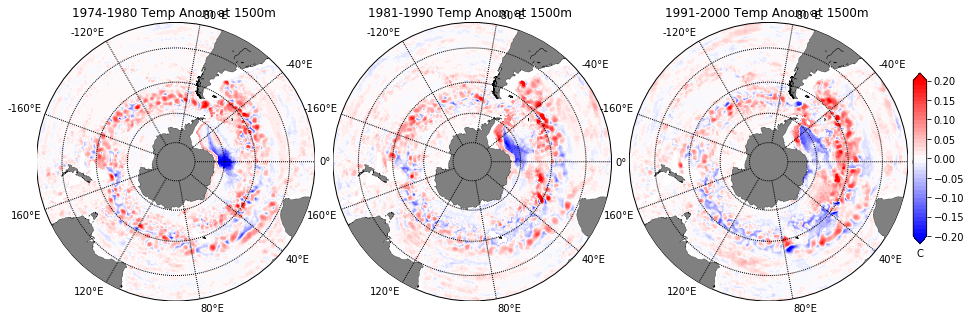

In [7]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

clev = np.arange(-.2,.21,.01)
print clev
st=30
print st_ocean[st]

plt.subplot(1,3,1)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
p1=map.contourf(X,Y,pert.temp[1:8,st,0:500,:].mean('Time').load()-cntrl.temp[1+3:8+3,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1974-1980 Temp Anom at 1500m ')

plt.subplot(1,3,2)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:])
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-1990 Temp Anom at 1500m ')

plt.subplot(1,3,3)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
p1=map.contourf(X,Y,pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[18+3:28+3,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1991-2000 Temp Anom at 1500m ')

ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')


plt.tight_layout()

#ax3 = plt.axes([0.92,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('C')


In [24]:
print yrs
print yrs[1:8]
print yrs[8:18]
print yrs[18:29]

[1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987
 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002
 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]
[1974 1975 1976 1977 1978 1979 1980]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001]


[ -2.00000000e-01  -1.90000000e-01  -1.80000000e-01  -1.70000000e-01
  -1.60000000e-01  -1.50000000e-01  -1.40000000e-01  -1.30000000e-01
  -1.20000000e-01  -1.10000000e-01  -1.00000000e-01  -9.00000000e-02
  -8.00000000e-02  -7.00000000e-02  -6.00000000e-02  -5.00000000e-02
  -4.00000000e-02  -3.00000000e-02  -2.00000000e-02  -1.00000000e-02
   1.66533454e-16   1.00000000e-02   2.00000000e-02   3.00000000e-02
   4.00000000e-02   5.00000000e-02   6.00000000e-02   7.00000000e-02
   8.00000000e-02   9.00000000e-02   1.00000000e-01   1.10000000e-01
   1.20000000e-01   1.30000000e-01   1.40000000e-01   1.50000000e-01
   1.60000000e-01   1.70000000e-01   1.80000000e-01   1.90000000e-01
   2.00000000e-01]
4555.56591797


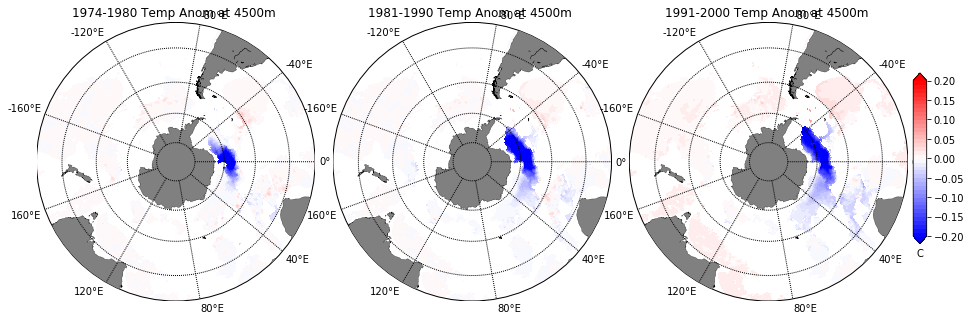

In [8]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

clev = np.arange(-.2,.21,.01)
print clev

st=45
print st_ocean[45]

plt.subplot(1,3,1)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
p1=map.contourf(X,Y,pert.temp[1:8,st,0:500,:].mean('Time').load()-cntrl.temp[1+3:8+3,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1974-1980 Temp Anom at 4500m ')

plt.subplot(1,3,2)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-1990 Temp Anom at 4500m ')

plt.subplot(1,3,3)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+2,st,0:500,:].mean('Time').load(), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1991-2000 Temp Anom at 4500m ')

ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

plt.tight_layout()

#ax3 = plt.axes([0.92,0.38,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('C')

1497.56188965
2474.04296875
3508.63305664
4555.56591797


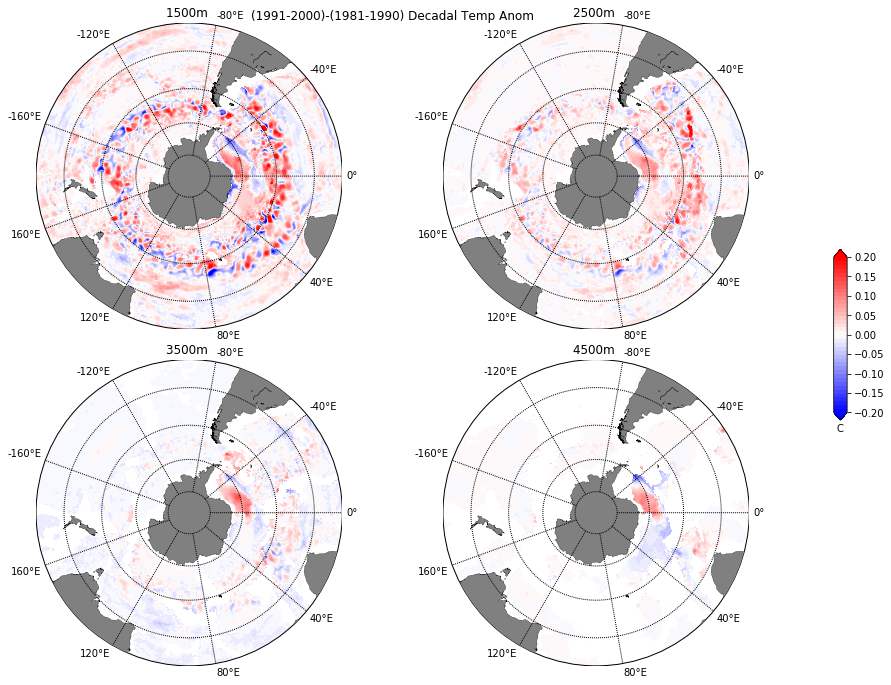

In [9]:

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('(1991-2000)-(1981-1990) Decadal Temp Anom')
clev = np.arange(-.2,.21,.01)
#print clev

st=30
print st_ocean[30]

var1=pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load()
var2=pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[18+3:28+3,st,0:500,:].mean('Time').load()

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,var2-var1, cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1500m ')


st=35
print st_ocean[st]
var1=pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load()
var2=pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[18+3:28+3,st,0:500,:].mean('Time').load()

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,var2-var1,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2500m ')

st=40
print st_ocean[st]
var1=pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load()
var2=pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[18+3:28+30,st,0:500,:].mean('Time').load()

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,var2-var1,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('3500m ')

st=45
print st_ocean[st]
var1=pert.temp[8:18,st,0:500,:].mean('Time').load()-cntrl.temp[8+3:18+3,st,0:500,:].mean('Time').load()
var2=pert.temp[18:28,st,0:500,:].mean('Time').load()-cntrl.temp[18+3:28+3,st,0:500,:].mean('Time').load()

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-25,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,var2-var1,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('4500m ')

ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

plt.tight_layout()

#ax3 = plt.axes([0.92,0.38,0.015,0.25])

In [27]:
#calc zonal average temp anomalies
#Plot zonal average temp anomaly across weddell
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-65)
#y2=np.argwhere(xt_ocean<15)
y1=y1[-1]
#y2=y2[-1]
print x1, x2

#print xt_ocean[x1:x2]
#print yt_ocean[:y1]

[959] [1179]


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/xarray/core/indexing.py:305: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
  return None if value is None else operator.index(value)


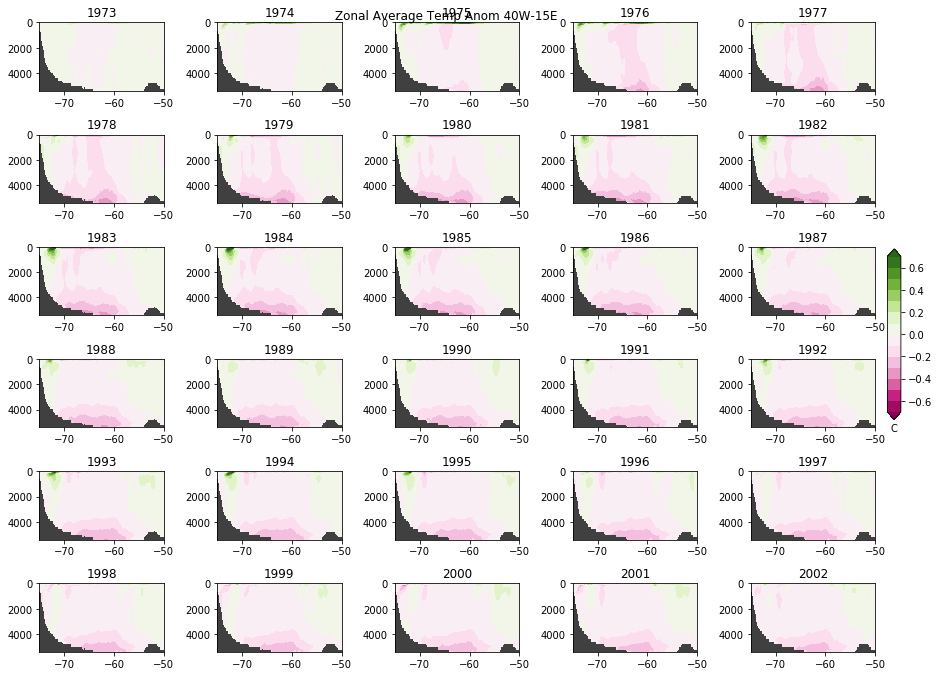

In [28]:
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('Zonal Average Temp Anom 40W-15E')
#print cntrl.temp.shape
#print pert.temp.shape

#plt.subplot(211)
#clev = np.arange(-2,20,1)
#plt.contourf(yt_ocean[0:500],st_ocean,np.mean(cntrl_temp[:,:,x1:x2],axis=2),cmap=plt.cm.PiYG,levels=clev,extend='both')
#cb=plt.colorbar(orientation='vertical',shrink = 0.7)
#cb.ax.set_xlabel('Temp')
#plt.contour(yt_ocean[0:500],st_ocean,np.mean(cntrl_temp[:,:,x1:x2],axis=2),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,np.mean(cntrl_temp[:,:,x1:x2],axis=2),levels=[0.0,],colors='k',linewidths=0.5)
#plt.gca().invert_yaxis()
##plt.gca().yaxis.set_major_formatter(x_formatter)
##plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
#plt.xlim([-75,-50])
#plt.title('Control Temp')

yrs=np.arange(1973,2016,1)

ii=0
for yr in range(0,30):
    #print yr

    plt.subplot(6,5,yr+1)
    plt.gca().patch.set_color('.25')
    clev = np.arange(-.7,.71,0.1)
    
    p1=plt.contourf(yt_ocean[0:500],st_ocean,pert.temp[yr,:,0:500,x1:x2].mean('xt_ocean').load()-cntrl.temp[yr+3,:,0:500,x1:x2].mean('xt_ocean').load(),cmap=plt.cm.PiYG,levels=clev,extend='both')
        
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('kg/m3')
    #plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
    #plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
    plt.gca().invert_yaxis()
    #plt.gca().yaxis.set_major_formatter(x_formatter)
    #plt.ylim((1037.5,1034))
    #plt.ylabel('Depth (m)')
    #plt.xlabel('Latitude ($^\circ$S)')
    plt.xlim([-75,-50])
    plt.title(yrs[yr])
    #plt.title('40W to 15E Temp Anomaly 1976')

ax3 = plt.axes([0.99,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

#plt.subplot(224)
#plt.gca().patch.set_color('.25')
#clev = np.arange(-.5,.51,0.1)
#plt.contourf(yt_ocean[0:500],st_ocean,np.mean(pert_temp[9,:,:,:],axis=2)-np.mean(cntrl_temp[:,:,:],axis=2),cmap=plt.cm.PiYG,levels=clev,extend='both')
#plt.title('180W to 180E Temp Anomaly 1982')

plt.tight_layout()

#of = os.path.join(NYFPertDir,'zavTanom.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'zavgTanom.png')
plt.savefig(of,dpi=220)

In [19]:
#store time-series between 60-65S and 40W-15E for hovmoeller
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-70)
y2=np.argwhere(yt_ocean<-63)
y1=y1[-1]
y2=y2[-1]
print x1, x2
print y1, y2

#this is inaccurate ... area weight for yt_ocean
cTz=cntrl.temp[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print cTz.shape

pTz=pert.temp[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print pTz.shape

[959] [1179]
[104] [170]
(50, 50)
(44, 50)


[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
(21,)
(46,)
(50,)
(1, 50)
(45, 50)
(44, 50) 44
(50, 50)
(41, 50)


Text(0.5,1,u'70-63S and 40W-15E Temp Anom')

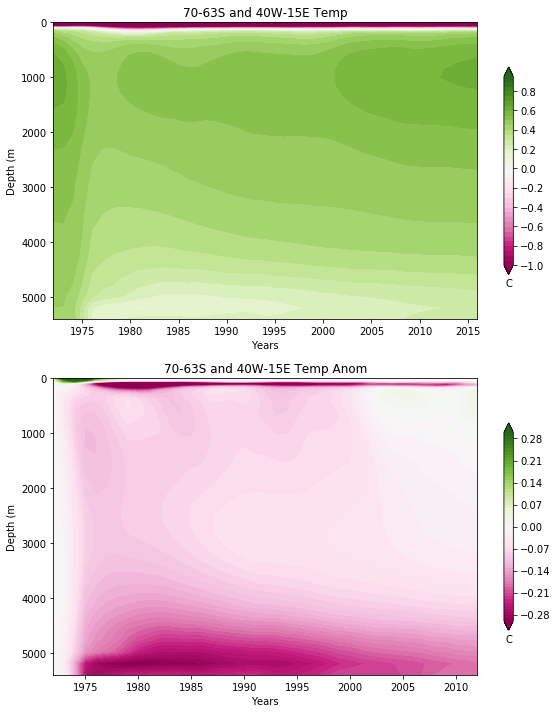

In [7]:
#plot temp hovmoeller of depth vs time
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

time = np.arange(-1,20,1)
print time
print time.shape

yrs=np.arange(1972,2018,1)
print yrs.shape

print cTz[0,:].shape
var1=np.expand_dims(cTz[0,:], axis=0)
print var1.shape
var2 = np.concatenate((var1,pTz),axis=0)
print var2.shape

clev = np.arange(-1,1,.05)
#print clev

plt.subplot(211)
plt.contourf(yrs[0:45],st_ocean,var2.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('C')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('70-63S and 40W-15E Temp')

clev = np.arange(-.3,.31,.01)
#print clev


print pTz.shape, pTz.shape[0]
print cTz.shape

a=pTz-cTz[0:pTz.shape[0],:]
print a.shape


plt.subplot(212)
plt.contourf(yrs[0:41],st_ocean,a.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('C')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('70-63S and 40W-15E Temp Anom')

In [40]:
#redo Purkey et al., 2018 figs 2: Temp trend mC/yr from 1981-2000 and 2000-2016. Assume linear trend.
#Southern Ocean and Global Ocean

#years is 1980-2020
#print cTemp.shape
print cntrl.temp.shape
#print pert.temp.shape

#area integrate over Southern Ocean and plot vertical profile of temp trend
y1=np.argwhere(yt_ocean<-60)
y2=np.argwhere(yt_ocean<-55)
y1=y1[-1]
y2=y2[-1]
print yt_ocean[y1], yt_ocean[y2]

#mask area_t for land cells.
msk=np.zeros((kmt.shape[0],kmt.shape[1]))
print msk.shape
msk[np.where(kmt>=1)]=1
area_t_mask=area_t*msk
print area_t_mask[:,500]

cTz=np.zeros((cntrl.temp.shape[0],cntrl.temp.shape[1]))
print cTz.shape

for t in range(cntrl.temp.shape[0]):
    print t
    
    for k in range(cntrl.temp.shape[1]):
        cTz[t,k]=np.ma.sum(cntrl.temp[t,k,0:y1,:].load()*area_t_mask[0:y1,:])
        cTz[t,k]=cTz[t,k]/np.ma.sum(area_t_mask[0:y1,:])
    
print cTz.shape
of=os.path.join(NYFCntrlDir,'cTz_Sof60S_1971-2020.npy')
a=np.save(of,cTz)

(50, 50, 1080, 1440)
[-60.08436456] [-55.13874852]
(1080, 1440)
[        0.         0.         0. ...,  71020792.  71017104.  70960376.]
(50, 50)
0


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:30: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:31: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
(50, 50)


In [41]:
#redo Purkey et al., 2018 figs 2: Temp trend mC/yr from 1981-2000 and 2000-2016. Assume linear trend.
#Southern Ocean and Global Ocean

#20 years is 1973-1993
#print cntrl.temp.shape
print pert.temp.shape

#area integrate over Southern Ocean and plot vertical profile of temp trend
y1=np.argwhere(yt_ocean<-60)
#y1=np.argwhere(yt_ocean<-55)
y1=y1[-1]

#mask area_t for land cells.
msk=np.zeros((kmt.shape[0],kmt.shape[1]))
print msk.shape
msk[np.where(kmt>=1)]=1
area_t_mask=area_t*msk
print area_t_mask[:,500]

pTz=np.zeros((pert.temp.shape[0],pert.temp.shape[1]))
print pTz.shape

for t in range(pert.temp.shape[0]):
    print t
    
    for k in range(pert.temp.shape[1]):
        pTz[t,k]=np.ma.sum(pert.temp[t,k,0:y1,:].load()*area_t_mask[0:y1,:])
        pTz[t,k]=pTz[t,k]/np.ma.sum(area_t_mask[0:y1,:])
    
print pTz.shape
print pTz[0,:]
print pTz[19,:]
of=os.path.join(NYFPertDir,'pTz_Sof60S.npy')
a=np.save(of,pTz)



(44, 50, 1080, 1440)
(1080, 1440)
[        0.         0.         0. ...,  71020792.  71017104.  70960376.]
(44, 50)
0


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:28: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
(44, 50)
[-0.71869563 -0.75851336 -0.84498685 -0.99149136 -1.07097408 -1.02252803
 -0.83076291 -0.54426541 -0.2236394   0.07217382  0.32209822  0.52093709
  0.67088959  0.77940139  0.85877167  0.9251365   0.98858694  1.04648099
  1.09655068  1.13769253  1.16457847  1.17825069  1.18160531  1.17209805
  1.15397681  1.11891175  1.07090189  1.01312455  0.9569314   0.90261364
  0.85236648  0.80575165  0.76347666  0.72476619  0.6882245   0.65083444
  0.61190839  0.57054595  0.52910299  0.48872654  0.44927035  0.40393503
  0.35633593  0.30547268  0.24229182  0.18126684  0.13721631  0.08982992
  0.03822004  0.00345029]
[-0.7202309  -0.75846958 -0.84356728 -0.99474964 -1.07709207 -1.02941707
 -0.84561386 -0.56689339 -0.25311555  0.04065887  0.29768807  0.50506337
  0.65827151  0.7681523   0.84974717  0.91998187  0.98612892  1.04454134
  1.09497938  1.13688     1.1632994   1.17

In [42]:
#just do Atlantic Sector
#mask area_t for land cells.
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<30)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-60)
#y1=np.argwhere(yt_ocean<-55)
y1=y1[-1]


msk=np.zeros((kmt.shape[0],kmt.shape[1]))
print msk.shape
msk[np.where(kmt>=1)]=1
area_t_mask=area_t*msk
print area_t_mask[:,500]

cAtlTz=np.zeros((cntrl.temp.shape[0],cntrl.temp.shape[1]))
print cAtlTz.shape

for t in range(cntrl.temp.shape[0]):
    print t
    
    for k in range(cntrl.temp.shape[1]):
        cAtlTz[t,k]=np.ma.sum(cntrl.temp[t,k,0:y1,x1:x2].load()*area_t_mask[0:y1,x1:x2])
        cAtlTz[t,k]=cAtlTz[t,k]/np.ma.sum(area_t_mask[0:y1,x1:x2])
    
print cAtlTz.shape
of=os.path.join(NYFCntrlDir,'cAtlTz_Sof60S_1971-2020.npy')
a=np.save(of,cAtlTz)



(1080, 1440)
[        0.         0.         0. ...,  71020792.  71017104.  70960376.]
(50, 50)
0


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:26: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
(50, 50)


NameError: name 'cntrl2' is not defined

In [43]:
#just do Atlantic Sector
#mask area_t for land cells.
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<30)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-60)
#y1=np.argwhere(yt_ocean<-55)
y1=y1[-1]


msk=np.zeros((kmt.shape[0],kmt.shape[1]))
print msk.shape
msk[np.where(kmt>=1)]=1
area_t_mask=area_t*msk
print area_t_mask[:,500]

pAtlTz=np.zeros((pert.temp.shape[0],pert.temp.shape[1]))
print pAtlTz.shape

for t in range(pert.temp.shape[0]):
    print t
    
    for k in range(pert.temp.shape[1]):
        pAtlTz[t,k]=np.ma.sum(pert.temp[t,k,0:y1,x1:x2].load()*area_t_mask[0:y1,x1:x2])
        pAtlTz[t,k]=pAtlTz[t,k]/np.ma.sum(area_t_mask[0:y1,x1:x2])
    
print pAtlTz.shape
print pAtlTz[0,:]
print pAtlTz[19,:]
of=os.path.join(NYFPertDir,'pAtlTz_Sof60S.npy')
a=np.save(of,pAtlTz)

(1080, 1440)
[        0.         0.         0. ...,  71020792.  71017104.  70960376.]
(44, 50)
0


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:26: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
(44, 50)
[-1.32206724 -1.35489427 -1.41502327 -1.48836497 -1.47980699 -1.38705503
 -1.19992772 -0.92903907 -0.61981646 -0.35386773 -0.15543978 -0.00970084
  0.10061601  0.18201886  0.23469872  0.26761638  0.29012126  0.31013973
  0.32857466  0.34917363  0.37002839  0.39614834  0.42917226  0.45620814
  0.48312684  0.50818299  0.52217565  0.52967666  0.53392136  0.53144085
  0.52560506  0.51634624  0.5051766   0.4922124   0.47835278  0.46401214
  0.45054943  0.43653256  0.42324416  0.40985755  0.3955865   0.37902045
  0.36195311  0.34219689  0.31387211  0.27871592  0.2298283   0.16802158
  0.08540787  0.01595581]
[-1.34974797 -1.37698406 -1.43253618 -1.53067057 -1.54683716 -1.46409817
 -1.30138166 -1.0595502  -0.76463054 -0.49121948 -0.26872783 -0.09902187
  0.02575606  0.11459665  0.17719906  0.22107968  0.25270912  0.27762359
  0.29851666  0.31957768  0.34148403  0.36

In [25]:
cyrs=arange(1970,2019,1)
pyrs=arange(1973,2016,1)
print cyrs.shape

print cyrs[3:11]
print pyrs[0:8]


print cyrs[11:31]
print pyrs[8:28]


print cyrs[31:47]
print pyrs[28:44]


(49,)
[1973 1974 1975 1976 1977 1978 1979 1980]
(43,)
[1973 1974 1975 1976 1977 1978 1979 1980]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015
 2016]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]


(50, 50)
(44, 50)
(50,)
[1973 1974 1975 1976 1977 1978 1979 1980]
(44,)
[1973 1974 1975 1976 1977 1978 1979 1980]
[0, 1, 2, 3, 4, 5, 6, 7]
(2, 50)
[-0.00421419 -0.0041225  -0.00399121 -0.0053394  -0.00733377 -0.0091247
 -0.01117213 -0.01301588 -0.01497218 -0.01629735 -0.01634007 -0.015509
 -0.01401489 -0.0119768  -0.00996316 -0.00793393 -0.00606279 -0.00428497
 -0.00283877 -0.0018227  -0.0013157  -0.0010198  -0.00094899 -0.00097477
 -0.0010858  -0.00115748 -0.00127738 -0.00138345 -0.00149466 -0.00160946
 -0.00173793 -0.00181802 -0.0018261  -0.00179706 -0.00175285 -0.00172451
 -0.001738   -0.00180605 -0.00189062 -0.00201391 -0.0021642  -0.00235483
 -0.00255574 -0.00276584 -0.00293977 -0.00301858 -0.00288867 -0.00248598
 -0.00153583 -0.000385  ]
(2, 50)
[ -1.60770275e-04  -1.54907069e-04  -1.64169572e-04  -8.38456716e-05
   3.86133758e-05   9.45914080e-05   1.56160686e-04   4.91403818e-04
   6.71454350e-04   1.96016887e-04  -1.83877103e-04  -1.73017189e-04
   7.65577587e-05   3.11075813e

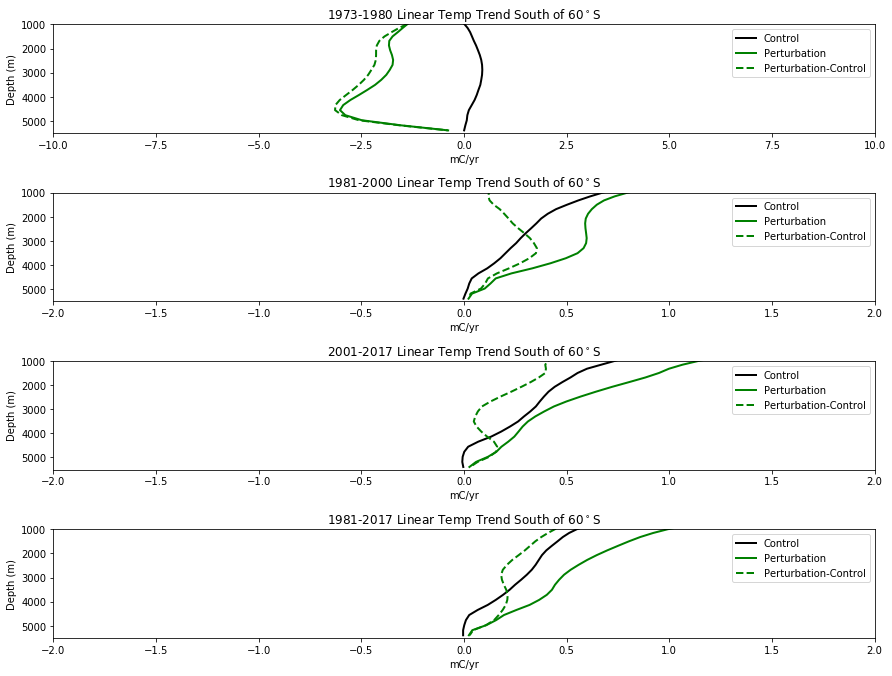

In [53]:
#Do southern ocean trend plot
of=os.path.join(NYFCntrlDir,'cTz_Sof60S_1971-2020.npy')
cTz=np.load(of)
print cTz.shape


of=os.path.join(NYFPertDir,'pTz_Sof60S.npy')
pTz=np.load(of)
print pTz.shape

cyrs=arange(1970,2020,1)
pyrs=arange(1973,2017,1)
print cyrs.shape
print cyrs[3:11]
print pyrs.shape
print pyrs[0:8]

#calc linear trend in mC/yr over whole period
print range(8)
tr_pTz=np.polyfit(range(8), pTz[0:8,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(8), cTz[3:11,:],1)
print tr_cTz.shape
print tr_cTz[0,:]


plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

plt.subplot(411)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
plt.xlim([-10,10])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1973-1980 Linear Temp Trend South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 1981-2000 (8 years from 1973) 
print cyrs[11:31]
print pyrs.shape
print pyrs[8:28]

print range(20)
tr_pTz=np.polyfit(range(20), pTz[8:28,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(20), cTz[8+3:28+3,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(412)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
plt.xlim([-2,2])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1981-2000 Linear Temp Trend South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 2001-2011 (8 years from 1973) 
print cyrs[31:50]
print pyrs[28:44]

tr_pTz=np.polyfit(range(16), pTz[28:44,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(16), cTz[31:47,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(413)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
plt.xlim([-2,2])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='2001-2017 Linear Temp Trend South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 1981-2017 
print cyrs[3:41]
print pyrs[0:38]

tr_pTz=np.polyfit(range(36), pTz[8:44,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(36), cTz[3+8:44+3,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(414)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
plt.xlim([-2,2])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1981-2017 Linear Temp Trend South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

plt.tight_layout()

#of = os.path.join(NYFPertDir,'gmoc_ts.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'tr_Tz.png')
plt.savefig(of,dpi=220)

In [21]:

cyrs=arange(1970,2019,1)
pyrs=arange(1973,2016,1)
print cyrs.shape
print cyrs[3:11]
print pyrs.shape
print pyrs[0:8]


print cyrs[11:31]
print pyrs[8:28]


print cyrs[31:47]
print pyrs[28:44]


(49,)
[1973 1974 1975 1976 1977 1978 1979 1980]
(43,)
[1973 1974 1975 1976 1977 1978 1979 1980]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015
 2016]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]


(50, 50)
(44, 50)
(49,)
[1973 1974 1975 1976 1977 1978 1979 1980]
(43,)
[1973 1974 1975 1976 1977 1978 1979 1980]
[0, 1, 2, 3, 4, 5, 6, 7]
(2, 50)
[-0.0233822  -0.0227706  -0.0218146  -0.02667519 -0.03346644 -0.03864818
 -0.04516151 -0.05301007 -0.06049413 -0.0645976  -0.06465285 -0.0611294
 -0.05542532 -0.04808549 -0.03999292 -0.03162837 -0.02409117 -0.01722961
 -0.01208208 -0.00814336 -0.00560993 -0.00413839 -0.00351308 -0.00350852
 -0.00392544 -0.00452705 -0.00528127 -0.00604952 -0.00684604 -0.00764157
 -0.0083503  -0.00879078 -0.00898373 -0.00901566 -0.00899448 -0.00901062
 -0.00914277 -0.00945415 -0.00992752 -0.01057018 -0.01131429 -0.01215944
 -0.01306663 -0.01399653 -0.01470215 -0.01490036 -0.0141311  -0.01208793
 -0.0073798  -0.00183985]
(2, 50)
[ -4.53233043e-05   8.62153007e-05   1.75141223e-04   3.44118790e-04
   5.75113997e-04  -5.30845000e-04  -1.93977638e-03  -1.07600268e-03
   1.58997859e-04  -6.25524980e-04  -2.10621218e-03  -2.52611233e-03
  -2.00524889e-03  -1.6009631

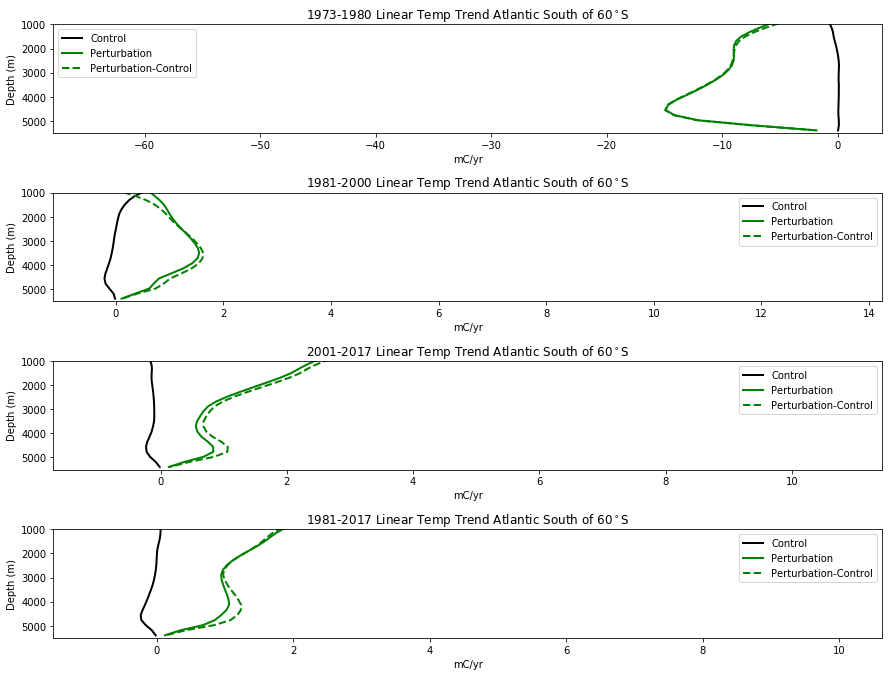

In [24]:
#Do Atlantic sector of southern ocean trend plot

of=os.path.join(NYFCntrlDir,'cAtlTz_Sof60S_1971-2020.npy')
cAtlTz=np.load(of)
print cAtlTz.shape

of=os.path.join(NYFPertDir,'pAtlTz_Sof60S.npy')
pAtlTz=np.load(of)
print pAtlTz.shape


cyrs=arange(1970,2019,1)
pyrs=arange(1973,2016,1)
print cyrs.shape
print cyrs[3:11]
print pyrs.shape
print pyrs[0:8]

#calc linear trend in mC/yr over whole period
print range(8)
tr_pTz=np.polyfit(range(8), pAtlTz[0:8,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(8), cAtlTz[3:11,:],1)
print tr_cTz.shape
print tr_cTz[0,:]


plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

plt.subplot(411)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
#plt.xlim([-20,20])
plt.xlim([-30,10])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1973-1980 Linear Temp Trend Atlantic South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 1981-2000 (8 years from 1973) 
print cyrs[11:31]
print pyrs.shape
print pyrs[8:28]

print range(20)
tr_pTz=np.polyfit(range(20), pAtlTz[8:28,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(20), cAtlTz[11:31,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(412)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
#plt.xlim([-5,5])
plt.xlim([-3,9])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1981-2000 Linear Temp Trend Atlantic South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 2001-2017 (8 years from 1973) 
print cyrs[31:47]
print pyrs[28:44]

print range(16)
tr_pTz=np.polyfit(range(16), pAtlTz[28:44,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(16), cAtlTz[31:47,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(413)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
#plt.xlim([-5,5])
plt.xlim([-3,9])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='2001-2017 Linear Temp Trend Atlantic South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

#calc linear trend in mC/yr since 1981-2017 
print cyrs[8+3:47]
print pyrs[8:44]

tr_pTz=np.polyfit(range(44-8), pAtlTz[8:44,:],1)
print tr_pTz.shape
print tr_pTz[0,:]

tr_cTz=np.polyfit(range(44-8), cAtlTz[8+3:47,:],1)
print tr_cTz.shape
print tr_cTz[0,:]

plt.subplot(414)
plt.plot(tr_cTz[0,:]*1000,st_ocean,linestyle='-',color='k',label='Control',linewidth=2)
plt.plot(tr_pTz[0,:]*1000,st_ocean,linestyle='-',color='g',label='Perturbation',linewidth=2)
plt.plot(tr_pTz[0,:]*1000-tr_cTz[0,:]*1000,st_ocean,linestyle='--',color='g',label='Perturbation-Control',linewidth=2)
#plt.xlim([-2,2])
plt.xlim([-3,9])
plt.ylim([1000,5500])
plt.gca().invert_yaxis()
plt.xlabel('mC/yr')
plt.ylabel('Depth (m)')
tit='1981-2017 Linear Temp Trend Atlantic South of 60$^\circ$S'
plt.title(tit)
plt.legend(fontsize=10)

plt.tight_layout()

#of = os.path.join(NYFPertDir,'gmoc_ts.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'tr_AtlTz.png')
plt.savefig(of,dpi=220)

In [9]:
#depth average between 2000-4000m and below 4000m, Fig 3 of Purkey et al., 2016.
#calculate linear ocean warming trends spanning 1981 to 2016
dst=np.zeros(50)
dst[1:50]=np.diff(st_ocean)
dst[0]=st_ocean[0]
print dst.shape

#depth integrate from 2000-4000 and 4000:
print st_ocean[33:43]
print st_ocean[43:50]



print pert.temp.shape
pT_2to4=np.zeros((pert.temp.shape[0],pert.temp.shape[2],pert.temp.shape[3]))
pT_4to6=np.zeros((pert.temp.shape[0],pert.temp.shape[2],pert.temp.shape[3]))
print pT_2to4.shape


#also do in j/m2
pT_2to4_jm2=np.zeros((pert.temp.shape[0],pert.temp.shape[2],pert.temp.shape[3]))
pT_4to6_jm2=np.zeros((pert.temp.shape[0],pert.temp.shape[2],pert.temp.shape[3]))

#W/m2=K/yr*yr/s*J/kg/K*kg/m3*m
#J/s/m2=W/m2

#K *m *J/kg/K *kg/m3 = J/m2
Cp=3985
rho0=1034


for t in range(pert.temp.shape[0]):
    print t
    
    pT_2to4[t,:,:]=np.ma.sum(pert.temp[t,33:43,:,:].load()*dzt[33:43,:,:],axis=0)/np.ma.sum(dzt[33:43,:,:],axis=0)
    pT_4to6[t,:,:]=np.ma.sum(pert.temp[t,43:50,:,:].load()*dzt[43:50,:,:],axis=0)/np.ma.sum(dzt[43:50,:,:],axis=0)
    pT_2to4_jm2[t,:,:]=np.ma.sum(pert.temp[t,33:43,:,:].load()*dzt[33:43,:,:],axis=0)*Cp*rho0
    pT_4to6_jm2[t,:,:]=np.ma.sum(pert.temp[t,43:50,:,:].load()*dzt[43:50,:,:],axis=0)*Cp*rho0

print pT_2to4.shape
of=os.path.join(NYFPertDir,'pT_2to4.npy')
a=np.save(of,pT_2to4)

print pT_4to6.shape
of=os.path.join(NYFPertDir,'pT_4to6.npy')
a=np.save(of,pT_4to6)    

print pT_2to4_jm2.shape
of=os.path.join(NYFPertDir,'pT_2to4_jm2.npy')
a=np.save(of,pT_2to4_jm2)

print pT_4to6_jm2.shape
of=os.path.join(NYFPertDir,'pT_4to6_jm2.npy')
a=np.save(of,pT_4to6_jm2)    

(50,)
[ 2071.25195312  2271.32324219  2474.04296875  2678.75708008  2884.89794922
  3092.1171875   3300.0859375   3508.63305664  3717.56713867  3926.81274414]
[ 4136.25146484  4345.86376953  4555.56591797  4765.36865234  4975.20947266
  5185.11083984  5395.02294922]
(44, 50, 1080, 1440)
(44, 1080, 1440)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
(44, 1080, 1440)
(44, 1080, 1440)
(44, 1080, 1440)
(44, 1080, 1440)


In [8]:
#depth average between 2000-4000m and below 4000m, Fig 3 of Purkey et al., 2016.
#calculate linear ocean warming trends spanning 1981 to 2016

#depth integrate from 2000-4000 and 4000:
print st_ocean[33:43]
print st_ocean[43:50]

print cntrl.temp.shape
cT_2to4=np.zeros((50,cntrl.temp.shape[2],cntrl.temp.shape[3]))
cT_4to6=np.zeros((50,cntrl.temp.shape[2],cntrl.temp.shape[3]))
print cT_2to4.shape

#also do in j/m2
#K *m *J/kg/K *kg/m3 = J/m2
Cp=3985
rho0=1034
cT_2to4_jm2=np.zeros((50,cntrl.temp.shape[2],cntrl.temp.shape[3]))
cT_4to6_jm2=np.zeros((50,cntrl.temp.shape[2],cntrl.temp.shape[3]))


for t in range(50):
    print t
    
    cT_2to4[t,:,:]=np.ma.sum(cntrl.temp[t,33:43,:,:].load()*dzt[33:43,:,:],axis=0)/np.ma.sum(dzt[33:43,:,:],axis=0)
    cT_4to6[t,:,:]=np.ma.sum(cntrl.temp[t,43:50,:,:].load()*dzt[43:50,:,:],axis=0)/np.ma.sum(dzt[43:50,:,:],axis=0)
    cT_2to4_jm2[t,:,:]=np.ma.sum(cntrl.temp[t,33:43,:,:].load()*dzt[33:43,:,:],axis=0)*Cp*rho0
    cT_4to6_jm2[t,:,:]=np.ma.sum(cntrl.temp[t,43:50,:,:].load()*dzt[43:50,:,:],axis=0)*Cp*rho0

print cT_2to4.shape
of=os.path.join(NYFCntrlDir,'cT_2to4.npy')
a=np.save(of,cT_2to4)

print cT_4to6.shape
of=os.path.join(NYFCntrlDir,'cT_4to6.npy')
a=np.save(of,cT_4to6)    

print cT_2to4_jm2.shape
of=os.path.join(NYFCntrlDir,'cT_2to4_jm2.npy')
a=np.save(of,cT_2to4_jm2)

print cT_4to6_jm2.shape
of=os.path.join(NYFCntrlDir,'cT_4to6_jm2.npy')
a=np.save(of,cT_4to6_jm2)   

[ 2071.25195312  2271.32324219  2474.04296875  2678.75708008  2884.89794922
  3092.1171875   3300.0859375   3508.63305664  3717.56713867  3926.81274414]
[ 4136.25146484  4345.86376953  4555.56591797  4765.36865234  4975.20947266
  5185.11083984  5395.02294922]
(50, 50, 1080, 1440)
(50, 1080, 1440)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
(50, 1080, 1440)
(50, 1080, 1440)
(50, 1080, 1440)
(50, 1080, 1440)


In [6]:
of=os.path.join(NYFCntrlDir,'cT_2to4.npy')
cT_2to4=np.load(of)

of=os.path.join(NYFCntrlDir,'cT_4to6.npy')
cT_4to6=np.load(of)  

print cT_2to4.shape
print cT_4to6.shape

of=os.path.join(NYFPertDir,'pT_2to4.npy')
pT_2to4=np.load(of)

of=os.path.join(NYFPertDir,'pT_4to6.npy')
pT_4to6=np.load(of)  

print pT_2to4.shape
print pT_4to6.shape


(50, 1080, 1440)
(50, 1080, 1440)
(44, 1080, 1440)
(44, 1080, 1440)


In [7]:
of=os.path.join(NYFCntrlDir,'cT_2to4_jm2.npy')
cT_2to4_jm2=np.load(of)

of=os.path.join(NYFCntrlDir,'cT_4to6_jm2.npy')
cT_4to6_jm2=np.load(of)  

print cT_2to4_jm2.shape
print cT_4to6_jm2.shape

of=os.path.join(NYFPertDir,'pT_2to4_jm2.npy')
pT_2to4_jm2=np.load(of)

of=os.path.join(NYFPertDir,'pT_4to6_jm2.npy')
pT_4to6_jm2=np.load(of)  

print pT_2to4_jm2.shape
print pT_4to6_jm2.shape

(50, 1080, 1440)
(50, 1080, 1440)
(44, 1080, 1440)
(44, 1080, 1440)


In [8]:
cyrs=arange(1970,2019,1)
pyrs=arange(1973,2016,1)
print cyrs.shape
print cyrs[3:11]
print pyrs.shape
print pyrs[0:8]


print cyrs[11:21]
print cyrs[21:31]
print pyrs[8:18]
print pyrs[18:28]

(49,)
[1973 1974 1975 1976 1977 1978 1979 1980]
(43,)
[1973 1974 1975 1976 1977 1978 1979 1980]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000]


[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000]


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:1711: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:
/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/matplotlib/figure.py:1999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


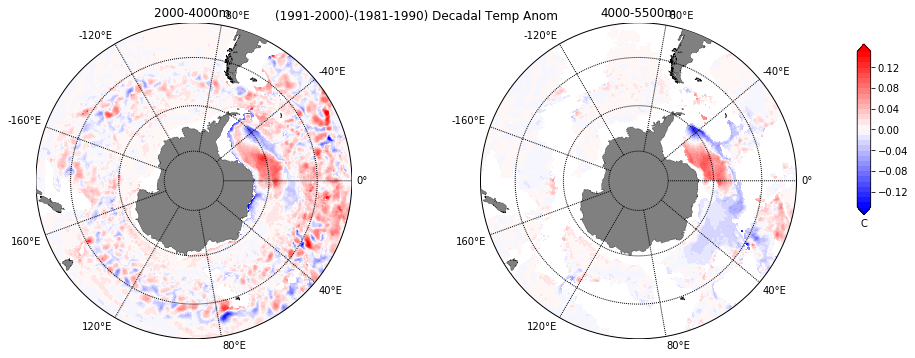

In [35]:

plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.suptitle('(1991-2000)-(1981-1990) Decadal Temp Anom')

clev = np.arange(-.15,.16,.01)
#print clev
print cyrs[11:21]
print cyrs[21:31]
print pyrs[8:18]
print pyrs[18:28]


var1=np.mean(cT_2to4[11:21,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var2=np.mean(cT_2to4[21:31,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var3=np.mean(pT_2to4[8:18,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var4=np.mean(pT_2to4[18:28,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,(var4-var2)-(var3-var1), cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2000-4000m ')

ax3 = plt.axes([0.99,0.68,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('C')

clev = np.arange(-.15,.16,.01)

var1=np.mean(cT_4to6[11:21,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var2=np.mean(cT_4to6[21:31,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var3=np.mean(pT_4to6[8:18,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()
var4=np.mean(pT_4to6[18:28,0:500,:],axis=0) #-cntrl2.temp[0:10,st,0:500,:].mean('Time').load()

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,(var4-var2)-(var3-var1),cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
#cb=plt.colorbar(orientation='vertical',shrink = 0.5)
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('4000-5500m')

plt.tight_layout()

of = os.path.join(NYFPertDir,'Tanom_decadal.png')
plt.savefig(of,dpi=220)

#ax3 = plt.axes([0.92,0.38,0.015,0.25])

In [9]:
#convert dT/dt to W/m2=J/s/m2
#dT/dt=K/s
#W=J/s
#Cp=3985 J/kg/K

#dT/dt*Cp = J/s/kg*rho_0 = J/s/m3 *layer thickness?

#calc dT/dt
cyrs=np.arange(1971,2017,1)
pyrs=np.arange(1973,2017,1)

#calc linear trend in C/s since 1981-2000 (8 years from 1973) 
print cyrs[11:31]
print pyrs[8:28]
print pyrs[18:28]

tr81to00_pT_2to4=np.zeros((500,1440))
tr81to00_cT_2to4=np.zeros((500,1440))
tr81to00_pT_4to6=np.zeros((500,1440))
tr81to00_cT_4to6=np.zeros((500,1440))

tr00to17_pT_2to4=np.zeros((500,1440))
tr00to17_cT_2to4=np.zeros((500,1440))
tr00to17_pT_4to6=np.zeros((500,1440))
tr00to17_cT_4to6=np.zeros((500,1440))

tr81to17_pT_2to4=np.zeros((500,1440))
tr81to17_cT_2to4=np.zeros((500,1440))
tr81to17_pT_4to6=np.zeros((500,1440))
tr81to17_cT_4to6=np.zeros((500,1440))


for j in range(0,500):
    #print j
    
    tr81to00_pT_2to4[j,:]=np.polyfit(range(20), pT_2to4[8:28,j,:],1)[0,:]
    tr81to00_cT_2to4[j,:]=np.polyfit(range(20), cT_2to4[11:31,j,:],1)[0,:]
    
    tr00to17_pT_2to4[j,:]=np.polyfit(range(16), pT_2to4[28:44,j,:],1)[0,:]
    tr00to17_cT_2to4[j,:]=np.polyfit(range(16), cT_2to4[31:47,j,:],1)[0,:]
    
    tr81to17_pT_2to4[j,:]=np.polyfit(range(36), pT_2to4[8:44,j,:],1)[0,:]
    tr81to17_cT_2to4[j,:]=np.polyfit(range(36), cT_2to4[11:47,j,:],1)[0,:]

    tr81to00_pT_4to6[j,:]=np.polyfit(range(20), pT_4to6[8:28,j,:],1)[0,:]
    tr81to00_cT_4to6[j,:]=np.polyfit(range(20), cT_4to6[11:31,j,:],1)[0,:]    
    
    tr00to17_pT_4to6[j,:]=np.polyfit(range(16), pT_4to6[28:44,j,:],1)[0,:]
    tr00to17_cT_4to6[j,:]=np.polyfit(range(16), cT_4to6[31:47,j,:],1)[0,:]

    tr81to17_pT_4to6[j,:]=np.polyfit(range(36), pT_4to6[8:44,j,:],1)[0,:]
    tr81to17_cT_4to6[j,:]=np.polyfit(range(36), cT_4to6[11:47,j,:],1)[0,:]

#Cp=3985 J/kg/K
#dT/dt*Cp = J/s/kg*rho_0 = J/s/m3 *layer thickness?
s_yr=365*24*60*60
Cp=3985
rho0=1034
#print s_yr
#print np.ma.sum(dzt[33:43,500,500],axis=0)
#print np.ma.sum(dzt[43:50,500,500],axis=0)
#print pert.temp[0,43:50,500,500].load()
#print dzt[43:50,500,500]

#W/m2=K/yr*yr/s*J/kg/K*kg/m3*m
#J/s/m2=W/m2
#tr81to00_pT_2to4_wm2=tr81to00_pT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)
#tr81to00_cT_2to4_wm2=tr81to00_cT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)
#tr00to17_pT_2to4_wm2=tr81to00_pT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)
#tr00to17_cT_2to4_wm2=tr81to00_cT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)
#tr81to17_pT_2to4_wm2=tr81to00_pT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)
#tr81to17_cT_2to4_wm2=tr81to00_cT_2to4/s_yr*Cp*1034*np.ma.sum(dzt[33:43,0:500,:],axis=0)

#tr81to00_pT_4to6_wm2=tr81to00_pT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)
#tr81to00_cT_4to6_wm2=tr81to00_cT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)
#tr00to17_pT_4to6_wm2=tr81to00_pT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)
#tr00to17_cT_4to6_wm2=tr81to00_cT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)
#tr81to17_pT_4to6_wm2=tr81to00_pT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)
#tr81to17_cT_4to6_wm2=tr81to00_cT_4to6/s_yr*Cp*1034*np.ma.sum(dzt[43:50,0:500,:],axis=0)

#print tr81to00_pT_2to4_wm2.shape
    

[1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996
 1997 1998 1999 2000 2001]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000]


In [10]:
#calc W/m2= J/s/m2 = J/m2/yr (trend) / s_yr
cyrs=np.arange(1971,2017,1)
pyrs=np.arange(1973,2017,1)

#calc linear trend in C/s since 1981-2000 (8 years from 1973) 
print cyrs[10:30]
print pyrs[8:28]

print cyrs[30:40]
print pyrs[28:38]

tr81to00_pT_2to4_wm2=np.zeros((500,1440))
tr81to00_cT_2to4_wm2=np.zeros((500,1440))
tr81to00_pT_4to6_wm2=np.zeros((500,1440))
tr81to00_cT_4to6_wm2=np.zeros((500,1440))

tr00to17_pT_2to4_wm2=np.zeros((500,1440))
tr00to17_cT_2to4_wm2=np.zeros((500,1440))
tr00to17_pT_4to6_wm2=np.zeros((500,1440))
tr00to17_cT_4to6_wm2=np.zeros((500,1440))

tr81to17_pT_2to4_wm2=np.zeros((500,1440))
tr81to17_cT_2to4_wm2=np.zeros((500,1440))
tr81to17_pT_4to6_wm2=np.zeros((500,1440))
tr81to17_cT_4to6_wm2=np.zeros((500,1440))


for j in range(0,500):
    #print j
    
    tr81to00_pT_2to4_wm2[j,:]=np.polyfit(range(20), pT_2to4_jm2[8:28,j,:],1)[0,:]
    tr81to00_cT_2to4_wm2[j,:]=np.polyfit(range(20), cT_2to4_jm2[10:30,j,:],1)[0,:]
    
    tr00to17_pT_2to4_wm2[j,:]=np.polyfit(range(10), pT_2to4_jm2[28:38,j,:],1)[0,:]
    tr00to17_cT_2to4_wm2[j,:]=np.polyfit(range(10), cT_2to4_jm2[30:40,j,:],1)[0,:]
    
    tr81to17_pT_2to4_wm2[j,:]=np.polyfit(range(30), pT_2to4_jm2[8:38,j,:],1)[0,:]
    tr81to17_cT_2to4_wm2[j,:]=np.polyfit(range(30), cT_2to4_jm2[10:40,j,:],1)[0,:]

    tr81to00_pT_4to6_wm2[j,:]=np.polyfit(range(20), pT_4to6_jm2[8:28,j,:],1)[0,:]
    tr81to00_cT_4to6_wm2[j,:]=np.polyfit(range(20), cT_4to6_jm2[10:30,j,:],1)[0,:]    
    
    tr00to17_pT_4to6_wm2[j,:]=np.polyfit(range(10), pT_4to6_jm2[28:38,j,:],1)[0,:]
    tr00to17_cT_4to6_wm2[j,:]=np.polyfit(range(10), cT_4to6_jm2[30:40,j,:],1)[0,:]

    tr81to17_pT_4to6_wm2[j,:]=np.polyfit(range(30), pT_4to6_jm2[8:38,j,:],1)[0,:]
    tr81to17_cT_4to6_wm2[j,:]=np.polyfit(range(30), cT_4to6_jm2[10:40,j,:],1)[0,:]

#Cp=3985 J/kg/K
#dT/dt*Cp = J/s/kg*rho_0 = J/s/m3 *layer thickness?
s_yr=365*24*60*60

#W/m2=K/yr*yr/s*J/kg/K*kg/m3*m
#J/s/m2=W/m2
tr81to00_pT_2to4_wm2=tr81to00_pT_2to4_wm2/s_yr
tr81to00_cT_2to4_wm2=tr81to00_cT_2to4_wm2/s_yr
tr00to17_pT_2to4_wm2=tr81to00_pT_2to4_wm2/s_yr
tr00to17_cT_2to4_wm2=tr81to00_cT_2to4_wm2/s_yr
tr81to17_pT_2to4_wm2=tr81to00_pT_2to4_wm2/s_yr
tr81to17_cT_2to4_wm2=tr81to00_cT_2to4_wm2/s_yr

tr81to00_pT_4to6_wm2=tr81to00_pT_4to6_wm2/s_yr
tr81to00_cT_4to6_wm2=tr81to00_cT_4to6_wm2/s_yr
tr00to17_pT_4to6_wm2=tr81to00_pT_4to6_wm2/s_yr
tr00to17_cT_4to6_wm2=tr81to00_cT_4to6_wm2/s_yr
tr81to17_pT_4to6_wm2=tr81to00_pT_4to6_wm2/s_yr
tr81to17_cT_4to6_wm2=tr81to00_cT_4to6_wm2/s_yr

print tr81to00_pT_2to4_wm2.shape

[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995
 1996 1997 1998 1999 2000]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]
(500, 1440)


/g/data3/hh5/public/apps/miniconda3/envs/analysis27/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:1711: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:


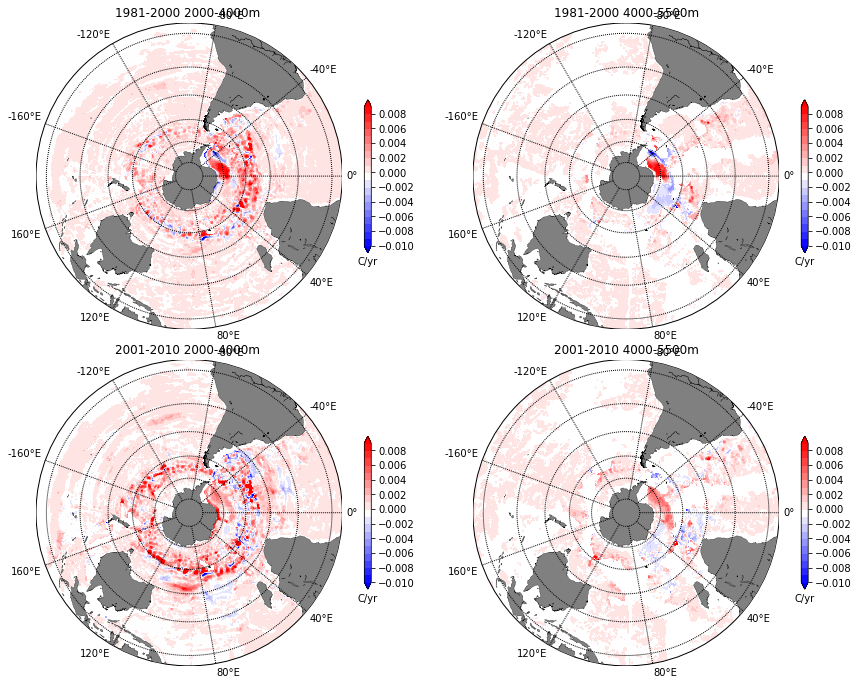

In [11]:
#plot dT/dt K/yr heating trend
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('(1991-2000)-(1981-1990) Decadal Temp Anom')

clev = np.arange(-.01,.01,.001)
#print clev

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-1,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr81to00_pT_2to4-tr81to00_cT_2to4, cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('C/yr')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-2000 2000-4000m ')

#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

clev = np.arange(-.01,.01,.001)

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-1,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr81to00_pT_4to6-tr81to00_cT_4to6,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('C/yr')
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-2000 4000-5500m')


clev = np.arange(-.01,.01,.001)
#print clev

plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-1,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr00to17_pT_2to4-tr00to17_cT_2to4, cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('C/yr')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2001-2010 2000-4000m ')

#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

clev = np.arange(-.01,.01,.001)

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-1,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr00to17_pT_4to6-tr00to17_cT_4to6,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('C/yr')
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2001-2010 4000-5500m')
          
#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
##ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

plt.tight_layout()


of = os.path.join(NYFPertDir,'Tanom_Trend_XY_Eq.png')
plt.savefig(of,dpi=220)

#ax3 = plt.axes([0.92,0.38,0.015,0.25])

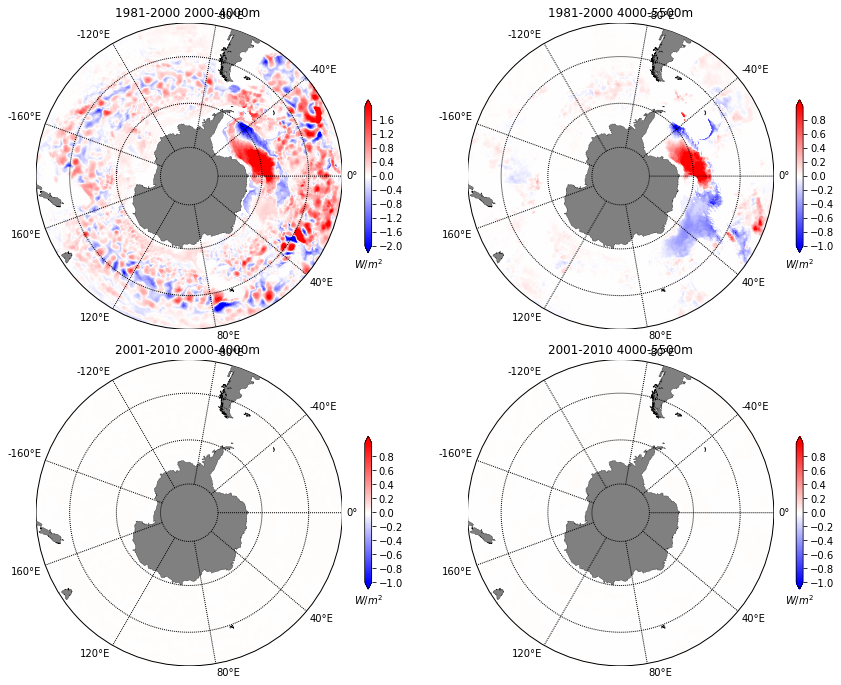

In [16]:
#plot W/m2 heating trend
plt.figure(figsize(12.5,9.5))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
#plt.suptitle('(1991-2000)-(1981-1990) Decadal Temp Anom')

clev = np.arange(-2,2,.01)
#print clev

plt.subplot(2,2,1)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr81to00_pT_2to4_wm2-tr81to00_cT_2to4_wm2, cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('$W/m^2$')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-2000 2000-4000m ')

#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

clev = np.arange(-1,1,.01)

plt.subplot(2,2,2)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr81to00_pT_4to6_wm2-tr81to00_cT_4to6_wm2,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('$W/m^2$')
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('1981-2000 4000-5500m')


plt.subplot(2,2,3)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr00to17_pT_2to4_wm2-tr00to17_cT_2to4_wm2, cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('$W/m^2$')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2001-2010 2000-4000m ')

#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

clev = np.arange(-1,1,.01)

plt.subplot(2,2,4)
map = Basemap(projection='spstere',boundinglat=-40,lon_0=90,resolution='l',round=True)
map.drawcoastlines(linewidth=0.25)
map.fillcontinents(color='gray',lake_color='gray')
# draw parallels and meridians.
map.drawparallels(np.arange(-80.,81.,15.))
map.drawmeridians(np.arange(-160.,181.,40.),labels=[True,True,True,True])
X, Y = map(geolon_t[0:500,:],geolat_t[0:500,:]) 
#cntrl starts 1971, pert in 1973.
#cntrl Tdim ends in 1980, normal starts 1981
p1=map.contourf(X,Y,tr00to17_pT_4to6_wm2-tr00to17_cT_4to6_wm2,cmap=plt.cm.bwr, levels=clev, extend='both') #CMRmap_r, gist_stern_r
cb=plt.colorbar(orientation='vertical',shrink = 0.5)
cb.ax.set_xlabel('$W/m^2$')
#cb.ax.set_xlabel('C')
#clev3 = np.arange(1000,5001,1000)
#map.contour(X,Y,ht[0:500,:],levels=clev3,colors='k',linewidths=1)
plt.title('2001-2010 4000-5500m')

#ax3 = plt.axes([0.99,0.68,0.015,0.25])
#cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
##ticks=[0, 500, 1000, 1500, 2000]
#cb.ax.set_xlabel('$W/m^2$')

plt.tight_layout()
of = os.path.join(NYFPertDir,'Heating_Trend_XY.png')
plt.savefig(of,dpi=220)
#ax3 = plt.axes([0.92,0.38,0.015,0.25])

In [20]:
#do salinity now
#store time-series between 60-65S and 40W-15E for hovmoeller
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-70)
y2=np.argwhere(yt_ocean<-63)
y1=y1[-1]
y2=y2[-1]
print x1, x2
print y1, y2

#this is inaccurate ... area weight for yt_ocean
cTz=cntrl.temp[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print cTz.shape

pTz=pert.temp[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print pTz.shape

[959] [1179]
[104] [170]
(50, 50)
(44, 50)


In [22]:
#store time-series between 70-65S and 40W-15E for hovmoeller
#store time-series between 60-65S and 40W-15E for hovmoeller
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-70)
y2=np.argwhere(yt_ocean<-63)
y1=y1[-1]
y2=y2[-1]
print x1, x2
print y1, y2

#this is inaccurate ... area weight for yt_ocean
cSz=cntrl.salt[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print cTz.shape

pSz=pert.salt[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print pSz.shape

[959] [1179]
[104] [170]


RuntimeError: NetCDF: HDF error

In [ ]:
var2=cntrl.pot_rho_0[:,:,0:500,x1:x2].mean('time').mean('xt_ocean').load()

ii=0
for yr in range(0,numyrs):
    #print yr
    var1=pert.pot_rho_0[yr,:,0:500,x1:x2].mean('xt_ocean').load()
    #print var1.shape, var2.shape
    
    plt.subplot(4,5,yr+1)
    plt.gca().patch.set_color('.25')
    clev = np.linspace(-.01,.01,21)
    
    p1=plt.contourf(yt_ocean[0:500],st_ocean,var1-var2,cmap=plt.cm.PiYG,levels=clev,extend='both')
    #cb=plt.colorbar(orientation='vertical',shrink = 0.7)
    #cb.ax.set_xlabel('kg/m3')
    #plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
    #plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
    plt.gca().invert_yaxis()
    #plt.gca().yaxis.set_major_formatter(x_formatter)
    #plt.ylim((1037.5,1034))
    #plt.ylabel('Depth (m)')
    #plt.xlabel('Latitude ($^\circ$S)')
    plt.xlim([-75,-50])
    plt.title(yrs[yr])
    #plt.title('40W to 15E Temp Anomaly 1976')

ax3 = plt.axes([0.92,0.38,0.015,0.25])
cb = plt.colorbar(p1,cax=ax3,orientation='vertical')
#ticks=[0, 500, 1000, 1500, 2000]
cb.ax.set_xlabel('kg/m3')

#plt.subplot(224)
#plt.gca().patch.set_color('.25')
#clev = np.arange(-.5,.51,0.1)
#plt.contourf(yt_ocean[0:500],st_ocean,np.mean(pert_temp[9,:,:,:],axis=2)-np.mean(cntrl_temp[:,:,:],axis=2),cmap=plt.cm.PiYG,levels=clev,extend='both')
#plt.title('180W to 180E Temp Anomaly 1982')

#of = os.path.join(NYFPertDir,'zavTanom.pdf')
#print of
#plt.savefig(of)
of = os.path.join(NYFPertDir,'zavRhoanom.png')
plt.savefig(of,dpi=220)

In [23]:
#do o2
Ocean_File = os.path.join(NYFCntrlDir,'output*/ocean_bgc_carbon*.nc')
print Ocean_File
cntrl=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print cntrl.o2.shape


Ocean_File = os.path.join(NYFPertDir,'output*/ocean_bgc_carbon*.nc')
print Ocean_File
pert=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='Time',decode_times=False)
print pert.o2.shape

/g/data1/v45/pas561/mom/archive/wombat_jul15b_r0/output*/ocean_bgc_carbon*.nc
(600, 50, 1080, 1440)
/g/data1/v45/pas561/mom/archive/wombat_jul15b_r0_wp2/output*/ocean_bgc_carbon*.nc
(528, 50, 1080, 1440)


In [24]:
#do oxygen Hovmoeller
#store time-series between 70-65S and 40W-15E for hovmoeller
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-70)
y2=np.argwhere(yt_ocean<-63)
y1=y1[-1]
y2=y2[-1]
print x1, x2
print y1, y2

#this is inaccurate ... area weight for yt_ocean
cOz=cntrl.o2[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
cOz2=cntrl2.o2[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print cOz.shape
print cOz2.shape

cOz=np.concatenate((cOz,cOz2),axis=0)
print cOz.shape

of=os.path.join(NYFCntrlDir,'cOz.npy')
a=np.save(of,cOz)

pOz=pert.o2[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print pOz.shape

of=os.path.join(NYFPertDir,'pOz.npy')
a=np.save(of,pOz)


[959] [1179]
[104] [170]


NameError: name 'cntrl2' is not defined

In [ ]:
of=os.path.join(NYFCntrlDir,'cOz.npy')
cOz=np.load(of)
of=os.path.join(NYFPertDir,'pOz.npy')
pOz=np.load(of)

print pOz.shape
print cOz.shape


#plot O2 hovmoeller of depth vs time
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

time = np.arange(-1,20,1)
print time
print time.shape

yrs=np.arange(1972,2016,1)

print cOz[0,:].shape
#var1=np.expand_dims(cOz[0:12,:], axis=0)
#print var1.shape
var2 = np.concatenate((cOz[0:12,:],pOz),axis=0)
print var2.shape

clev = np.arange(0,300,1)
#print clev

mnths=np.arange(0,492,1)

plt.subplot(311)
plt.contourf(mnths,st_ocean,var2.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('mmol/m3')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('70-63S and 40W-15E O2')

clev = np.arange(-25,25,.1)
#print clev

print pOz.shape
a=pOz-cOz[0:pOz.shape[0],:]
print a.shape

plt.subplot(312)
plt.contourf(mnths[0:480],st_ocean,a.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('mmol/m3')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('70-63S and 40W-15E O2 Anom')

clev = np.arange(-10,10,.1)
#print clev

print pOz.shape
a=(pOz-cOz[0:pOz.shape[0],:])/cOz[0:pOz.shape[0],:]*100
print a.shape

plt.subplot(313)
plt.contourf(mnths[0:480],st_ocean,a.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('%')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Months')
#plt.xlim([-75,85])
plt.title('70-63S and 40W-15E O2 % Change')

plt.tight_layout()

of = os.path.join(NYFPertDir,'Weddell_HovO2.png')
plt.savefig(of,dpi=220)


In [ ]:
#store time-series between 60-65S at different depths
#pTz=np.zeros(pert_temp.shape[0],pert_temp.shape[1])
#cTz=np.zeros(pert_temp.shape[0],pert_temp.shape[1])
#print pTz.shape

x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-65)
y2=np.argwhere(yt_ocean<-60)
y1=y1[-1]
y2=y2[-1]
print x1, x2
print y1, y2

#cntrl_ztemp=ff.temp[0:5,:,0:500,859:1279].mean('time').mean('xt_ocean').load()
#need to area average this ...
cTz=cntrl.pot_rho_0[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print cTz.shape

#pert_ztemp=ff.temp[0:5,:,0:500,859:1279].mean('time').mean('xt_ocean').load()
#print pert_ztemp.shape

pTz=pert.pot_rho_0[:,:,y1:y2,x1:x2].mean('yt_ocean').mean('xt_ocean').load()
print pTz.shape

In [ ]:
#plot rho hovmoeller of depth vs time
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

time = np.arange(-1,20,1)
print time
print time.shape

yrs=np.arange(1972,2016,1)

print cTz[0,:].shape
cn1=np.expand_dims(cTz[0,:], axis=0)
print cn1.shape
cn = np.concatenate((cn1,pTz),axis=0)
print cn.shape

clev = np.linspace(1027.7,1027.8,51)
#print clev

plt.subplot(211)
plt.contourf(yrs[0:numyrs+1],st_ocean,cn.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_ylabel('kg/m3')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('60-65S and 40W-15E Rho')

clev = np.linspace(-.01,.01,21)
#print clev

time = np.arange(0,20,1)
print time
print time.shape
print pTz.shape
a=pTz-np.mean(cTz,axis=0)
print a.shape


plt.subplot(212)
plt.contourf(yrs[0:numyrs],st_ocean,a.T,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_ylabel('kg/m3')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('60-65S and 40W-15E Rho Anom')

In [ ]:
#calc zonal average anomalies
#Plot zonal average anomaly across weddell
x1=np.argwhere(xt_ocean<-40)
x2=np.argwhere(xt_ocean<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(yt_ocean<-65)
#y2=np.argwhere(xt_ocean<15)
y1=y1[-1]
#y2=y2[-1]
print x1, x2

In [ ]:
#plot control zavg temp, rho, salt 
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.title('Control Zavg Tracers 40W-15E')

yr=0
var1=cntrl.pot_rho_0[yr,:,0:500,x1:x2].mean('xt_ocean').load()

clev = np.linspace(1027.7,1027.8,51)

plt.subplot(3,1,1)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('kg/m3')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Rho')

var1=cntrl.temp[yr,:,0:500,x1:x2].mean('xt_ocean').load()

clev = np.linspace(-2,2,51)

plt.subplot(3,1,2)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('C')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Temp')

var1=cntrl.salt[yr,:,0:500,x1:x2].mean('xt_ocean').load()

clev = np.linspace(34,35,51)

plt.subplot(3,1,3)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sa')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Salt')



In [ ]:
#compare tracers to WOA13
#Ocean_File = '/g/data1/v45/pas561/mom/archive/woa13_mom025_ocean_temp_salt.res.nc'
#print Ocean_File
#woa=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
#print woa.temp.shape

nc = Dataset('/g/data1/v45/pas561/mom/archive/woa13_mom025_ocean_temp_salt.res.nc', mode='r') # file handle, open in read only mode
grid_xt = nc.variables['GRID_X_T'][:]
grid_yt = nc.variables['GRID_Y_T'][:]
zt = nc.variables['ZT'][:]
woa_temp = nc.variables['temp'][:]
woa_salt = nc.variables['salt'][:]
nc.close() # close the file

print woa_salt.shape, woa_temp.shape, grid_xt.shape, grid_yt.shape, zt.shape

woa_temp=np.squeeze(woa_temp)
woa_salt=np.squeeze(woa_salt)

print woa_salt.shape, woa_temp.shape


In [ ]:
#mask bathy 
#msk=ma.getmask(cntrl.temp[0].load())
msk=cntrl.temp[0].load()
print msk[:,500,500]
print woa_temp[:,500,500]


woa_temp[np.where(isnan(msk))]=nan
print woa_temp[:,500,500]
woa_salt[np.where(isnan(msk))]=nan
print woa_salt[:,500,500]

#woaT=numpy.ma.fix_invalid()
#msk[np.where(msk<-1)]=0
#msk[np.where(msk==-1)]=1


In [ ]:
#calc zonal average anomalies
#Plot zonal average anomaly across weddell
x1=np.argwhere(grid_xt<-40)
x2=np.argwhere(grid_xt<15)
x1=x1[-1]
x2=x2[-1]

y1=np.argwhere(grid_yt<-65)
#y2=np.argwhere(xt_ocean<15)
y1=y1[-1]
#y2=y2[-1]
print x1, x2, grid_xt[x1],grid_xt[x2], grid_yt[y1]



In [ ]:
#plot control zavg temp, rho, salt 
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)
plt.title('WOA13 Zavg Tracers 40W-15E')

yr=0
var1=np.nanmean(woa_temp[:,0:500,x1:x2],axis=2)

clev = np.linspace(1027.7,1027.8,51)

plt.subplot(3,2,1)
plt.gca().patch.set_color('.25')
#p1=plt.contourf(grid_yt[0:500],zt,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
#cb=plt.colorbar(orientation='vertical',shrink = 0.7)
#cb.ax.set_xlabel('kg/m3')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('WOA13 Rho')

yr=0

var1=cntrl.pot_rho_0[yr,:,0:500,x1:x2].mean('xt_ocean').load()

plt.subplot(3,2,2)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('kg/m3')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Rho')


var1=np.nanmean(woa_temp[:,0:500,x1:x2],axis=2)

clev = np.linspace(-2,2,51)

plt.subplot(3,2,3)
plt.gca().patch.set_color('.25')
p1=plt.contourf(grid_yt[0:500],zt,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('C')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('WOA13 Temp')

var1=cntrl.temp[yr,:,0:500,x1:x2].mean('xt_ocean').load()

clev = np.linspace(-2,2,51)

plt.subplot(3,2,4)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('C')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Temp')

var1=np.nanmean(woa_salt[:,0:500,x1:x2],axis=2)

clev = np.linspace(34,35,51)

plt.subplot(3,2,5)
plt.gca().patch.set_color('.25')
p1=plt.contourf(grid_yt[0:500],zt,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sa')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('WOA13 Salt')

var1=cntrl.salt[yr,:,0:500,x1:x2].mean('xt_ocean').load()

clev = np.linspace(34,35,51)

plt.subplot(3,2,6)
plt.gca().patch.set_color('.25')
p1=plt.contourf(yt_ocean[0:500],st_ocean,var1,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sa')
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=clev,colors='k',linewidths=0.25)
#plt.contour(yt_ocean[0:500],st_ocean,pert_ztemp-cntrl_ztemp,levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
#plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1034))
#plt.ylabel('Depth (m)')
#plt.xlabel('Latitude ($^\circ$S)')
plt.xlim([-75,-50])
plt.title('Control Salt')


In [ ]:
#stop current analysis here
## Calc the AMOC from ty_trans for forcing cases

In [ ]:


#calculate the AMOC mask
#-1 is Atl and Arctic, all other ocean is -2, land is 0
#reset to 1 and 0
msk_file='/g/data1/v45/pas561/mom/archive/gfdl_nyf_1080/basin_mask.nc'
nc = Dataset(msk_file, mode='r') # file handle, open in read only mode
msk= nc.variables['kmt'][:]
nc.close() # close the file
print msk.shape
msk[np.where(msk<-1)]=0
msk[np.where(msk==-1)]=1

clev = np.arange(-2,2,1)
print clev

plt.subplot(211)
plt.contourf(geolon_t,geolat_t,msk,cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Mask')
plt.title('AMOC Mask')

In [ ]:
#do AMOC in zspace
Ocean_File = os.path.join(NYFCntrlDir,'output5*/ocean.nc')
print Ocean_File

ff=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print ff.ty_trans.shape

#tt=ff.ty_trans[1,:,500,500].load()
#print 'no mask', tt

ty=ff.ty_trans*msk
print ty.shape
#tt=ty[1,:,500,500].load()
#print 'mask',tt

cntrl_amoc=ty[:,:,:,:].sum('xt_ocean').cumsum('st_ocean').load()

of=os.path.join(NYFCntrlDir,'amoc_z.npy')
a=np.save(of,cntrl_amoc)

In [ ]:
#do AMOC in zspace
Ocean_File = os.path.join(NYFPertDir,'output5*/ocean.nc')
print Ocean_File

ff=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print ff.ty_trans.shape

#tt=ff.ty_trans[1,:,500,500].load()
#print 'no mask', tt

ty=ff.ty_trans*msk
print ty.shape
#tt=ty[1,:,500,500].load()
#print 'mask',tt

pert_amoc=ty[:,:,:,:].sum('xt_ocean').cumsum('st_ocean').load()

of=os.path.join(NYFPertDir,'amoc_z.npy')
a=np.save(of,pert_amoc)

In [ ]:
of=os.path.join(NYFPertDir,'amoc_z.npy')
pert_amoc=np.load(of)
print pert_amoc.shape

of=os.path.join(NYFCntrlDir,'amoc_z.npy')
cntrl_amoc=np.load(of)
print cntrl_amoc.shape


In [ ]:
#Amoc in Z space
plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

clev = np.arange(-20,22,2)

plt.subplot(221)
plt.contourf(yu_ocean,st_ocean,np.mean(cntrl_amoc,axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,st_ocean,np.mean(cntrl_amoc,axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,st_ocean,np.mean(cntrl_amoc,axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m)')
plt.xlabel('Latitude ($^\circ$N)')
plt.xlim([-30,85])
tit='Control Amoc'
plt.title(tit)

t1=0
t2=5

plt.subplot(222)
plt.contourf(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m)')
plt.xlabel('Latitude ($^\circ$N)')
plt.xlim([-30,85])
tit='Perturbed AMOC Years '+str(t1)+'-'+str(t2)
plt.title(tit)

t1=0
t2=5

clev = np.arange(-5,6,.5)

plt.subplot(223)
plt.contourf(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc[t1:t2,:,:],axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc[t1:t2,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc[t1:t2,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m)')
plt.xlabel('Latitude ($^\circ$N)')
plt.xlim([-30,85])
tit='AMOC Anom Years '+str(t1)+'-'+str(t2)
plt.title(tit)

t1=6
t2=10

plt.subplot(224)
plt.contourf(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc,axis=0),cmap=plt.cm.PiYG,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_xlabel('Sv')
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc,axis=0),levels=clev,colors='k',linewidths=0.25)
plt.contour(yu_ocean,st_ocean,np.mean(pert_amoc[t1:t2,:,:],axis=0)-np.mean(cntrl_amoc,axis=0),levels=[0.0,],colors='k',linewidths=0.5)
plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
#plt.ylim((1037.5,1035))
plt.ylabel('Depth (m)')
plt.xlabel('Latitude ($^\circ$N)')
plt.xlim([-30,85])
tit='AMOC Anom Years '+str(t1)+'-'+str(t2)
plt.title(tit)


In [ ]:
#plot time series of AMOC in z space
T=np.arange(14)
print T.shape


# do lower cell average between lats 55-60N
j1=np.argwhere(yt_ocean<55)
j2=np.argwhere(yt_ocean<60)
j1=j1[-1]
j2=j2[-1]

z1=np.argwhere(st_ocean<500)
z1=z1[-1]

uc_cntrl50_psj = cntrl_amoc[:,z1:,j1:j2]
uc_cntrl50_psj_bar = np.mean(uc_cntrl50_psj,2)
uc_cntrl50_psj_ts = np.max(uc_cntrl50_psj_bar,1)

uc_pert50_psj = pert_amoc[:,z1:,j1:j2]
uc_pert50_psj_bar = np.mean(uc_pert50_psj,2)
uc_pert50_psj_ts = np.max(uc_pert50_psj_bar,1)
uc_pert50_psj_ts=np.insert(uc_pert50_psj_ts,0,uc_cntrl50_psj_ts[0])


# do lower cell average between lats 40-45N
j1=np.argwhere(yt_ocean<30)
j2=np.argwhere(yt_ocean<35)
j1=j1[-1]
j2=j2[-1]

uc_cntrl40_psj = cntrl_amoc[:,z1:,j1:j2]
uc_cntrl40_psj_bar = np.mean(uc_cntrl40_psj,2)
uc_cntrl40_psj_ts = np.max(uc_cntrl40_psj_bar,1)

uc_pert40_psj = pert_amoc[:,z1:,j1:j2]
uc_pert40_psj_bar = np.mean(uc_pert40_psj,2)
uc_pert40_psj_ts = np.max(uc_pert40_psj_bar,1)
uc_pert40_psj_ts=np.insert(uc_pert40_psj_ts,0,uc_cntrl40_psj_ts[0])

# do lower cell average between lats 20-25N
j1=np.argwhere(yt_ocean<10)
j2=np.argwhere(yt_ocean<15)
j1=j1[-1]
j2=j2[-1]

uc_cntrl20_psj = cntrl_amoc[:,z1:,j1:j2]
uc_cntrl20_psj_bar = np.mean(uc_cntrl20_psj,2)
uc_cntrl20_psj_ts = np.max(uc_cntrl20_psj_bar,1)

uc_pert20_psj = pert_amoc[:,z1:,j1:j2]
uc_pert20_psj_bar = np.mean(uc_pert20_psj,2)
uc_pert20_psj_ts = np.max(uc_pert20_psj_bar,1)
uc_pert20_psj_ts=np.insert(uc_pert20_psj_ts,0,uc_cntrl20_psj_ts[0])


plt.subplot(211)
plt.plot(uc_pert50_psj_ts,linestyle='-',color='g',linewidth=1.5)
plt.plot(uc_cntrl50_psj_ts,linestyle='-',color='k',label='55-60$^\circ$N',linewidth=2)
plt.plot(uc_pert40_psj_ts,linestyle='--',color='g',linewidth=1.5)
plt.plot(uc_cntrl40_psj_ts,linestyle='--',color='k',label='30-35$^\circ$N',linewidth=2)
plt.plot(uc_pert20_psj_ts,linestyle=':',color='g',linewidth=1.5)
plt.plot(uc_cntrl20_psj_ts,linestyle=':',color='k',label='10-15$^\circ$N',linewidth=2)
#plt.ylim((1037.5,1035))
plt.ylabel('Transport (Sv)')
plt.xlabel('Years')
#plt.xlim([-75,85])
tit='AMOC Upper Cell Z > ' +str(st_ocean[z1])
plt.title(tit)
plt.legend(fontsize=10)

In [ ]:
print np.max(fh[540:1080,:])
print np.min(fh[540:1080,:])

In [ ]:
#Hov of Sea Ice Conc. in Southern Ocean
print xt_ocean[1040]
print xt_ocean[878]

Ocean_File = os.path.join(CntrlDir,'output5*/ice_month.nc')
ff=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print ff.CN.shape
nyf_cn=ff.CN[:,:,:,878:1040].sum('ct').mean('xt').load()
print nyf_cn.shape

Ocean_File = os.path.join(PertDir,'output*/ice_month.nc')
ff=xr.open_mfdataset(Ocean_File,engine='netcdf4',concat_dim='time',decode_times=False)
print ff.CN.shape
pert_cn=ff.CN[:,:,:,878:1040].sum('ct').mean('xt').load()
print pert_cn.shape


In [ ]:
print nyf_cn.shape
print pert_cn.shape
cn = np.concatenate((nyf_cn[0:12,:],pert_cn),axis=0)
print cn.shape

time = np.arange(-12,192,1)
#print time
print time.shape

print xt_ocean[1040]
print xt_ocean[878]

plt.figure(figsize(9.5,12))
x_formatter = matplotlib.ticker.ScalarFormatter(useOffset=False)

clev = np.linspace(0,1.0,11)
print clev

plt.subplot(211)
plt.contourf(time,yt_ocean,cn.T,cmap=plt.cm.CMRmap_r,levels=clev,extend='both')
cb=plt.colorbar(orientation='vertical',shrink = 0.7)
cb.ax.set_ylabel('Concentration')
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=clev,colors='k',linewidths=0.25)
#plt.contour(yu_ocean,potrho,np.mean(cntrl_gmoc[0:4,:,:],axis=0),levels=[0.0,],colors='k',linewidths=0.5)
#plt.gca().invert_yaxis()
plt.gca().yaxis.set_major_formatter(x_formatter)
plt.ylim((-75,-53))
#plt.ylim((1037.5,1035))
plt.ylabel('Latitude ($^\circ$)')
plt.xlabel('Time (Months)')
#plt.xlim([-75,85])
plt.title('Strong/Shift Weddell Sea Sea Ice Concentration')